# 🗽 MBAN 6110 Section T - Airbnb NYC Dataset

Group 10: Christine Tang, Alekhya Erikipati, Yihua Chen, Narotam Dhaliwal, Pui Chin Queenie Sung <br>
* Original Source of Dataset: https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata/data
* Link to dataset (for simplicity): https://drive.google.com/uc?id=1UzJpA4q9NIOSvh75IapWDjM0Op6I75on&export=download
* Data with Proximity Score from Google API: https://drive.google.com/uc?id=1O8NNjuTo436vLi1FyEW1U6UabG5jP3-c&export=download
* Data Dictionary: https://docs.google.com/spreadsheets/d/1b_dvmyhb_kAJhUmv81rAxl4KcXn0Pymz/edit?usp=sharing&ouid=115553841288021300428&rtpof=true&sd=true


Basic Introduction to this dataset:
* Airbnb is an American company who specializes in creating a marketplace for individuals to rent out lodging, properties, vacation rentals, etc. It's considered non-traditional.
* This dataset is scrapped data from Airbnb for properties in New York City (USA), created by Arian Azmoudeh, who took several existing, publicly available datasets of Airbnb and combined together, putting it available on Kaggle.
* In it's original state, there are 102599 entries.

**NOTE: Some Modelling and notebook code is very computationally intense, for each section, I note a recommendation to NOT run, as it may cause issues and crash devices.**

# Introduction - Initial Setup

Optional pip install statement for simplicity:

In [1]:
# pip install pandas numpy seaborn matplotlib scipy tabulate statsmodels

In [ ]:
# pip install python-dotenv

In [ ]:
# pip install scikit-learn

In [ ]:
# pip install textblob

In [2]:
# # Run this in the beginning before importing and using any other packages to speed up modelling.
# # This will only work for Windows operating systems with Intel, Macbooks will not work.
# from sklearnex import patch_sklearn
# patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [3]:
# For Data Analysis, EDA:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from tabulate import tabulate
import statsmodels.api as sm
from scipy.stats import boxcox, norm, probplot
from scipy.stats.mstats import winsorize
from scipy.special import inv_boxcox

# Secret API Key
import os
from dotenv import load_dotenv

# Models
from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso, Ridge
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVR
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import f1_score, precision_recall_curve, precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, PolynomialFeatures, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.inspection import permutation_importance
from statsmodels.stats.outliers_influence import variance_inflation_factor

# External Libraries
import xgboost as xgb
import lightgbm as lgb
import shap

# NLP:
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
import re

In [4]:
# Import dataset
df = pd.read_csv("https://drive.google.com/uc?id=1UzJpA4q9NIOSvh75IapWDjM0Op6I75on&export=download")

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\2936846821.py:2: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("https://drive.google.com/uc?id=1UzJpA4q9NIOSvh75IapWDjM0Op6I75on&export=download")


In [5]:
# Check the successful import:
df.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [6]:
# Check characteristics - We have missing data - from initial check.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

# Part 1: Preliminary EDA (Exploratory Data Analysis)

* Before cleaning, let's take a closer look at the current types, data structures, any anomalies with the data.
* We may need to conduct EDA once again after cleaning, as some columns need some initial cleaning before analysis (i.e $ preventing from recognition as numerical variable.)

In [7]:
# Summary Statistics:
df.describe(include = "all")

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
count,1.025990e+05,102349,1.025990e+05,102310,102193,102570,102583,102591.000000,102591.000000,102067,...,102326,102190.000000,102416.000000,86706,86720.000000,102273.000000,102280.000000,102151.000000,50468,2
unique,NaN,61281,NaN,2,13190,7,224,NaN,NaN,1,...,231,NaN,NaN,2477,NaN,NaN,NaN,NaN,1976,1
top,NaN,Home away from home,NaN,unconfirmed,Michael,Manhattan,Bedford-Stuyvesant,NaN,NaN,United States,...,$41,NaN,NaN,6/23/2019,NaN,NaN,NaN,NaN,#NAME?,41662/AL
freq,NaN,33,NaN,51200,881,43792,7937,NaN,NaN,102067,...,526,NaN,NaN,2443,NaN,NaN,NaN,NaN,2712,2
mean,2.914623e+07,NaN,4.925411e+10,NaN,NaN,NaN,NaN,40.728094,-73.949644,NaN,...,NaN,8.135845,27.483743,NaN,1.374022,3.279106,7.936605,141.133254,NaN,NaN
std,1.625751e+07,NaN,2.853900e+10,NaN,NaN,NaN,NaN,0.055857,0.049521,NaN,...,NaN,30.553781,49.508954,NaN,1.746621,1.284657,32.218780,135.435024,NaN,NaN
min,1.001254e+06,NaN,1.236005e+08,NaN,NaN,NaN,NaN,40.499790,-74.249840,NaN,...,NaN,-1223.000000,0.000000,NaN,0.010000,1.000000,1.000000,-10.000000,NaN,NaN
25%,1.508581e+07,NaN,2.458333e+10,NaN,NaN,NaN,NaN,40.688740,-73.982580,NaN,...,NaN,2.000000,1.000000,NaN,0.220000,2.000000,1.000000,3.000000,NaN,NaN
50%,2.913660e+07,NaN,4.911774e+10,NaN,NaN,NaN,NaN,40.722290,-73.954440,NaN,...,NaN,3.000000,7.000000,NaN,0.740000,3.000000,1.000000,96.000000,NaN,NaN
75%,4.320120e+07,NaN,7.399650e+10,NaN,NaN,NaN,NaN,40.762760,-73.932350,NaN,...,NaN,5.000000,30.000000,NaN,2.000000,4.000000,2.000000,269.000000,NaN,NaN


In [8]:
df.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [9]:
# Check general count
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [10]:
# Identify the numerical vs. categorical variables
numerical_columns = []
categorical_columns = []


def var_identification(df):
    # This function will check the categorical and numerical columns of the dataframe
    global numerical_columns, categorical_columns
    numerical_columns = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_columns = df.select_dtypes(exclude=[np.number]).columns.tolist()

    # Check results
    print("Airbnb - Numerical Features:")
    print(numerical_columns)

    print("\n Airbnb - Categorical Features:")
    print(categorical_columns)

In [11]:
# First Check:
var_identification(df)

# We notice some issues, notably service fee and price are categorical. We need to clean this up for a clearer analysis.

Airbnb - Numerical Features:
['id', 'host id', 'lat', 'long', 'Construction year', 'minimum nights', 'number of reviews', 'reviews per month', 'review rate number', 'calculated host listings count', 'availability 365']

 Airbnb - Categorical Features:
['NAME', 'host_identity_verified', 'host name', 'neighbourhood group', 'neighbourhood', 'country', 'country code', 'instant_bookable', 'cancellation_policy', 'room type', 'price', 'service fee', 'last review', 'house_rules', 'license']


### Initial Cleaning Treatment - Convert Price and Service Fee

In [12]:
# Due to the $, it looks like "service fee" and "price" were considered categorical. While we do have a section for data cleaning later, let's fix this problem now.
# Data Cleaning, remove $ from all the price, service_fee columns, since it's useless information

# Remove $ for clarity - Price
df['price'] = df['price'].str.replace('$', '').str.replace(',', '').astype(float)

# Remove $ for clarity - Service Fee
df['service fee'] = df['service fee'].str.replace('$', '').str.replace(',', '').astype(float)

In [13]:
# Confirm they are now the correct data type - we can see it worked, it's now float64 vs. object
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [14]:
# Check the identification of variables now:
var_identification(df)

Airbnb - Numerical Features:
['id', 'host id', 'lat', 'long', 'Construction year', 'price', 'service fee', 'minimum nights', 'number of reviews', 'reviews per month', 'review rate number', 'calculated host listings count', 'availability 365']

 Airbnb - Categorical Features:
['NAME', 'host_identity_verified', 'host name', 'neighbourhood group', 'neighbourhood', 'country', 'country code', 'instant_bookable', 'cancellation_policy', 'room type', 'last review', 'house_rules', 'license']


## Initial Insights - Data Types for Airbnb:

Numerical Variables:
* Note that "id" is a unique identifier, so likely it will not be much helpful - we should also validate it is actually unique for "ID".
* There appears to be "symbols" like $ causing issues for currency metrics like price, which was fixed.
* Lat/Long - geo coordinates which can help with some distance or location based features in the future.
* There appears to be some unusually high max values for "minimum nights" which should be investigated later, and determined if it makes sense.
* Missing data from number of reviews, reviews per month coming from here - likely MNAR - can't have bookings as the property was not available (will discuss in Part 2)
* Availability 365 - may have outliers, need to check if data entry or a consistent trend.


Categorical Variables:
* License is a not-relevant variable, so it will likely be removed in the next section for data cleaning.
* Missing data from "house rules" - likely MNAR or MAR (host didn't have the rules to begin with)

In [15]:
# Initial Univariate Analysis: Numerical and Categorical
# The code below will generate a bar plot and pie chart to check the structure of the categorical variable.

def categorical_var_graphs(df, col_name):

    def create_bar_plot(df, col_name):
        # Setup:
        data = df[col_name].value_counts().reset_index()

        # Function to format pie chart labels with counts
        def autopct_format(values):
            def my_format(pct):
                total = sum(values)
                val = int(round(pct * total / 100.0))
                return f'{pct:.1f}% ({val:d})'
            return my_format

        # Add percentage to the table here:
        data["percentage"] = data["count"] / (data["count"].sum())
        data.columns = ["X-Var", "count", "percentage"]

        # Plot the graph and some other adjustments
        plt.figure(figsize=(10,6))
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.xticks(fontsize=10)
        plt.title(f"Barplot of: {col_name}")
        ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")
        ax.set(xlabel= str(col_name), ylabel= 'Percentage')

        # Add some labels for each axis patch:
        for item in ax.patches:
            percentage = '{:.1f}%'.format(item.get_height()*100)
            x = item.get_x() + item.get_width() / 2 - 0.05
            y = item.get_height()
            ax.annotate(percentage, (x, y), ha='center', va='bottom')
        return plt.show()

    # Pie charts for categorical features
    def plot_pie_chart(df, col_name):
        # Create pie plot
        plt.figure(figsize=(8, 8))
        
        # Get value counts for the column
        data = df[col_name].value_counts()
        # Calculate explode values to slightly pull out small slices for emphasis
        explode = [0.05 if size < data.max() * 0.1 else 0 for size in data]   

        # Plot the pie chart without labels, percentages well spaced
        wedges, texts, autotexts = plt.pie(
                data, 
                explode = explode,
                labels=None, 
                autopct=lambda p: f'{p:.1f}%', 
                startangle=140,
                pctdistance=0.85,  # Distance of the percentage labels from the center
                labeldistance=1.7, # Distance of the labels from the center
                radius=1.2,         # Radius for more space
            )
    
        
        # Set title and legend
        plt.title(f"Pie Chart of {col_name}")
        plt.legend(wedges, data.index, title=col_name, bbox_to_anchor=(1.3, 1), loc='upper left')
        
        plt.ylabel('')
        plt.show()
    
    # Create the plots:
    create_bar_plot(df, col_name)
    plot_pie_chart(df, col_name)

In [16]:
# Similar concept, but for numerical variables - univariate analysis:

def numerical_var_graphs(df, col_name):

    # Create a histplot for distribution check.
    def create_histplot(df, col_name):
        # Create histplot:
        plt.figure(figsize = (10,6))
        # Create the title and make plot
        plt.title(f"Histogram of {col_name}")
        sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape
        
        # Show plot
        plt.show()

    # Create boxplot as part of analysis
    def create_boxplot(df, col_name):
        # Make the figure
        plt.figure(figsize=(7, 5))
        plt.title(f"Boxplot: {col_name}")
        bp = sns.boxplot(data=df, x=col_name)
        plt.show()

        # Print the median:
        print(f"The median for {col_name} is {df[col_name].median()}")
        

    # Call and make the plots under the main function:
    create_histplot(df, col_name)
    create_boxplot(df, col_name)

In [17]:
# Bivariate Analysis - Let's look at it via a scatterplot.
def plot_scatter(df, x_col, y_col):

    # Set up the scatterplot:
    plt.figure(figsize=(10, 6))

    #  Make the plot, including a regression line
    sns.regplot(x=x_col, y=y_col, data=df, scatter_kws={'s': 10}, line_kws={'color': 'red'})
    plt.title(f'{x_col} vs. {y_col}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.show()

In [18]:
# Before we plot and run the code, we should clean up the numerical and categorical column lists.
# Categorical Column List - let's remove "license", "NAME", "host_name", as it's redundant and won't make sense for plotting.
# "House Rules" is open-ended too, we will remove.
# Finally, we also remove "last review" since that's more of a variable to convert for Date-time later:
categorical_columns = ['host_identity_verified', 'neighbourhood group', 'neighbourhood', 'country', 'country code', 'instant_bookable', 'cancellation_policy', 'room type']

In [19]:
# Same thing - let's clean up the list.
# Some redundant columns for numerical are:
# ID, Host_ID, Lat/Long since it's coordinates for location),

numerical_columns = ['Construction year',
 'price',
 'service fee',
 'minimum nights',
 'number of reviews',
 'reviews per month',
 'review rate number',
 'calculated host listings count',
 'availability 365']

In [20]:
# Before we continue, let's check if the unique_ID for "ID" is truly unique. We see from df.head() that it might not be.
# Let's check for duplicates...

# Identify the duplicated rows based on the 'id' column
duplicated_rows = df[df.duplicated(subset='id', keep=False)]

# Sort the duplicated rows by 'id' for better readability
duplicated_rows_sorted = duplicated_rows.sort_values(by='id')

# Group by 'id' and check if all rows in each group are identical
duplicate_groups = duplicated_rows_sorted.groupby('id').apply(lambda x: x.nunique(dropna=False) == 1)

# Extract the rows where all columns are identical
identical_duplicates = duplicate_groups[duplicate_groups.all(axis=1)]

# Extract the rows where there are differences
non_identical_duplicates = duplicate_groups[~duplicate_groups.all(axis=1)]

identical_ids = identical_duplicates.index.tolist()
non_identical_ids = non_identical_duplicates.index.tolist()

identical_rows = duplicated_rows_sorted[duplicated_rows_sorted['id'].isin(identical_ids)]
non_identical_rows = duplicated_rows_sorted[duplicated_rows_sorted['id'].isin(non_identical_ids)]

# Check duplications
print("Identical Duplicate Rows:")
print(identical_rows)
print("\nNon-Identical Duplicate Rows:")
print(non_identical_rows)

Identical Duplicate Rows:
              id                                               NAME  \
9098     6026161     Upper East Side 2 bedroom- close to Hospitals-   
102474   6026161     Upper East Side 2 bedroom- close to Hospitals-   
102475   6026714  Close to East Side Hospitals- Modern 2 Bedroom...   
9099     6026714  Close to East Side Hospitals- Modern 2 Bedroom...   
9100     6027266  ACADIA Spacious 2 Bedroom Apt - Close to Hospi...   
...          ...                                                ...   
62657   35606797        Bright and Beautiful Top Floor Two Bedrooms   
102240  35607349         Modern & Bright Queen Bedroom Midtown East   
62658   35607349         Modern & Bright Queen Bedroom Midtown East   
102241  35607902                   Modern NEW Room|PRIVATE BATHROOM   
62659   35607902                   Modern NEW Room|PRIVATE BATHROOM   

            host id host_identity_verified       host name  \
9098    65193709566               verified         Juliana 

### Validation: Unique ID identifier under "ID" column:

In [21]:
# From above, we unfortunately do see 1082 rows that are duplicated, and all of them have the same information for each column.

# Run this code only once!
# We can safely remove the duplicates, since it's the same information.
df.drop_duplicates(subset='id', keep='first', inplace = True)

In [22]:
# Validation - let's check if unique.
print(df["id"].is_unique)

# Example - we saw ID # 6026161 was 
df[df["id"] == 6026161]

True


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
9098,6026161,Upper East Side 2 bedroom- close to Hospitals-,65193709566,verified,Juliana,Manhattan,Upper East Side,40.76222,-73.9603,United States,...,21.0,30.0,2.0,6/8/2019,0.21,3.0,34.0,157.0,NaN,NaN


In [23]:
# Let's see how many rows of data we have now. We lose over 1000 rows but still lots of data.
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 102058 entries, 0 to 102057
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102058 non-null  int64  
 1   NAME                            101808 non-null  object 
 2   host id                         102058 non-null  int64  
 3   host_identity_verified          101769 non-null  object 
 4   host name                       101654 non-null  object 
 5   neighbourhood group             102029 non-null  object 
 6   neighbourhood                   102042 non-null  object 
 7   lat                             102050 non-null  float64
 8   long                            102050 non-null  float64
 9   country                         101526 non-null  object 
 10  country code                    101927 non-null  object 
 11  instant_bookable                101953 non-null  object 
 12  cancellation_policy  

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


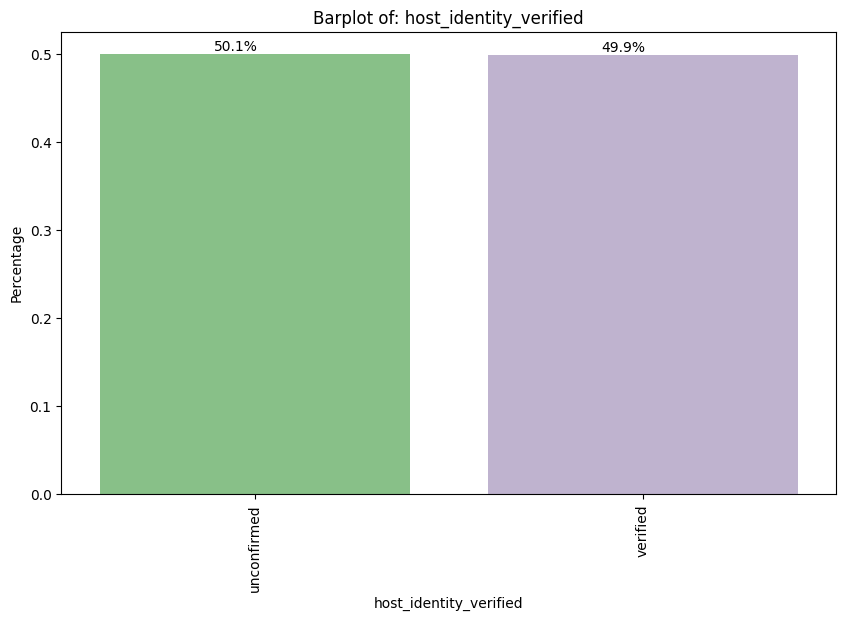

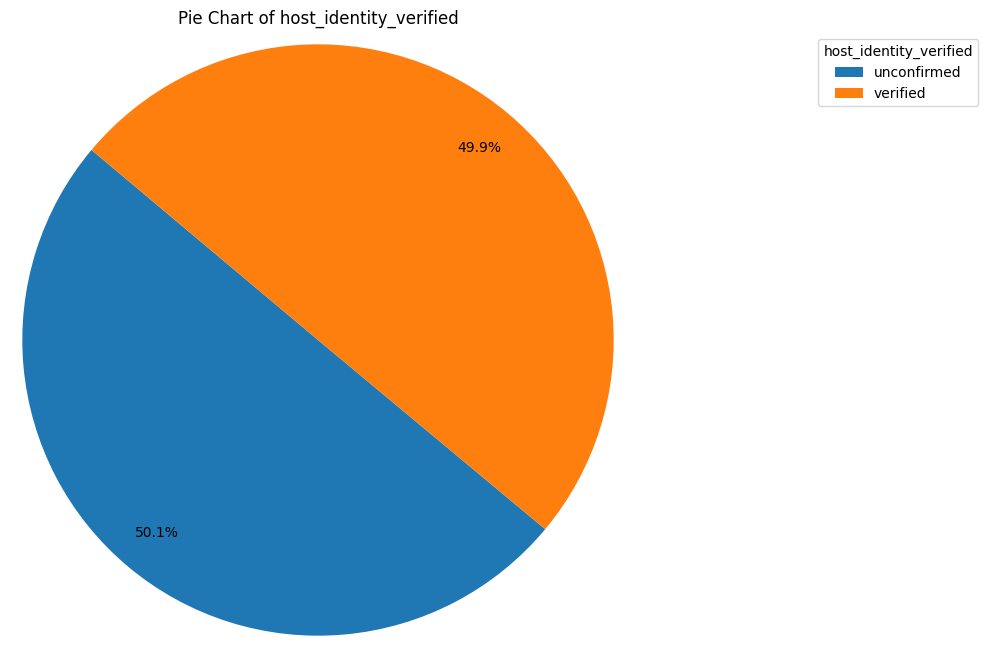

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


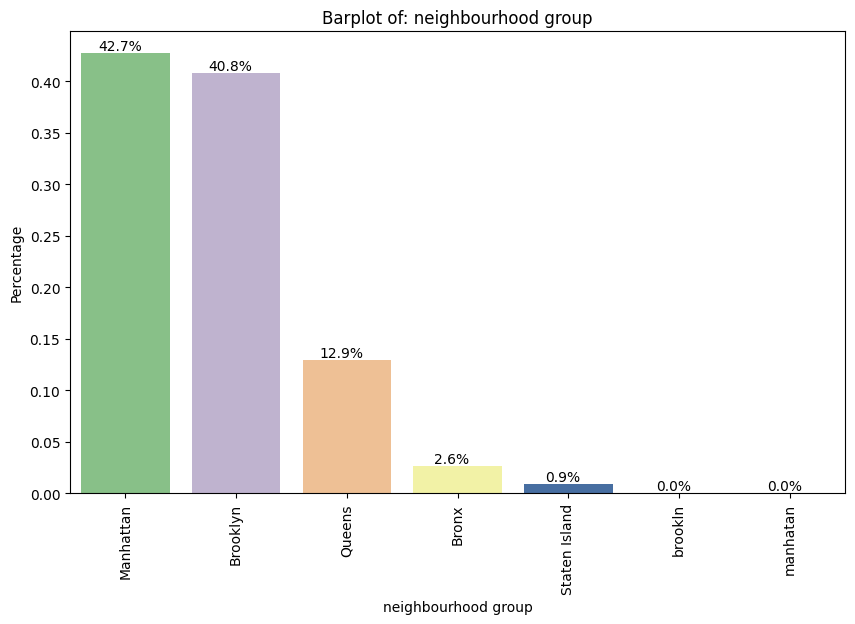

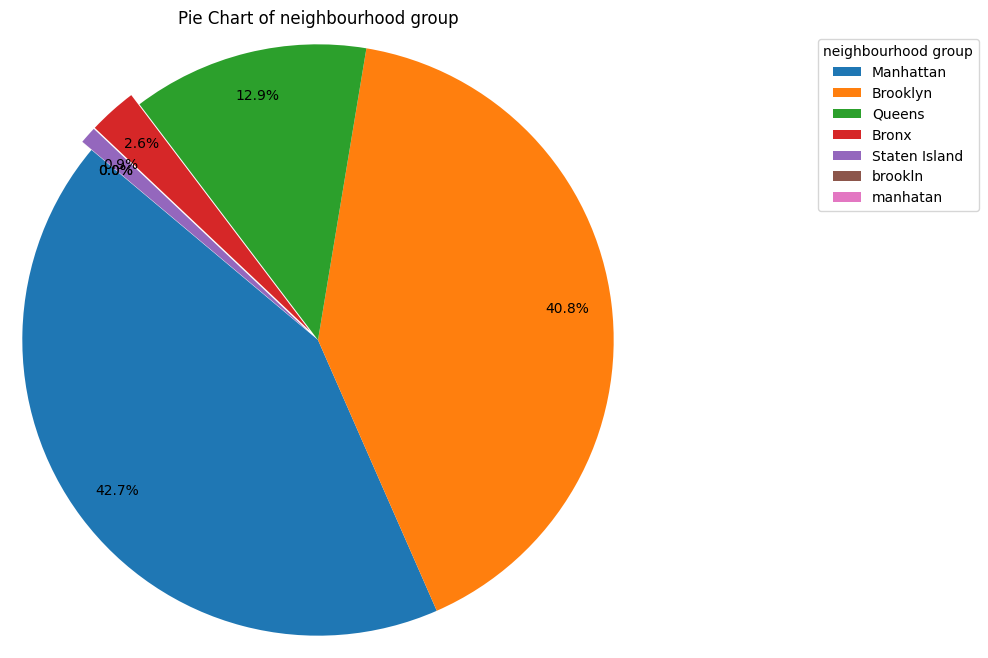

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


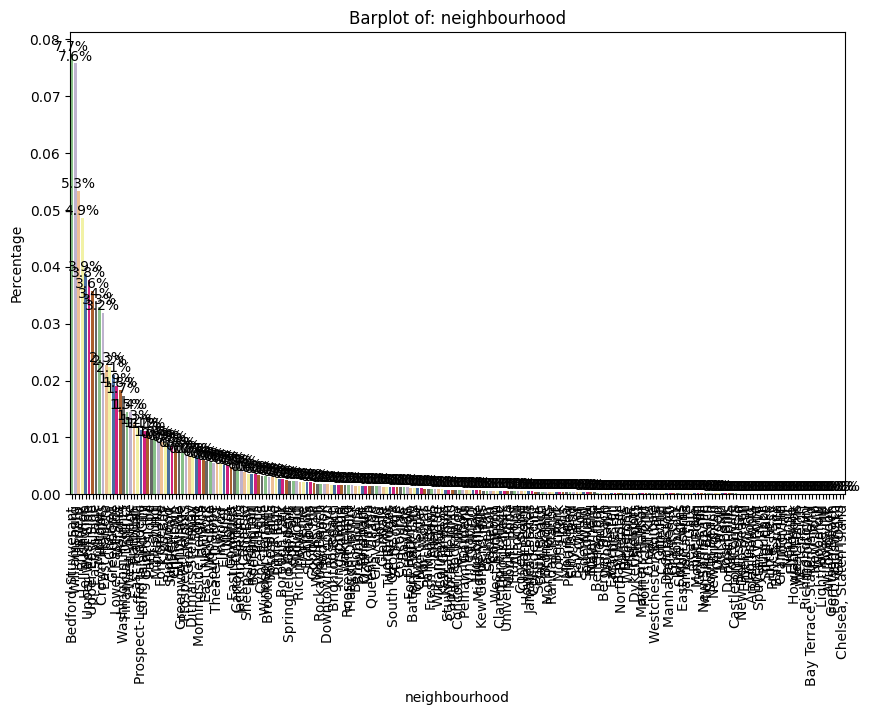

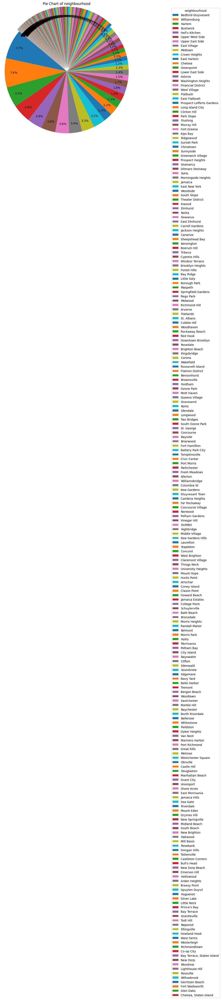

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


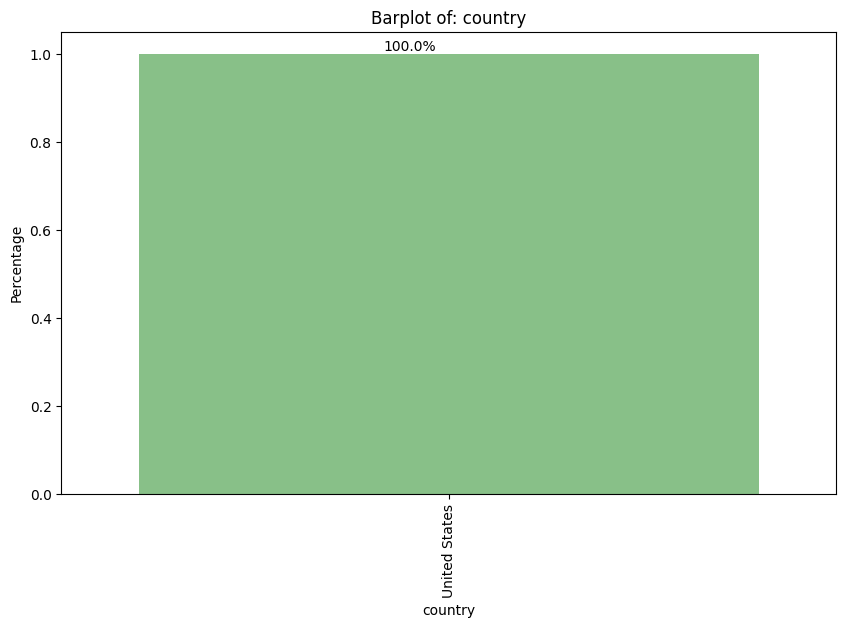

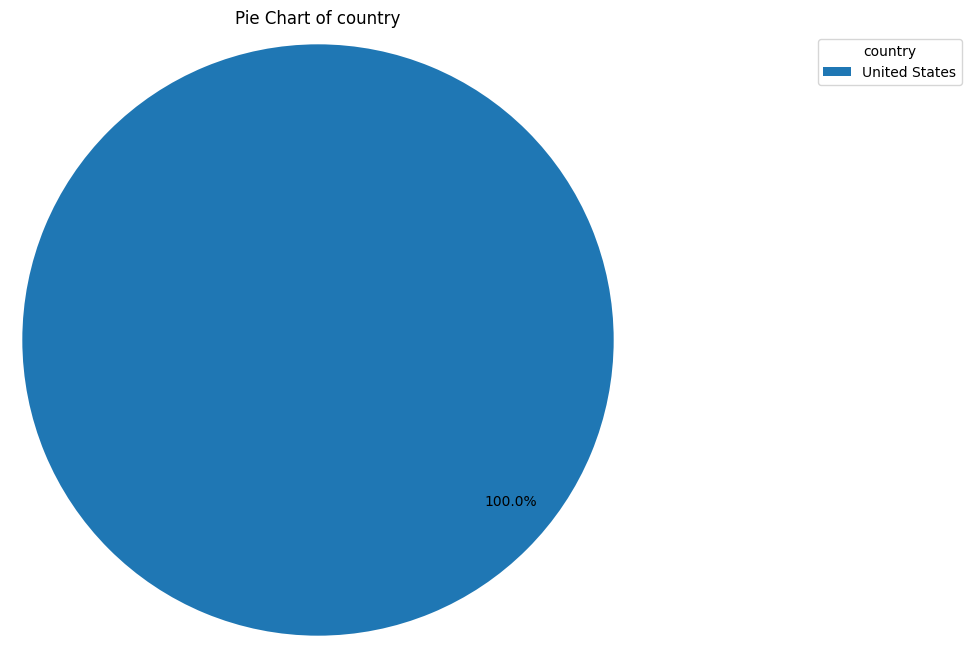

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


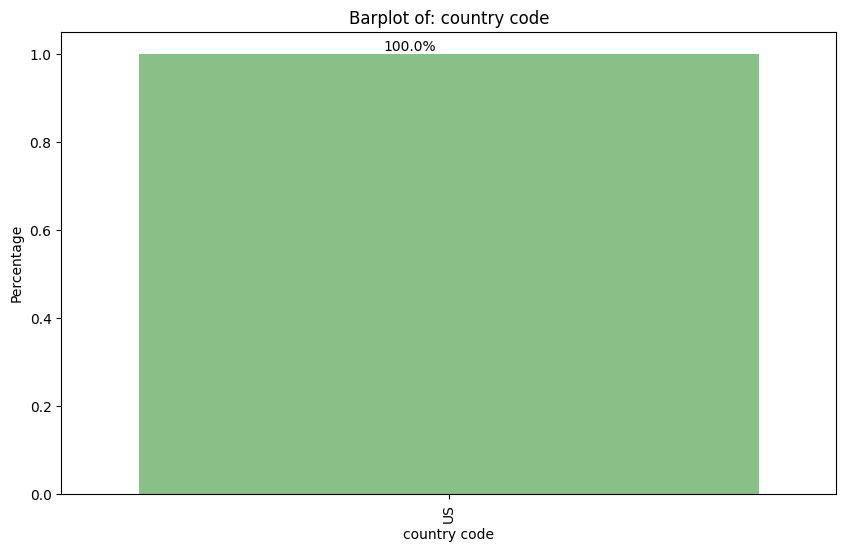

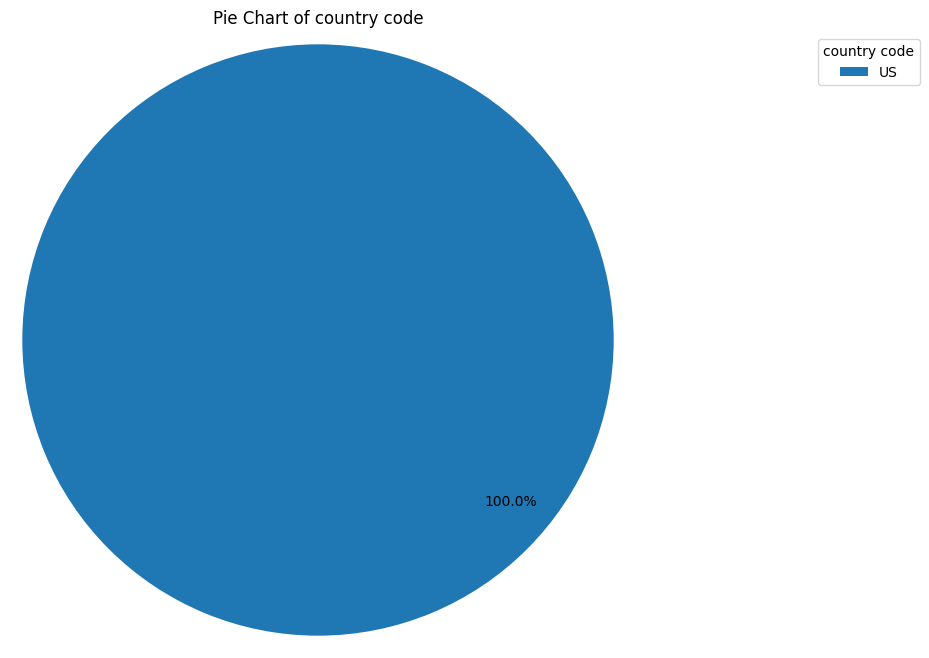

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


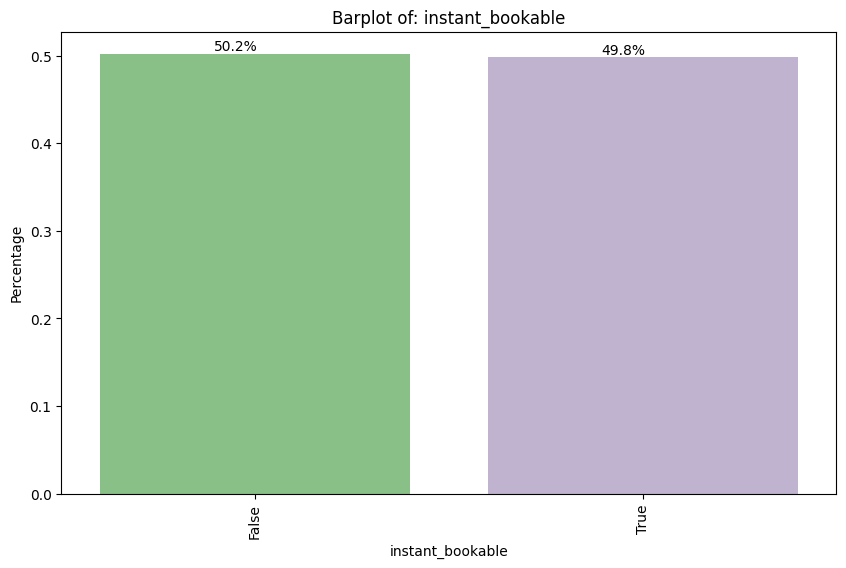

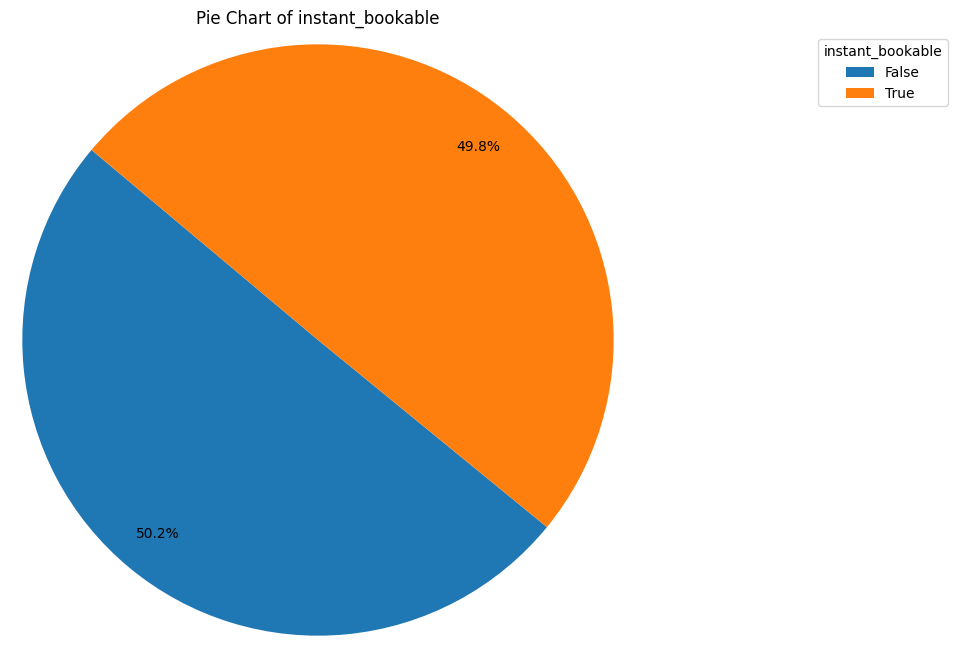

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


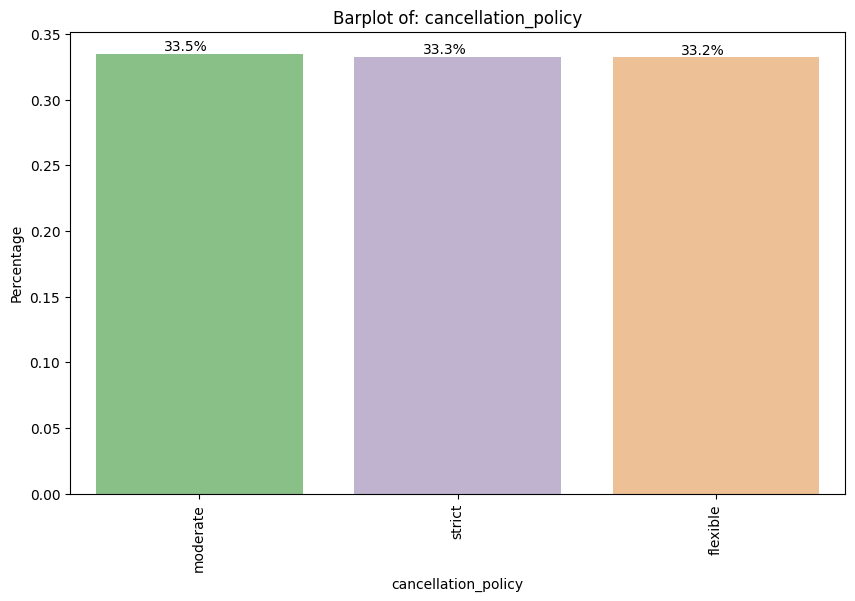

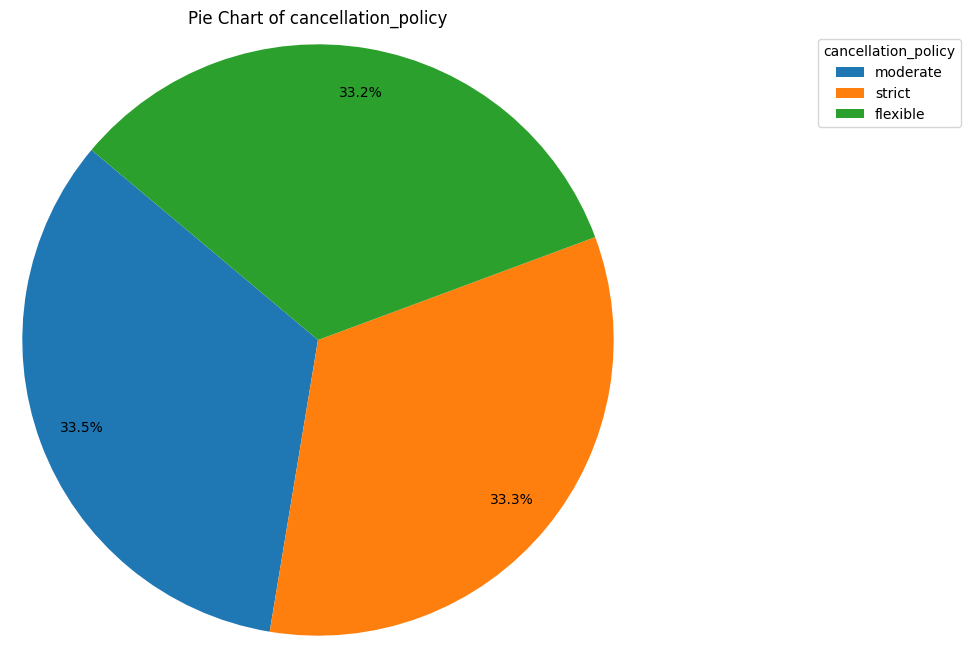

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\4126028614.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data, x="X-Var", y='percentage', palette="Accent")


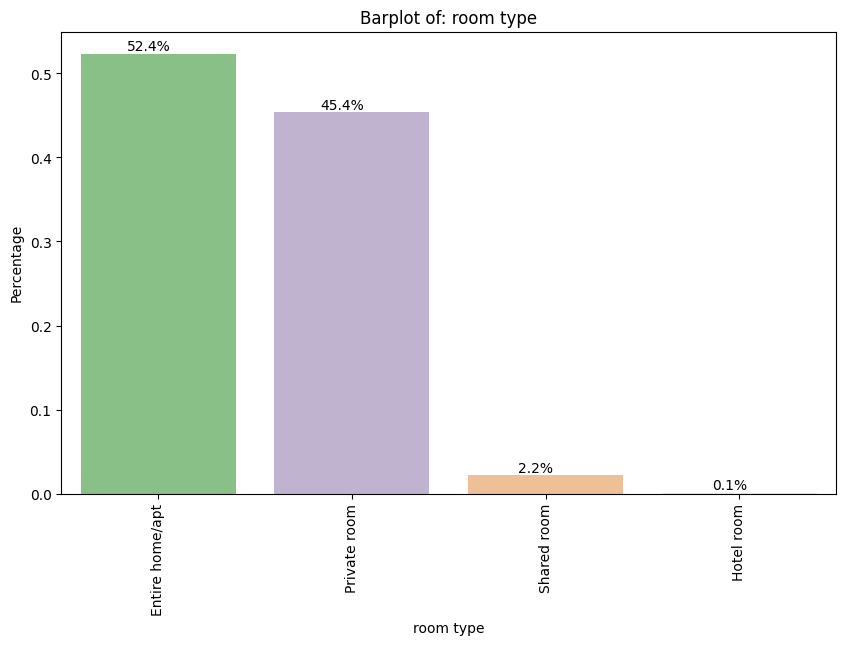

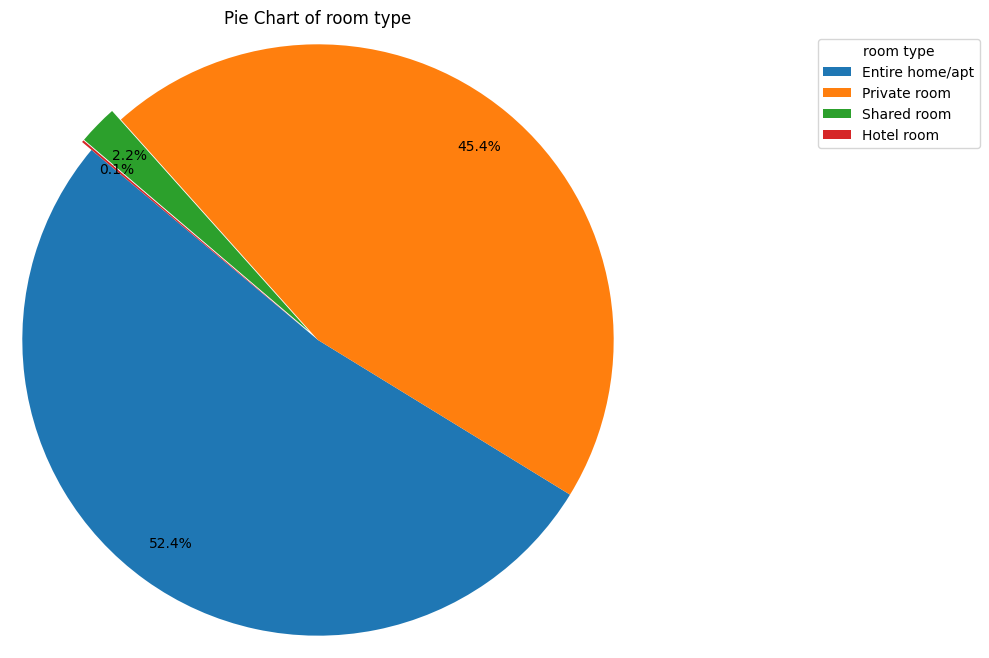

In [24]:
# Create Categorical plots for analysis:
for col in categorical_columns:
    categorical_var_graphs(df, col)

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


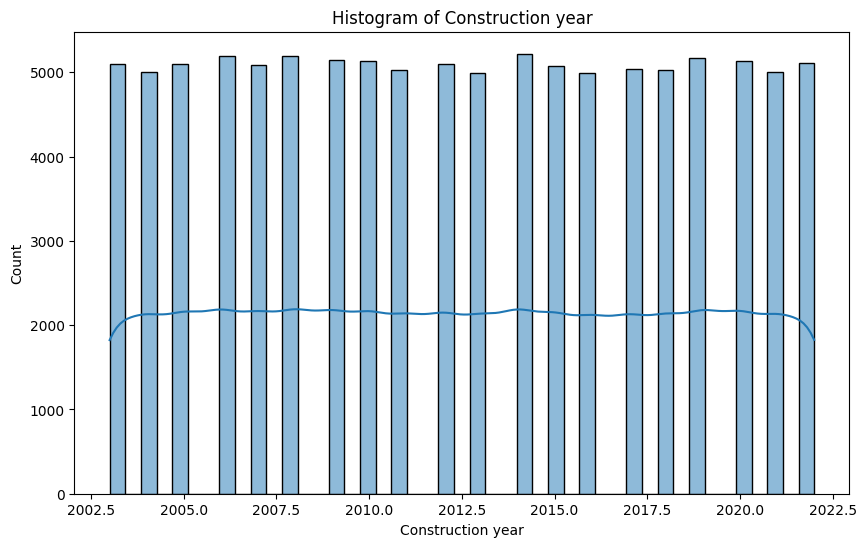

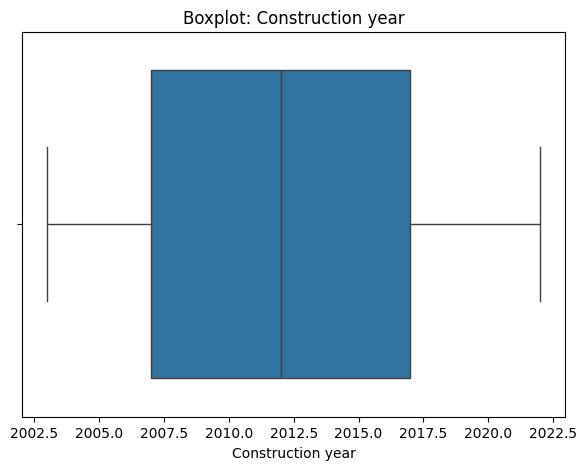

The median for Construction year is 2012.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


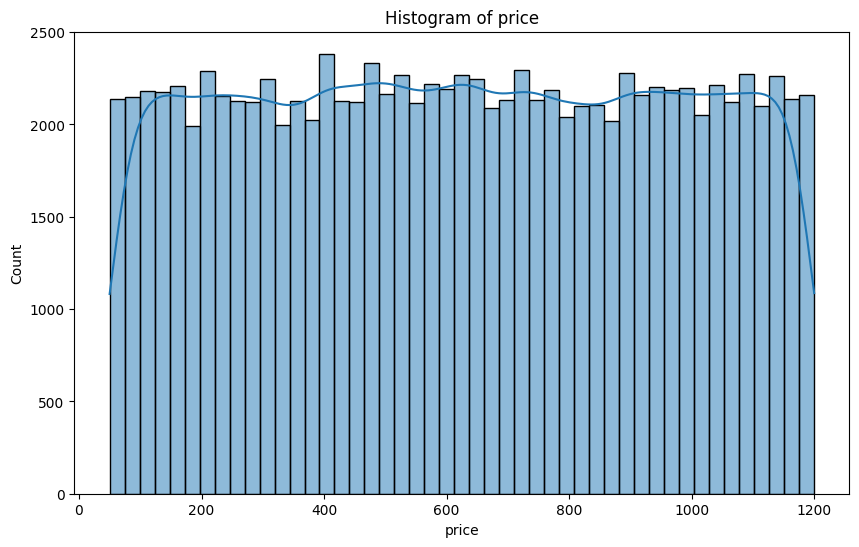

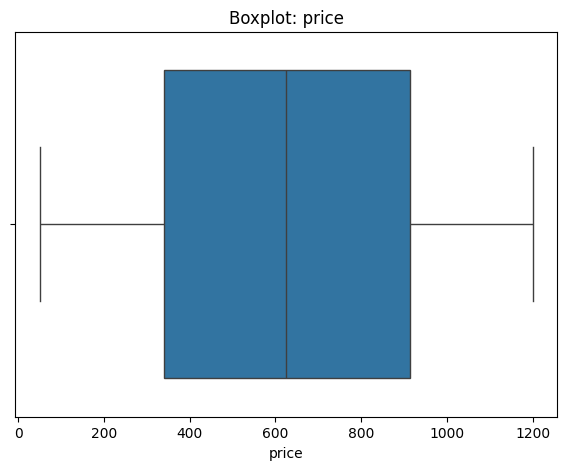

The median for price is 625.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


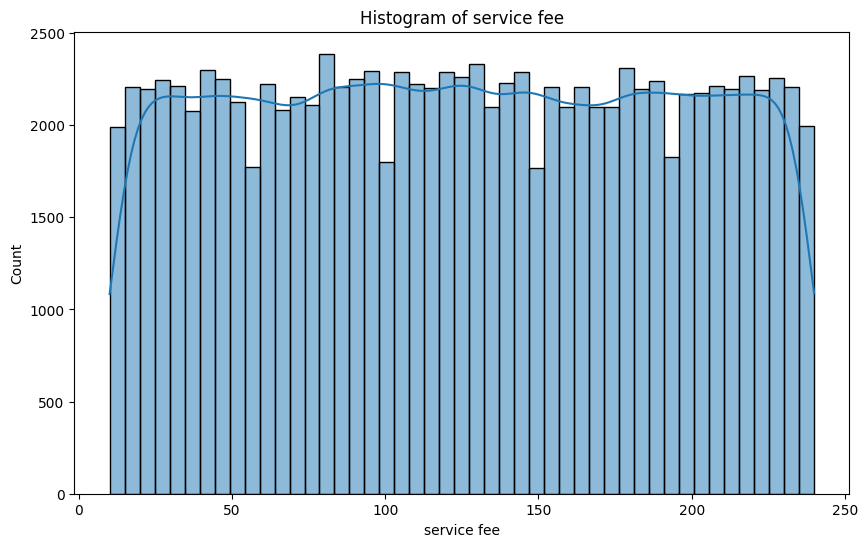

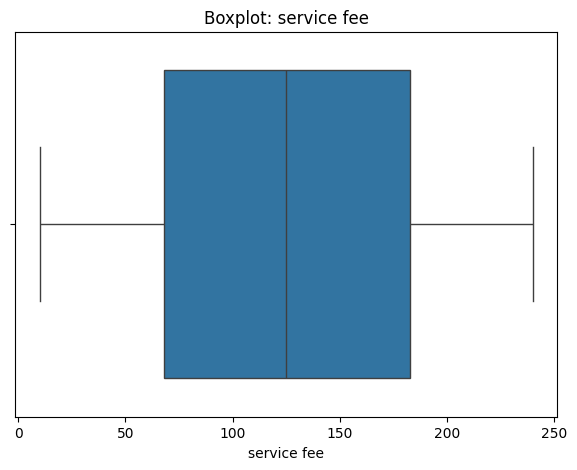

The median for service fee is 125.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


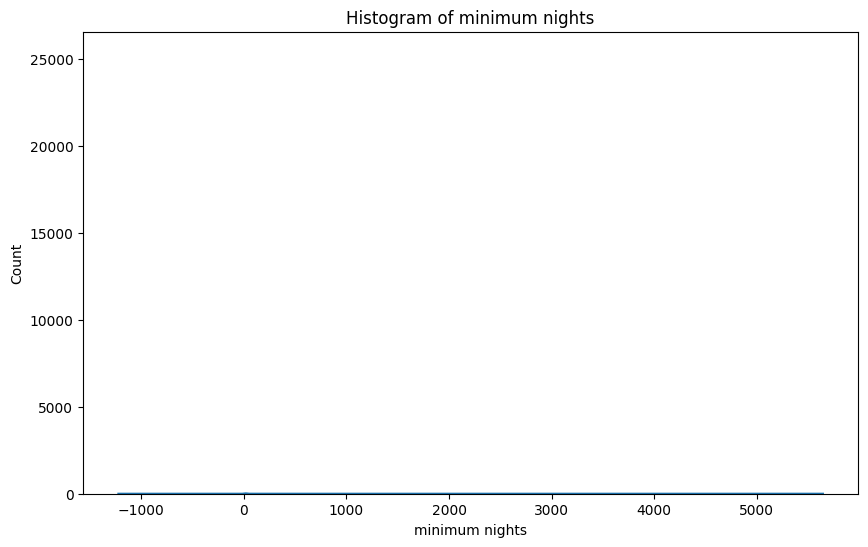

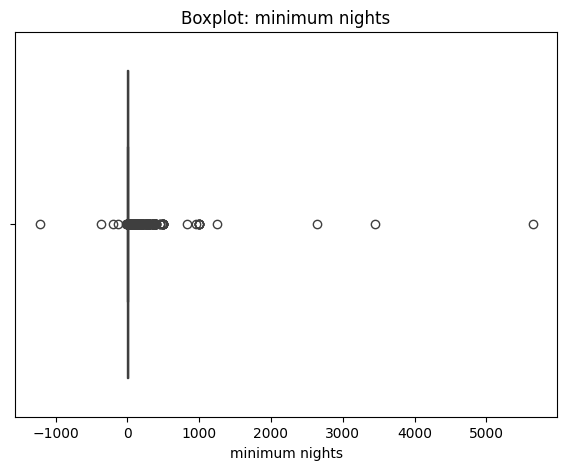

The median for minimum nights is 3.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


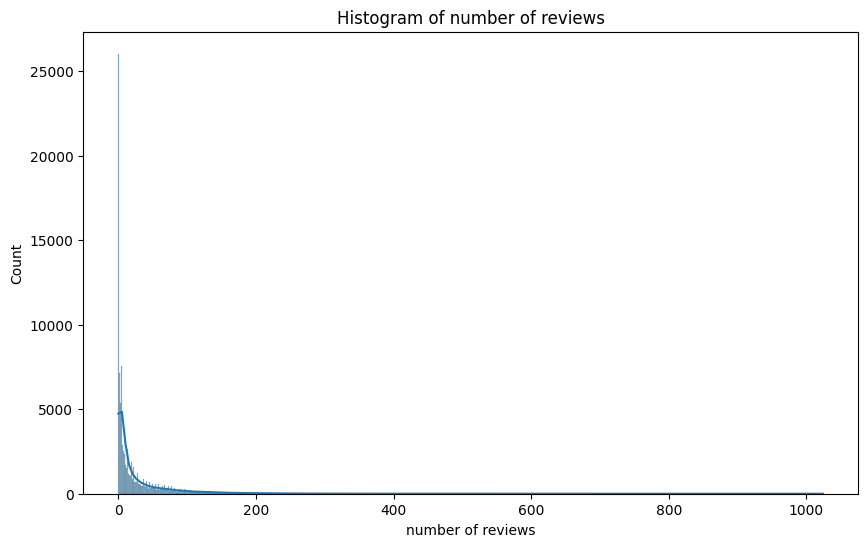

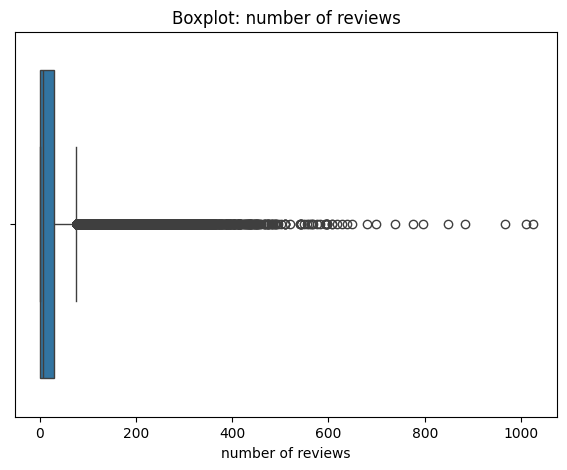

The median for number of reviews is 7.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


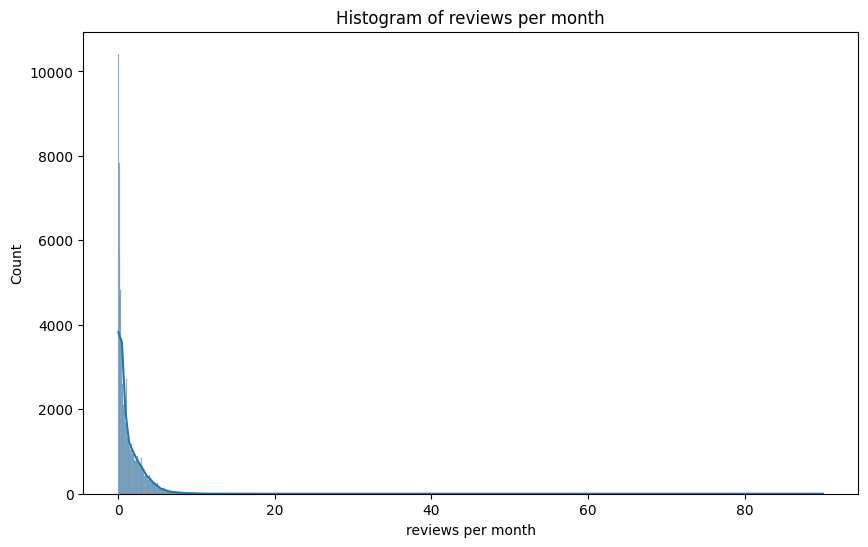

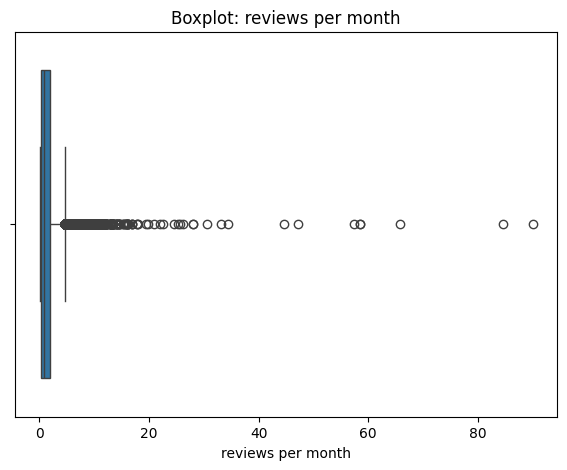

The median for reviews per month is 0.74


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


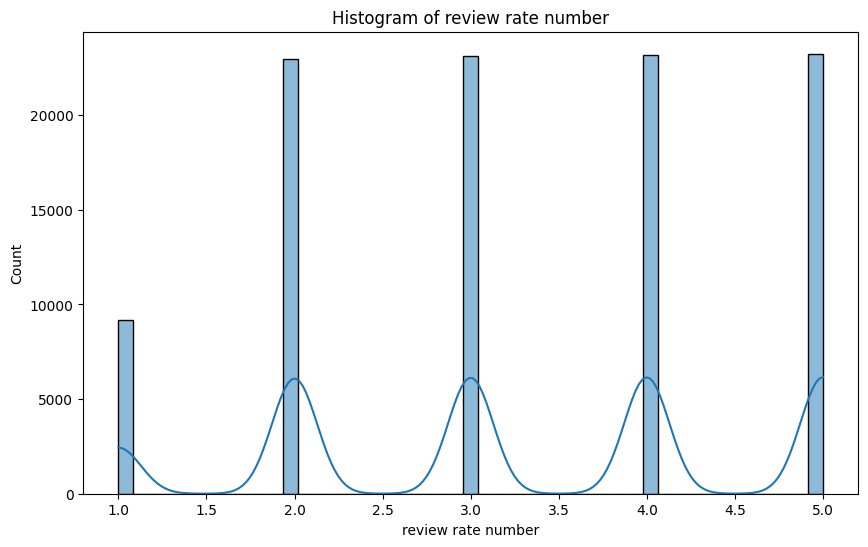

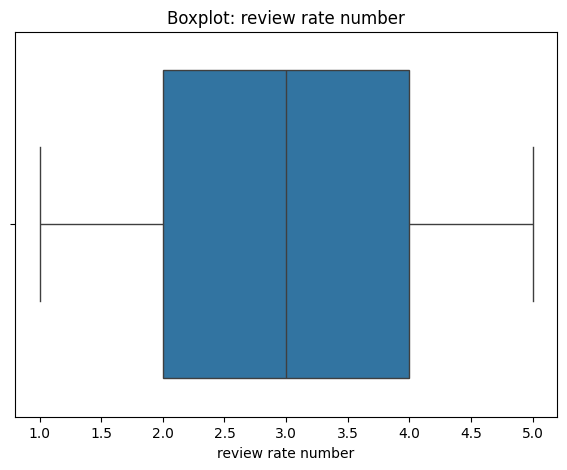

The median for review rate number is 3.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


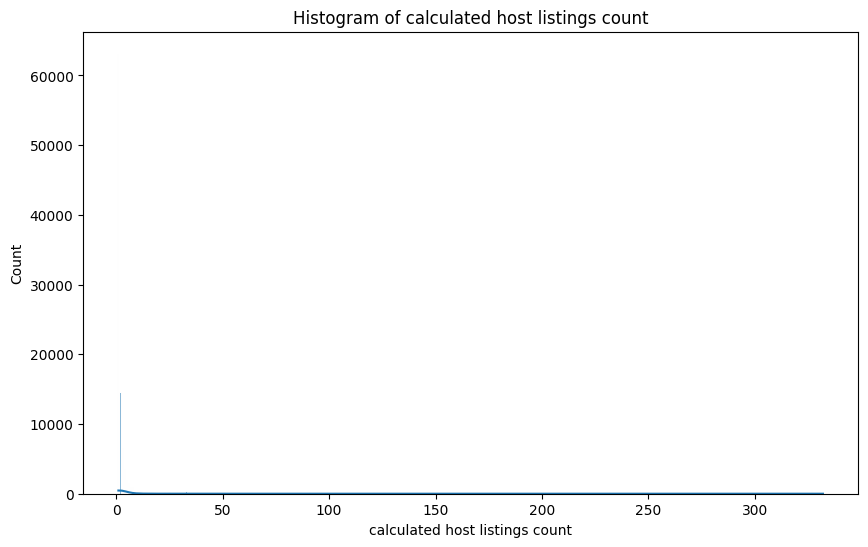

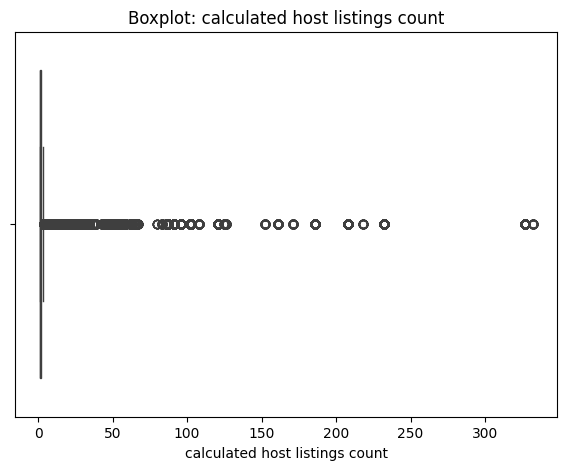

The median for calculated host listings count is 1.0


C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


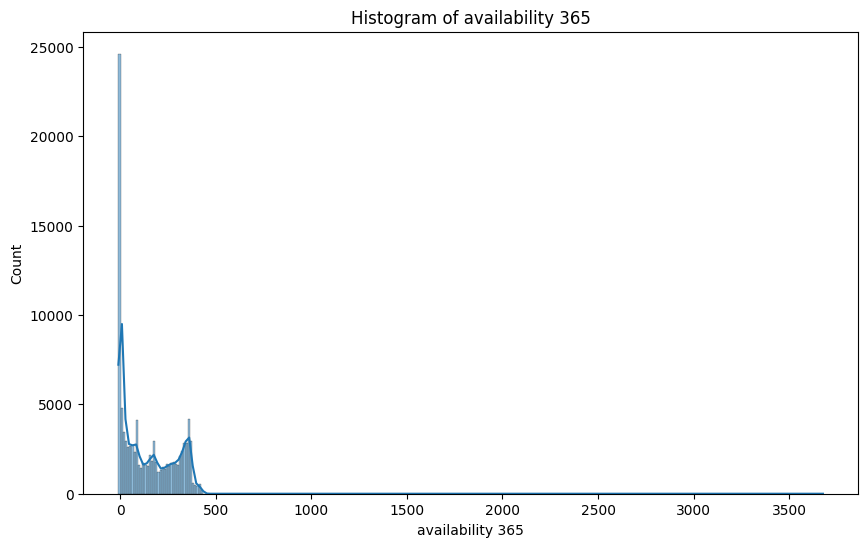

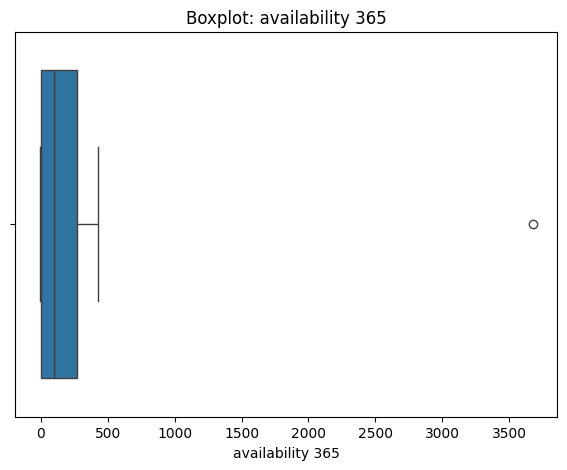

The median for availability 365 is 96.0


In [25]:
# Loop and create plots - numerical:
for col in numerical_columns:
    numerical_var_graphs(df, col)

### Insights - Visualizations and "ID" Validation.

Note - the results might change once we do some data cleaning and treatment of null values.

Categorical Variables: 
* Some variables are surprisingly balanced in representation, for example, verified and non-verified number of hosts, and instant bookable, cancellation polciy.
* Neighbourhood Group concentration is Manhattan and Brooklyn. There's also spelling errors which we should fix.
* Most frequent (count) neighbourhood in the code is Bedford-Stuyvesant and Williamsburg.
* There are a LOT of neighbourhoods themselves, which I will leave for now, since "neighbourhood group" already summarizes them up to some extent.
* I noticed some blank rows where "United States" and "Country Code" was left empty, but we know this is all USA, in New York City. We can drop this or fix it later, since we already know the location is here.
* Most properties' room type is "Entire home/apt", then private room.


Numerical Variables:
* There is a strange decimal (i.e. 2024.0) for construction year, so we should remove it.
* Both price and year are quite uniformly distributed, same for service fee.
* There is a left-tail distribution for reviews per month, number of reviews, and availability_365.
* From the boxplots, the only major source of outliers are minimum nights, number of reviews, reviews per month, and calculated host listings and availability 365.
* Of the listed above, we need to investigate some validation or data-entry entries for "minimum nights" and "availability_365", since it is confined to logic with daysm i.e. how can you have availability over 365 days if it's measuring availability in the next 365 days? (per the data dictionary)
* ID was not unique but we fixed it now by removing the duplicated rows.

*Next Steps for Data Cleaning:*
* We already removed duplicate entries which is good.
* We should convert date variables into date-time
* Fix spelling errors for neighbourhood groups
* Fix or remove "Country Code" and "Country" later on.
* Fix decimal for construction year. 
* Check some logic for numerical variables, like minimum_nights and availability_365.
* NAMING - column names are off, we should removing the spaces and adding an underscore for column naming.

## Bivariate Analysis - Predictor Variables vs. "Price"

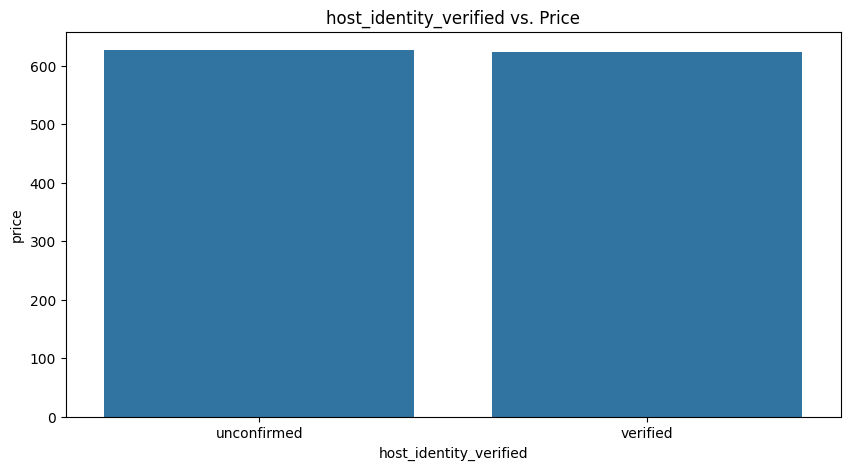

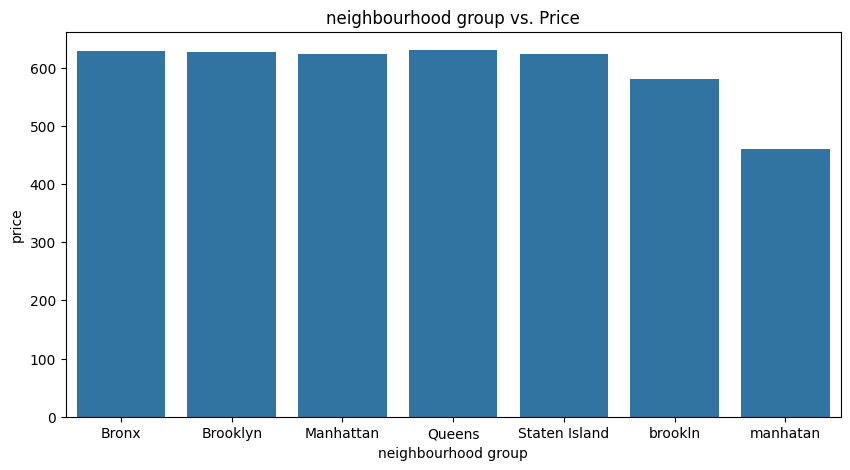

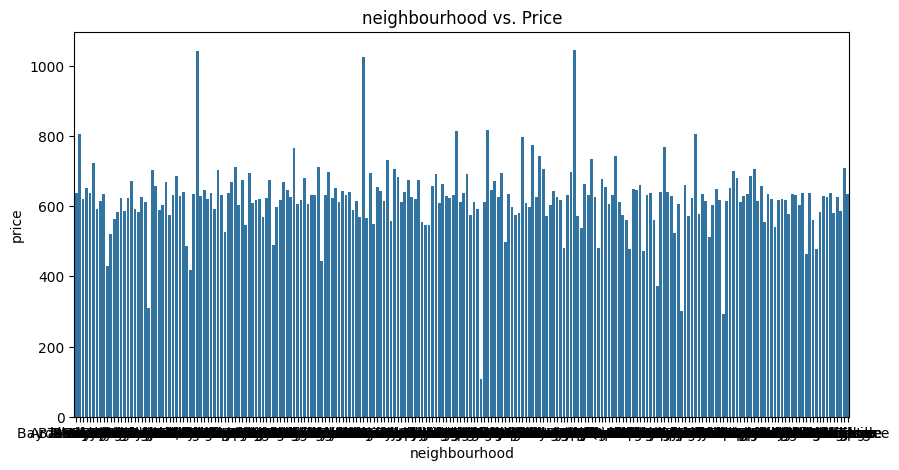

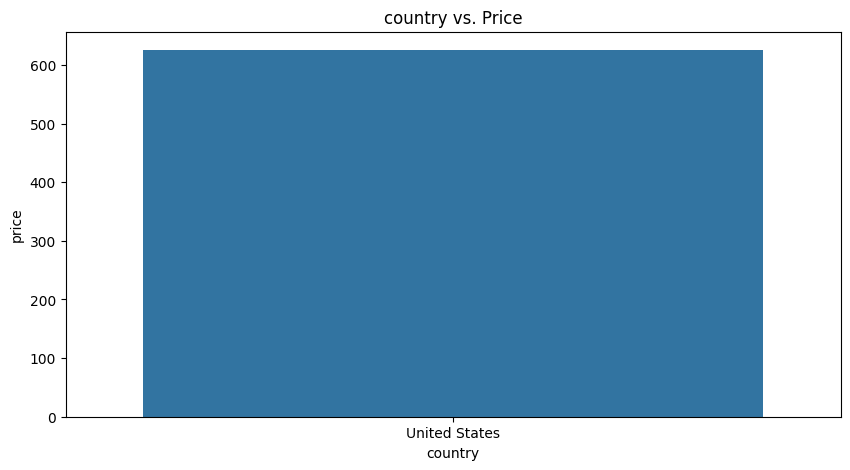

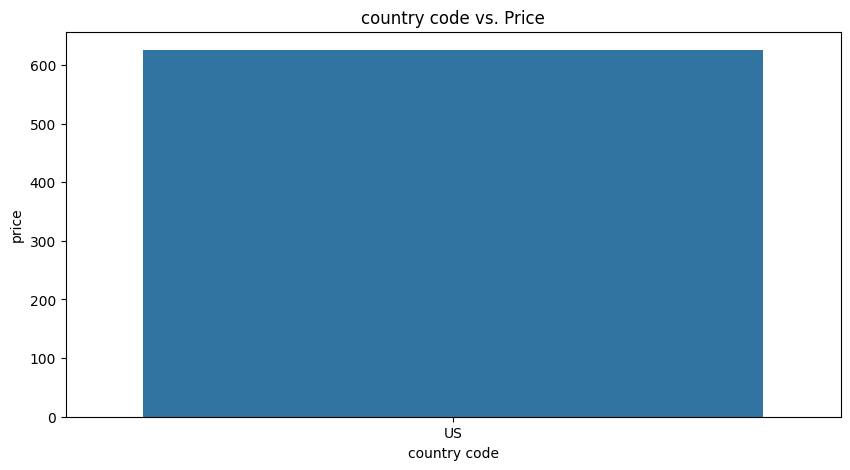

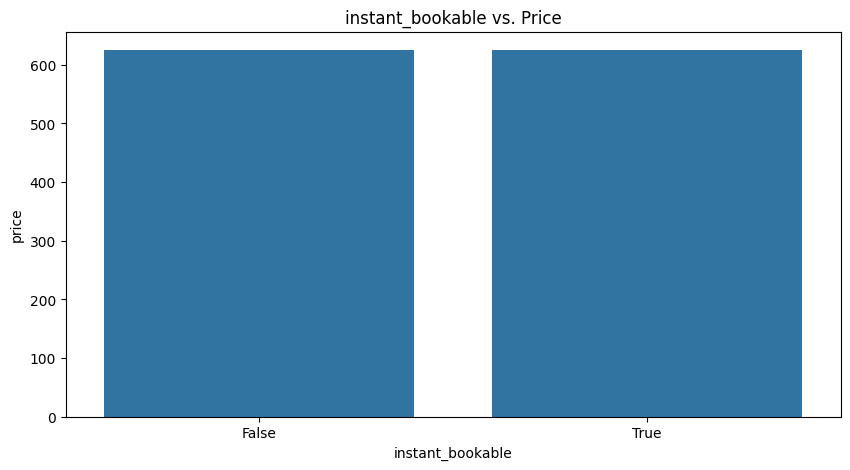

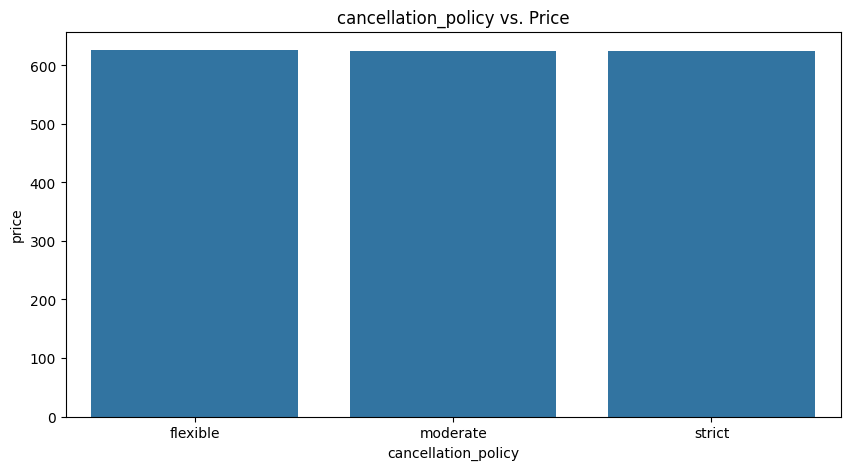

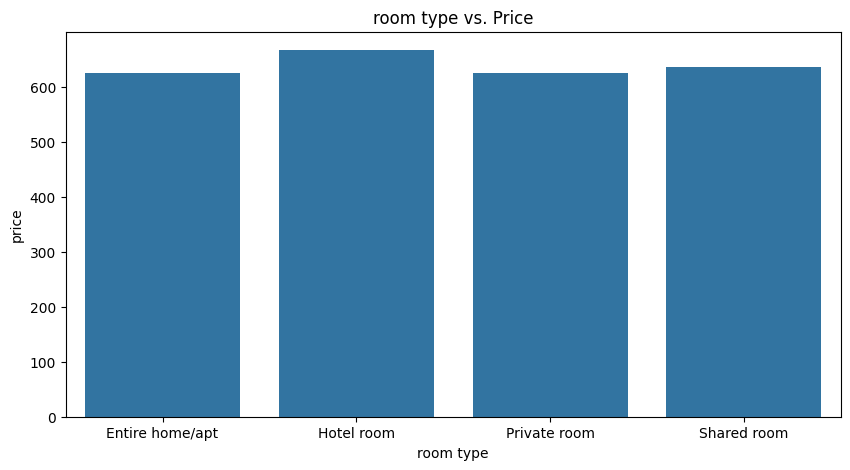

In [26]:
# Create categorical plots:
for col in categorical_columns:
    mean_price = df.groupby(col)['price'].mean().reset_index()
    plt.figure(figsize= (10,5))
    plt.title(f"{col} vs. Price")
    sns.barplot(data = mean_price, x = col, y = "price")

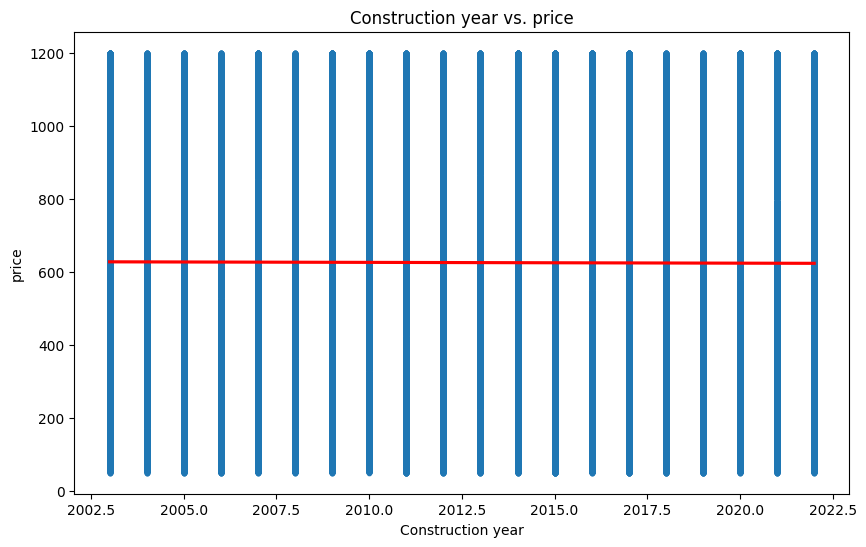

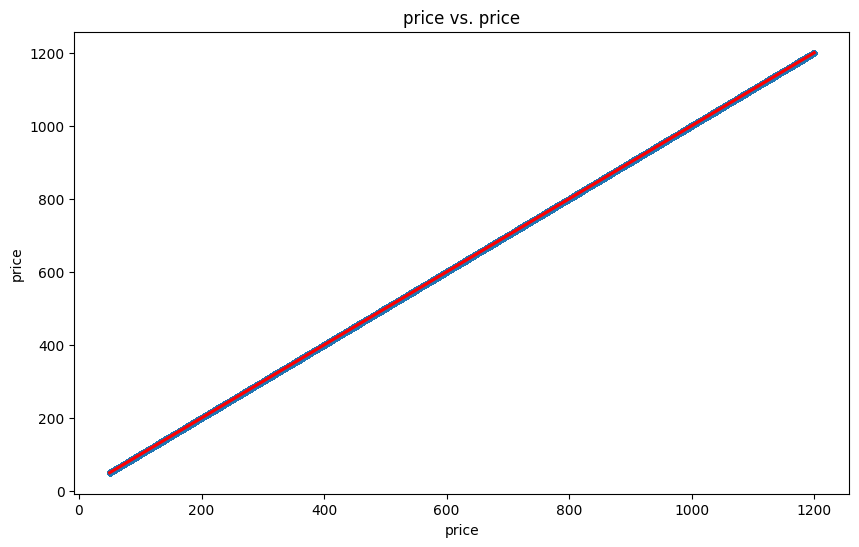

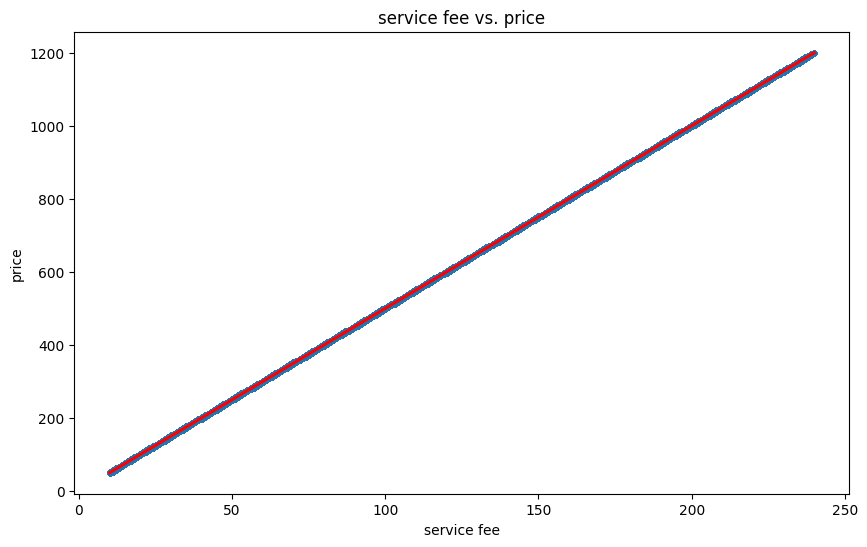

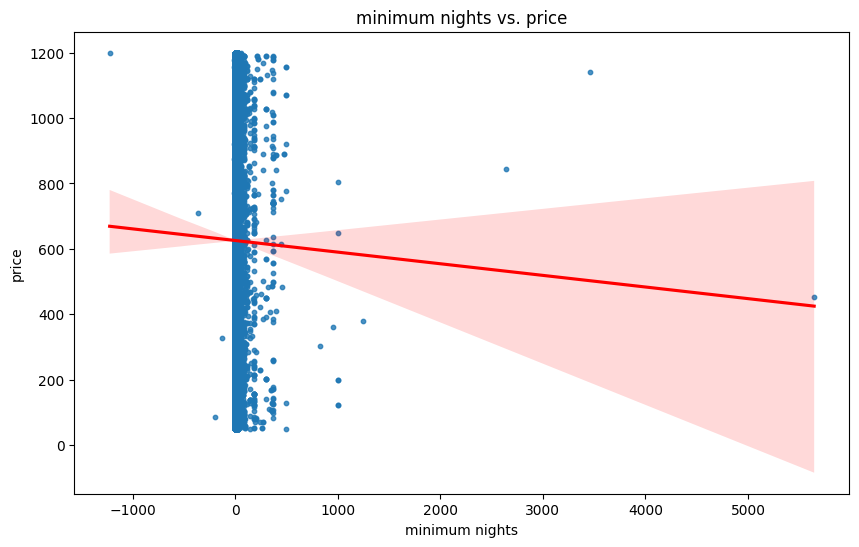

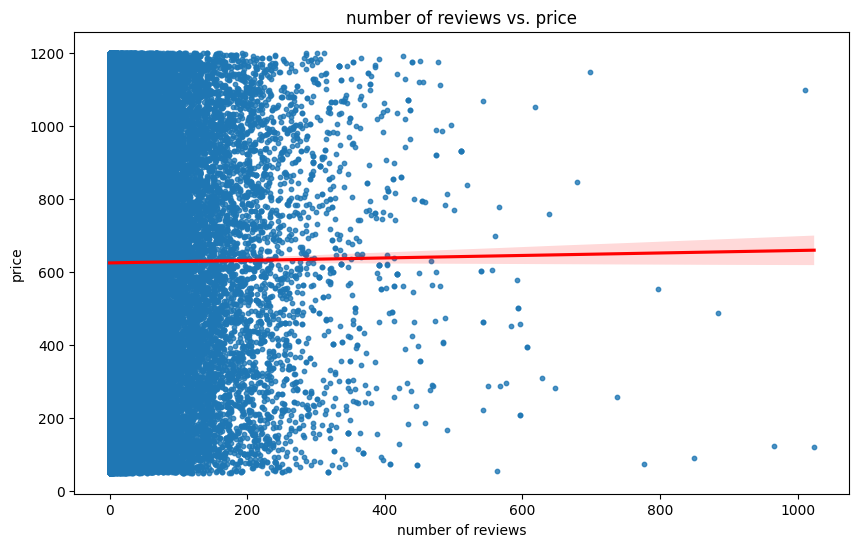

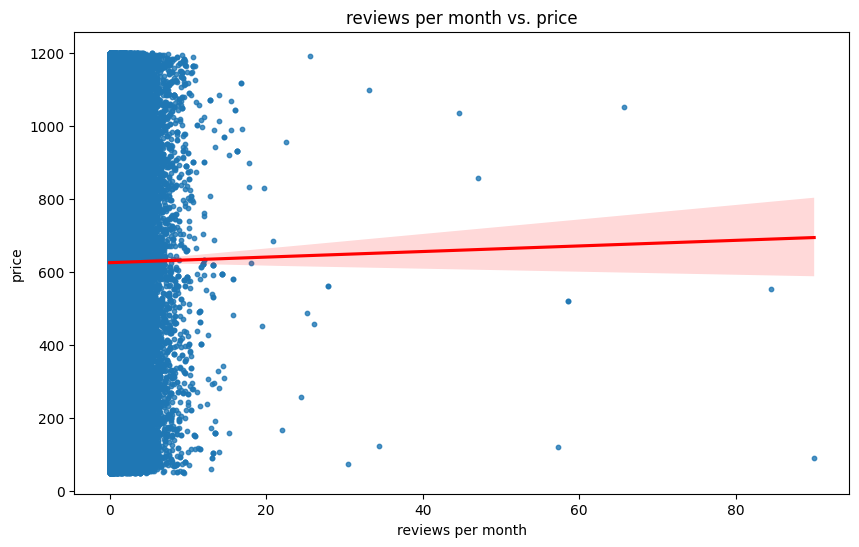

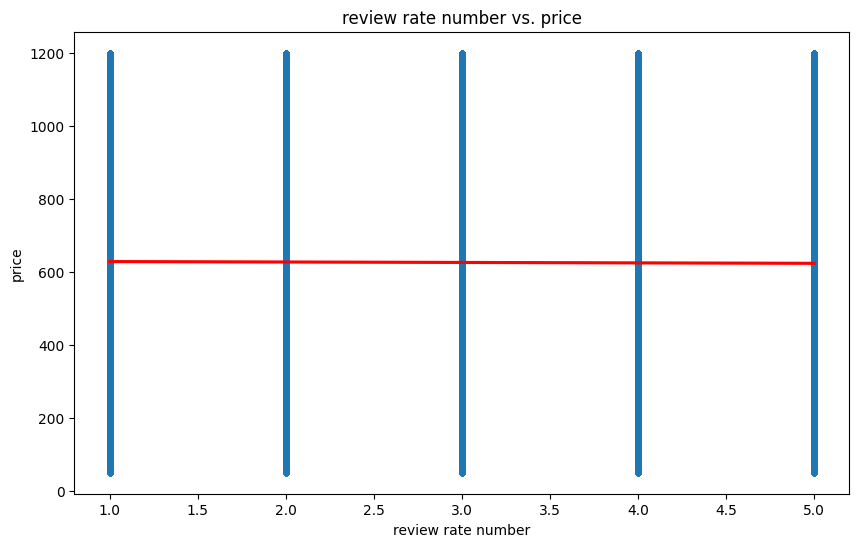

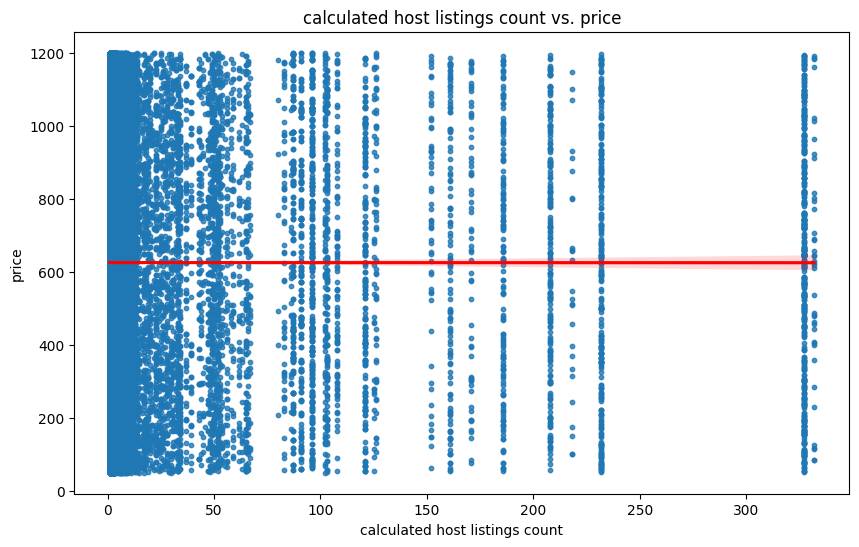

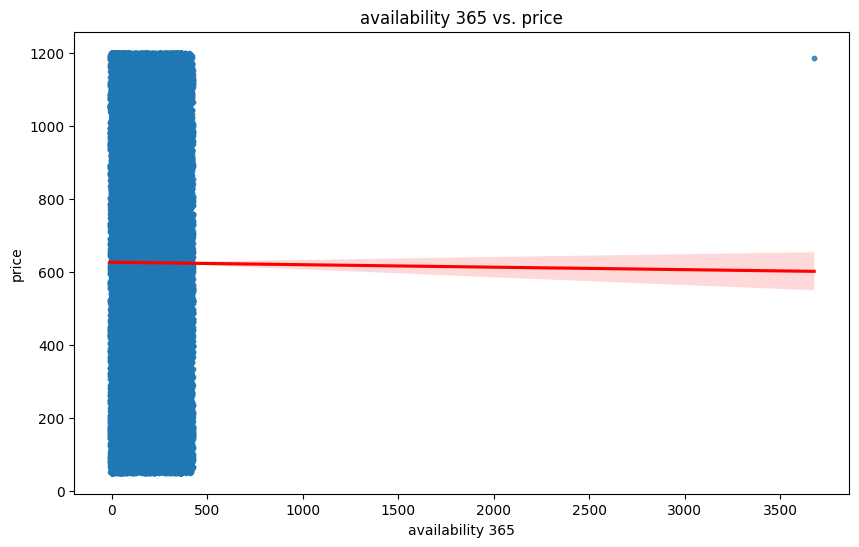

In [27]:
# Numerical Analysis - Scatterplot - vs. Price
for col in numerical_columns:
    plot_scatter(df,col,"price")

# Part 2: Data Cleaning and Treatment

We will focus on making the changes listed above, from previous section for data cleaning.

In [28]:
# Fix spelling error in Neighbourhood group - run code once:
df['neighbourhood group'] = df['neighbourhood group'].replace({
    'manhatan': 'Manhattan',
    'brookln': 'Brooklyn'
})

In [29]:
# Validated the spelling error fixed:
df['neighbourhood group'].value_counts()

neighbourhood group
Manhattan        43558
Brooklyn         41631
Queens           13197
Bronx             2694
Staten Island      949
Name: count, dtype: int64

In [30]:
# Investigate the range of values for minimum nights

# Investigate the range of values for minimum nights
min_nights_counts = df['minimum nights'].value_counts().reset_index()
min_nights_counts.columns = ['minimum nights', 'count']

min_nights_counts = min_nights_counts.sort_values(by='minimum nights', ascending=False)
display(min_nights_counts)

# We see a problem already - the dataset has negative days, which is impossible.
# For the extreme values, I will leave it, as there may be hosts that want long-term rentals minimum (i.e. 1-2 years.)

# Let's count how many rows this is.
# Count negative days
negative_days_count = df[df['minimum nights'] < 0].shape[0]
print(f"Number of listings with negative minimum nights: {negative_days_count}")

# Fortunately, only a total of 13 = 48 rows are affected. We can modify these values, as they represent a very small amount of data.

,minimum nights,count
113,5645.0,1
132,3455.0,1
114,2645.0,1
140,1250.0,1
93,1000.0,2
...,...,...
129,-12.0,1
102,-125.0,1
117,-200.0,1
116,-365.0,1


Number of listings with negative minimum nights: 13


In [31]:
# Replace all minimum_nights that are "negative" with 1 day (minimum stay assumed):
df['minimum nights'] = df['minimum nights'].apply(lambda x: 1 if x < 0 else x)

In [32]:
# Let's look for negative minimum nights again...
df["minimum nights"].reset_index().sort_values(by= "minimum nights", ascending= True)

# We have minimums of 1 day. We have missing data, which we will treat in Part 3: Missing Data. For now, we validated logic.

# Investigate availability_365 logic now - shape[0] means how many rows there are, and indice [1] is column...
negative_days_count = df[df['minimum nights'] < 0].shape[0]
display(negative_days_count)

0

In [33]:
# Validate logic for availability 365
df["availability 365"].value_counts()

# Same logic, we should check for negative values since we saw them 

availability 365
 0.0       23448
 365.0      2484
 364.0      1162
 89.0        746
 1.0         731
           ...  
 412.0        32
-6.0          31
 401.0        30
 391.0        30
 3677.0        1
Name: count, Length: 438, dtype: int64

In [34]:
# Replace negative values with 0 and values over 365 with 365
df['availability 365'] = df['availability 365'].apply(lambda x: 0 if x < 0 else (365 if x > 365 else x))

In [35]:
# Validate logic for availability 365 - we no longer have negative entries.
df["availability 365"].reset_index().sort_values(by = "availability 365", ascending = True)

,index,availability 365
88111,88111,0.0
32036,32036,0.0
32039,32039,0.0
32046,32046,0.0
93114,93114,0.0
...,...,...
87071,87071,NaN
87072,87072,NaN
87073,87073,NaN
87099,87099,NaN


In [36]:
# Let's also look at higher values too - we capped it at 365 days, which makes sense.
df["availability 365"].reset_index().sort_values(by = "availability 365", ascending = False)

,index,availability 365
51237,51237,365.0
68547,68547,365.0
67511,67511,365.0
67520,67520,365.0
9117,9117,365.0
...,...,...
87071,87071,NaN
87072,87072,NaN
87073,87073,NaN
87099,87099,NaN


In [37]:
# Let's drop License and country, country code. We already know this data is for USA and in New York City - run code once.

# Drop Country Code and country, since we don't need it. This will all be USA and in New York City.
df.drop(columns = ["country", "country code"], inplace = True, axis = 1)

# Drop license as well
df.drop(columns = ["license"], inplace = True, axis = 1)

In [38]:
# Standardize column naming with underscores - RUN ONCE:
# Standardize the name of the columns with underscores and lower_case
df.rename(columns= {"host id": "host_id",
                    "host name": "host_name",
                    "neighbourhood group": "neighbourhood_group",
                    "room type": "room_type",
                    "Construction year": "construction_year",
                    "service fee": "service_fee",
                    "minimum nights": "minimum_nights",
                    "number of reviews": "number_of_reviews",
                    "last review": "last_review",
                    "reviews per month": "reviews_per_month",
                    "review rate number": "review_rate_number",
                    "calculated host listings count": "calculated_host_listings_count",
                    "availability 365": "availability_365"
                    }, inplace = True)

In [39]:
# Complete Date-time variable change. last_review is the only one with dates:
df['last_review_NEW'] = pd.to_datetime(df['last_review'], errors='coerce')

In [40]:
# Let's check last_review_NEW logic, in case there's any data entry errors.
# This dataset was released in 2022, so anything beyond 12-31-2022 is considered an error.

# Define the specific date
specific_date = pd.to_datetime('2022-12-31')

# Count error future dates:
count = df[df['last_review_NEW'] > specific_date]

In [41]:
# Check any rows with future dates for last_review - we only have 5 rows, so let's drop them.
count

,id,NAME,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,last_review_NEW
127,1071478,Garden studio in the Upper East Sid,77172555024,unconfirmed,Miller,Manhattan,Upper East Side,40.77800,-73.94822,False,...,114.0,5.0,21.0,8/15/2024,0.19,4.0,NaN,365.0,"Dear Guests, Welcome to 62 Cornwall St! I hope...",2024-08-15
191,1106825,LUX APT IN TIMES SQUARE NEW BUILDING,93725364475,unconfirmed,Aiden,Manhattan,Hell's Kitchen,40.76307,-73.99665,False,...,108.0,NaN,41.0,6/26/2025,0.38,2.0,1.0,NaN,"You will be sharing a bathroom, so you must be...",2025-06-26
255,1142173,Beautiful Landmarked Duplex,87944779917,NaN,Baker,Brooklyn,Greenpoint,40.72945,-73.95511,True,...,168.0,3.0,124.0,6/16/2058,1.22,4.0,3.0,230.0,No rules per say. I just ask that you respect ...,2058-06-16
318,1176967,NaN,70084472212,verified,Barnes,Brooklyn,Greenpoint,40.72488,-73.95018,True,...,184.0,2.0,1.0,3/28/2026,0.01,3.0,1.0,73.0,Check-In is 3pm. Check-Out is 12 Noon. In or...,2026-03-28
483,1268097,Modern Space in Charming Pre-war,13746585241,verified,Adelaide,Manhattan,Harlem,40.82411,-73.94934,False,...,144.0,2.0,41.0,6/16/2040,0.43,3.0,2.0,47.0,NaN,2040-06-16


In [42]:
# Drop rows with error future dates. It's 5 rows so it's not much.
df = df[df["last_review_NEW"] <= specific_date]

In [43]:
# We can see it's been successfully dropped!
df["last_review_NEW"].reset_index().sort_values(by = "last_review_NEW", ascending= False)

,index,last_review_NEW
1,1,2022-05-21
1021,1099,2022-05-05
58458,69275,2022-05-05
721,784,2022-05-04
58490,69309,2022-04-04
...,...,...
1366,1464,2012-08-25
58691,69519,2012-08-10
1254,1343,2012-08-10
58642,69470,2012-07-11


In [44]:
# Also extract month and year from this information, as we might need it later.
# Extract year, month, and day from 'last review'
df['last_review_year'] = df['last_review_NEW'].dt.year
df['last_review_month'] = df['last_review_NEW'].dt.month

# Convert the extracted columns to integer to remove the decimal points
df['last_review_year'] = df['last_review_year'].astype('Int64')
df['last_review_month'] = df['last_review_month'].astype('Int64')

In [45]:
# We confirm the change has been made - the new date-time variables are added, the naming has been made, and appropriate columns are dropped.
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86221 entries, 0 to 102057
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              86221 non-null  int64         
 1   NAME                            86008 non-null  object        
 2   host_id                         86221 non-null  int64         
 3   host_identity_verified          85975 non-null  object        
 4   host_name                       85896 non-null  object        
 5   neighbourhood_group             86196 non-null  object        
 6   neighbourhood                   86205 non-null  object        
 7   lat                             86214 non-null  float64       
 8   long                            86214 non-null  float64       
 9   instant_bookable                86128 non-null  object        
 10  cancellation_policy             86154 non-null  object        
 11  room_t

In [46]:
# Since naming has been fixed, let's remake the list of categorical and numerical columns:

# Identify all the numerical columns:
numerical_columns = df.select_dtypes(include = [np.number]).columns.tolist()

# Refine list to remove id and lat/long:
numerical_columns = ['construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'review_rate_number',
 'calculated_host_listings_count',
 'availability_365',
 'last_review_year',
 'last_review_month']

In [47]:
# Check for categorical columns:
df.select_dtypes(exclude = [np.number]).columns.to_list

# Cleaning list to remove house_rules, host_name, NAME, as they're not relevant here
categorical_columns = [ 'host_identity_verified', 'neighbourhood_group',
       'neighbourhood', 'instant_bookable', 'cancellation_policy', 'room_type',
       'last_review',  'last_review_NEW']

In [48]:
# We will return back to bivariate and univariate analysis later. We need to apply treatment for the missing rows.

# Part 3a: Missing Data

In [49]:
# We currently have missing data which we need to handle.

# Check missing data as a portion of total rows
tl_rows = int(df["id"].count())

# Check per row
check = (df.isna().sum() / tl_rows) * 100
check

# We saw that 15% of missing data for last_review and reviews_per_month. 
# Due to restricting dates preiously to before Dec 31 2022 under last_review_NEW, a lot proportion of those rows were already dropped, since null rows were also dropped for "last_review_NEW"
# The source of this is likely MNAR - that is, no one had booked or the property was not available
# As a result, "last_review" and "reviews_per_month" had a missing information due to systematic reasons, i.e. no one was booking or property not available.
# Overall, the biggest source of missing data is house_rules, along with last_reivew and reviews_per_month.

id                                 0.000000
NAME                               0.247040
host_id                            0.000000
host_identity_verified             0.285313
host_name                          0.376938
neighbourhood_group                0.028995
neighbourhood                      0.018557
lat                                0.008119
long                               0.008119
instant_bookable                   0.107862
cancellation_policy                0.077707
room_type                          0.000000
construction_year                  0.212245
price                              0.256318
service_fee                        0.279514
minimum_nights                     0.392016
number_of_reviews                  0.068429
last_review                        0.000000
reviews_per_month                  0.015078
review_rate_number                 0.325907
calculated_host_listings_count     0.301551
availability_365                   0.207606
house_rules                     

In [50]:
# Check missing rows per column:
check = df.isna().sum()
check

id                                    0
NAME                                213
host_id                               0
host_identity_verified              246
host_name                           325
neighbourhood_group                  25
neighbourhood                        16
lat                                   7
long                                  7
instant_bookable                     93
cancellation_policy                  67
room_type                             0
construction_year                   183
price                               221
service_fee                         241
minimum_nights                      338
number_of_reviews                    59
last_review                           0
reviews_per_month                    13
review_rate_number                  281
calculated_host_listings_count      260
availability_365                    179
house_rules                       45411
last_review_NEW                       0
last_review_year                      0


In [51]:
# Let's make a new df as we're beginning to drop rows.
new_df = df.copy()

In [52]:
# Now, we will check how many missing rows of N/A there is, despite dropping house_rules
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86221 entries, 0 to 102057
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              86221 non-null  int64         
 1   NAME                            86008 non-null  object        
 2   host_id                         86221 non-null  int64         
 3   host_identity_verified          85975 non-null  object        
 4   host_name                       85896 non-null  object        
 5   neighbourhood_group             86196 non-null  object        
 6   neighbourhood                   86205 non-null  object        
 7   lat                             86214 non-null  float64       
 8   long                            86214 non-null  float64       
 9   instant_bookable                86128 non-null  object        
 10  cancellation_policy             86154 non-null  object        
 11  room_t

In [53]:
# Check missing rows per column:
check  = new_df.isna().sum()
check

id                                    0
NAME                                213
host_id                               0
host_identity_verified              246
host_name                           325
neighbourhood_group                  25
neighbourhood                        16
lat                                   7
long                                  7
instant_bookable                     93
cancellation_policy                  67
room_type                             0
construction_year                   183
price                               221
service_fee                         241
minimum_nights                      338
number_of_reviews                    59
last_review                           0
reviews_per_month                    13
review_rate_number                  281
calculated_host_listings_count      260
availability_365                    179
house_rules                       45411
last_review_NEW                       0
last_review_year                      0


### Missing Data Treatment

* We have 3 primary sources of missing data - last_review, reviews_per_month, and also the "house_rules"
* MNAR - missing data from last_review and reviews_per_month were derived from the property likely not being booked
* MNAR + MAR - house_rules were either systematically left or the host didn't want to put any house rules. 
* We also have a tiny amount of missing rows from other columns, which are significantly small versus the entire dataset, such as coming from price, construction year, service_fee, minimum_nights, number of reviews, review_rate_number, calculated_host_listings_count, NAME , host_identity_verified , availaiblity_365,host_name, neighbourhood_group and neighbourhood. As such, they will be dropped.

### Our next approach:
* We want to gather insights from house_rules, even though there's a lot of missing rows.
* We will not impute, since we don't have enough information for all 3 major sources of missing data. As it accounts for 15% of data but we will still have >85K rows, we will keep it.
* We will keep house_rules, since we can do feature_engineering and it will be useful, i.e. amenities.


### Build a dataframe:
* We will drop all the missing rows of information from "last_review, reviews_per_month", but keep the missing rows from house_rules

In [54]:
# Create DataFrames
df_1 = new_df.copy()

In [55]:
# Drop only the rows I identified above
columns_with_na =['last_review', 'reviews_per_month', 'NAME', 'host_identity_verified', 'host_name', 'neighbourhood_group','neighbourhood', 'lat', 'long','instant_bookable', 
                           'cancellation_policy', 'construction_year', 'price', 'service_fee', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'review_rate_number', 
                           'calculated_host_listings_count', 'availability_365']
                           

In [56]:
# From all the drops of N/A rows, ignoring house_rules, we dropped 2361 rows, which is less than 3% of all 86K rows.
rows_with_na = df_1[columns_with_na].isna().any(axis=1)
rows_Dropped = rows_with_na.sum()

# Check percentage
perc = rows_Dropped / 86000
perc

0.0276046511627907

In [57]:
# Drop the rows - run once:
df_1.dropna(subset=columns_with_na, inplace=True)

In [58]:
# DataFrame 1 validation - we now have no null or missing rows, and house_rules is the only one with missing null values. We will fill with "unknown" later.
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83847 entries, 0 to 102040
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              83847 non-null  int64         
 1   NAME                            83847 non-null  object        
 2   host_id                         83847 non-null  int64         
 3   host_identity_verified          83847 non-null  object        
 4   host_name                       83847 non-null  object        
 5   neighbourhood_group             83847 non-null  object        
 6   neighbourhood                   83847 non-null  object        
 7   lat                             83847 non-null  float64       
 8   long                            83847 non-null  float64       
 9   instant_bookable                83847 non-null  object        
 10  cancellation_policy             83847 non-null  object        
 11  room_t

* We now have an equal amount of rows, except for "house_rules", which we will apply treatment later. We still have a significant amount of rows for analysis after dropping.
* Before we begin feature engineering and data modelling, let's revisit the datasets and features.

# Part 3b: Bivariate Analysis

* Now that we've cleaned our data, let's quickly look at the bivariate analysis again with price...

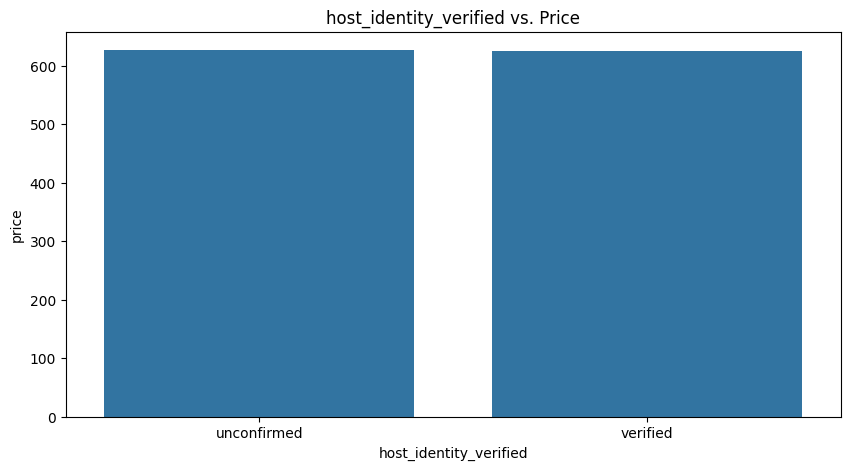

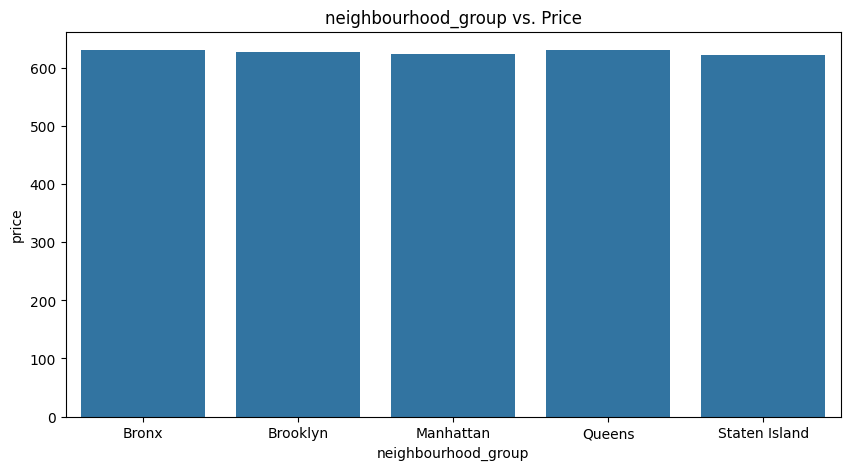

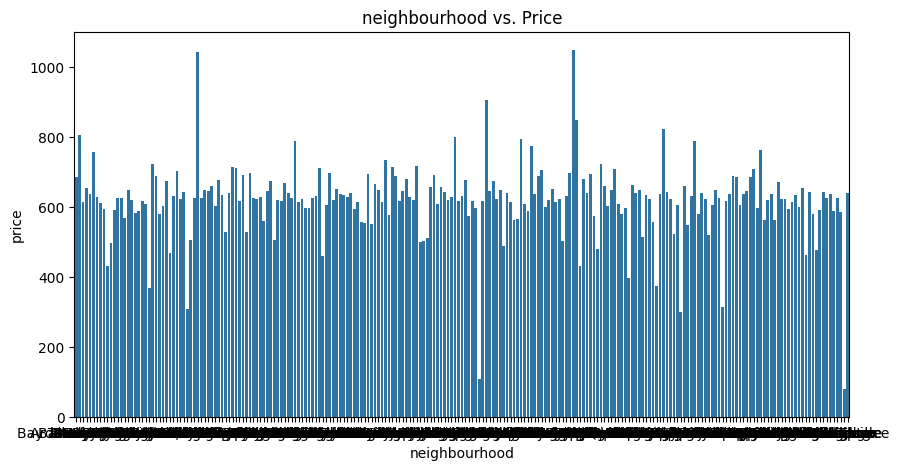

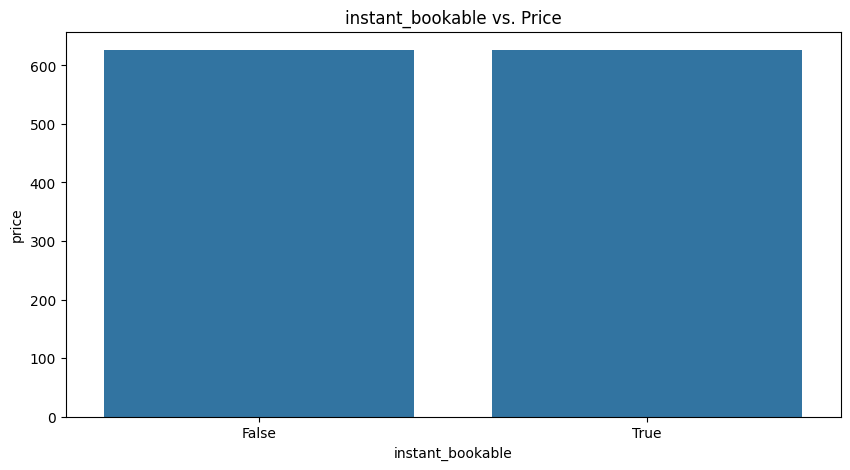

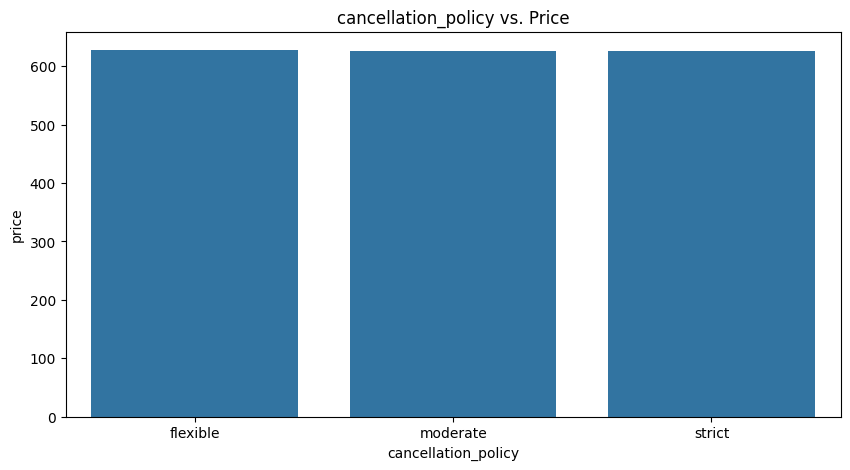

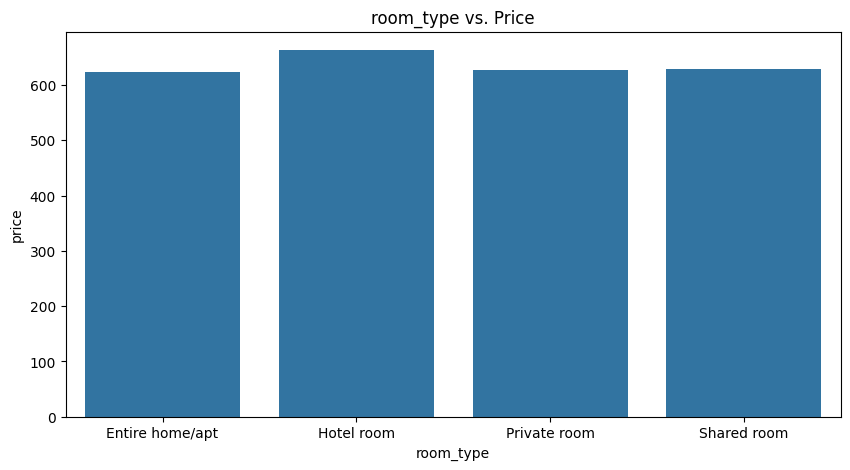

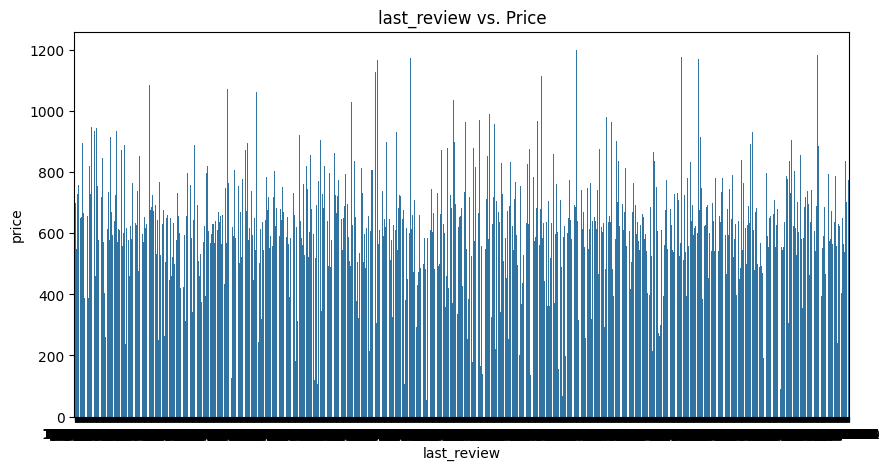

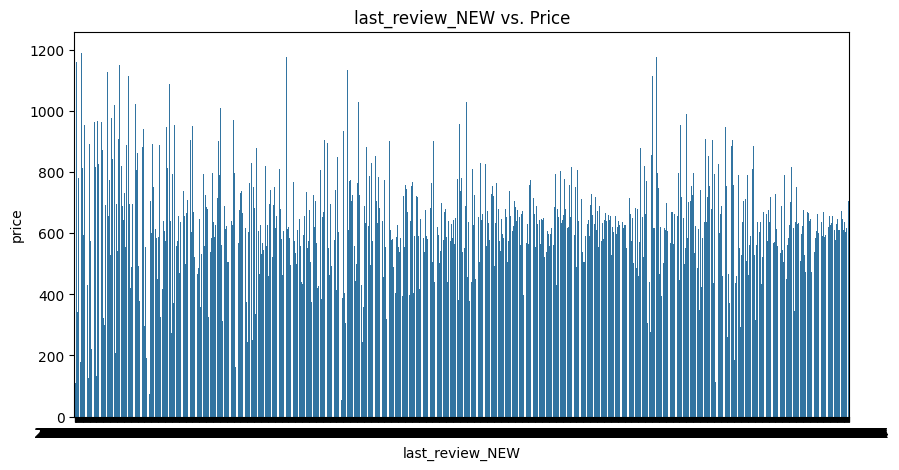

In [59]:
# Categorical Analysis with Price...
for col in categorical_columns:
    mean_price = df_1.groupby(col)['price'].mean().reset_index()
    plt.figure(figsize= (10,5))
    plt.title(f"{col} vs. Price")
    sns.barplot(data = mean_price, x = col, y = "price")

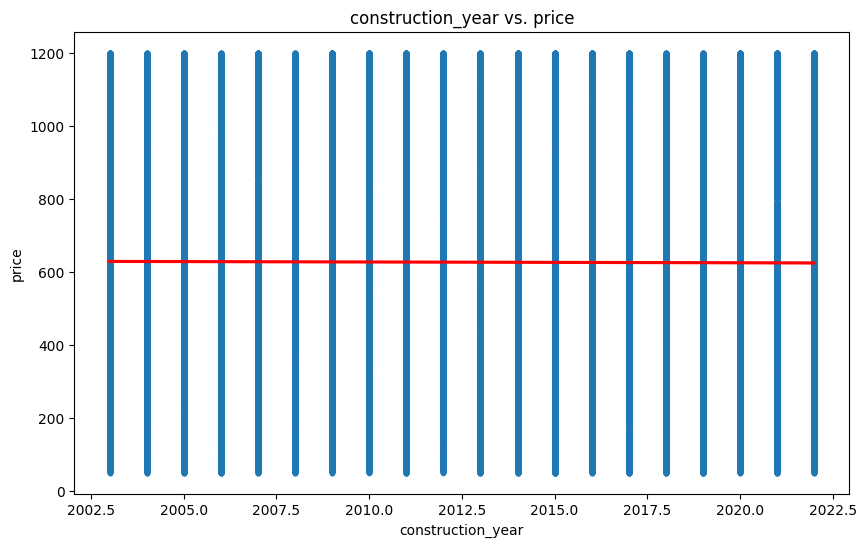

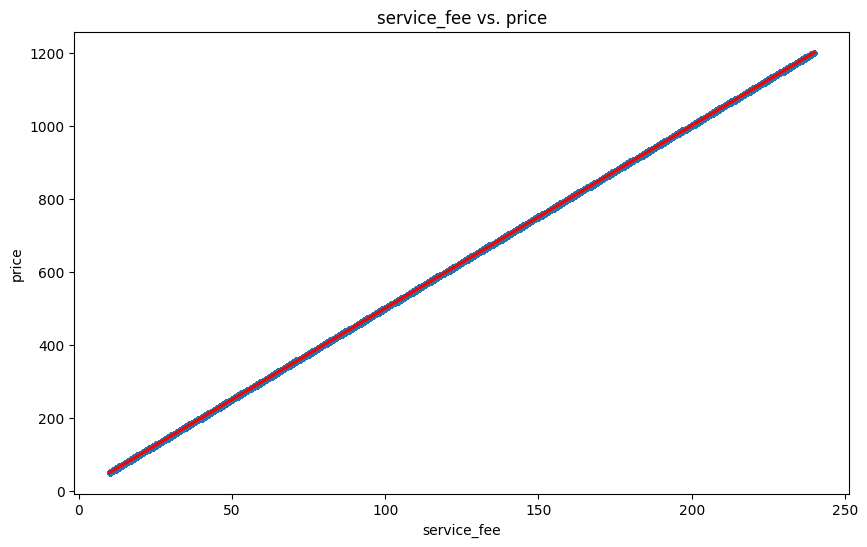

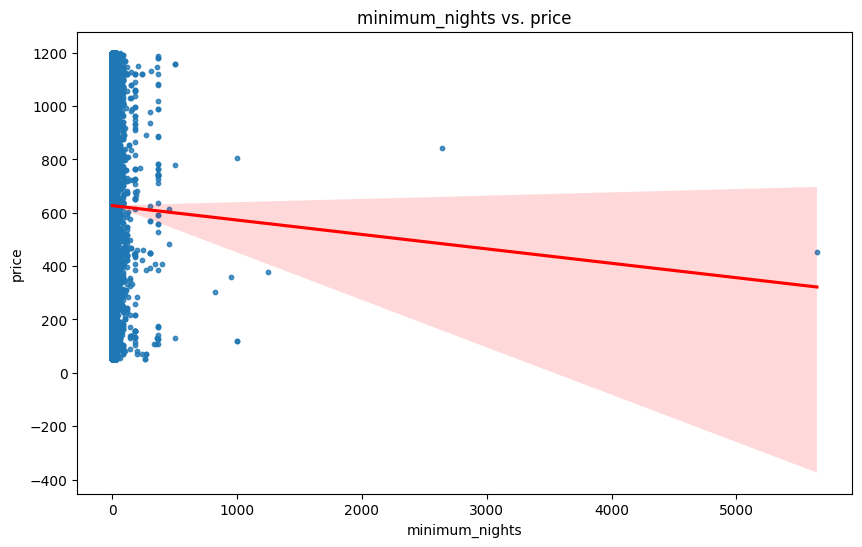

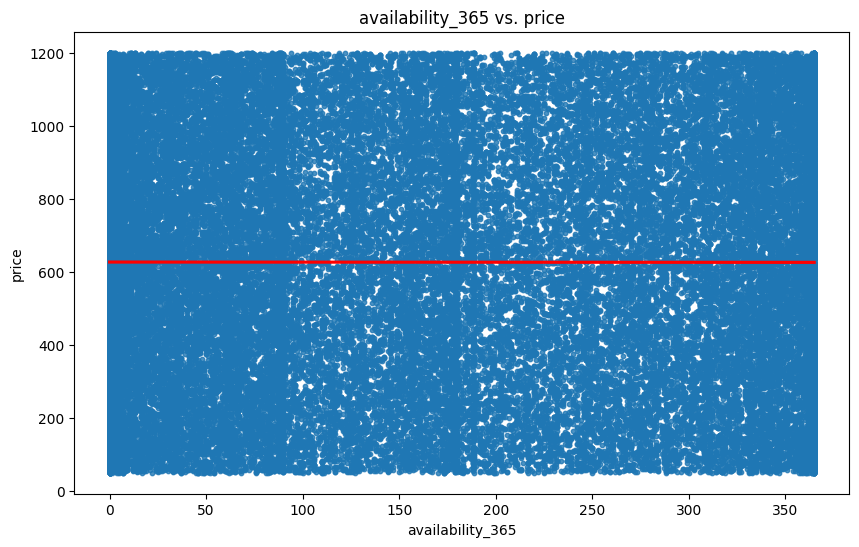

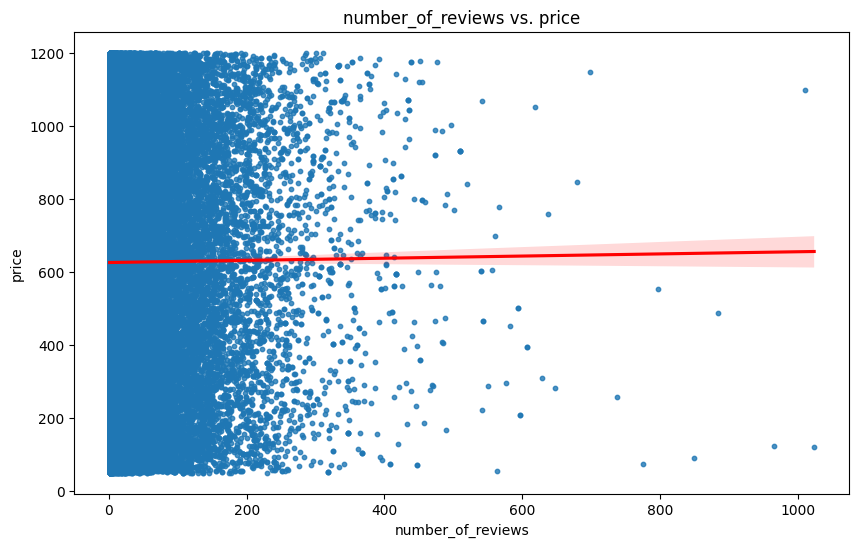

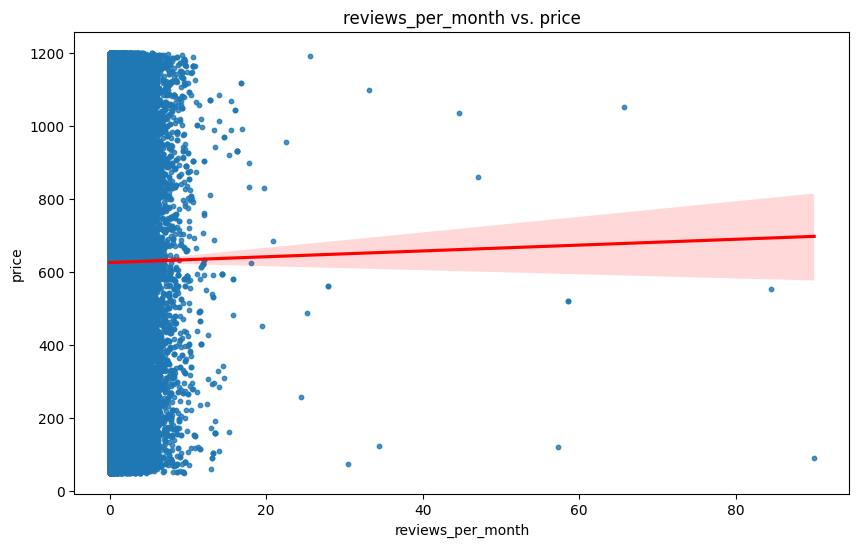

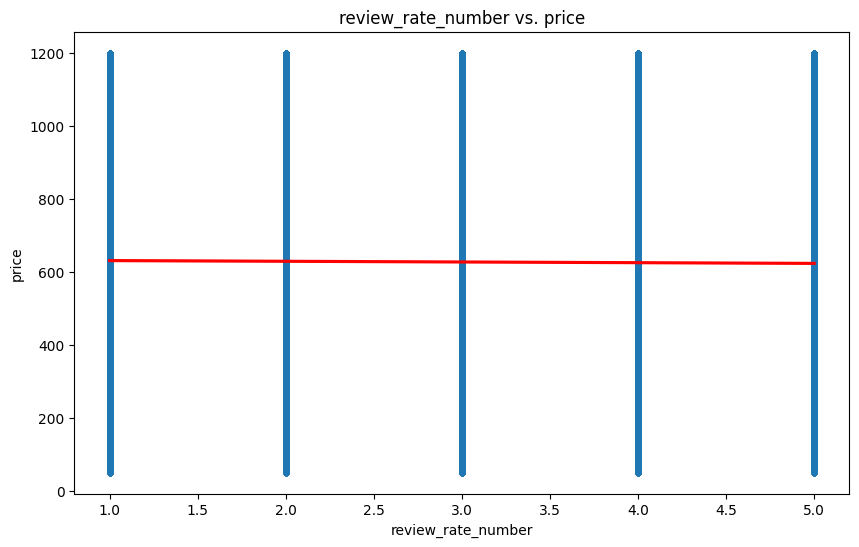

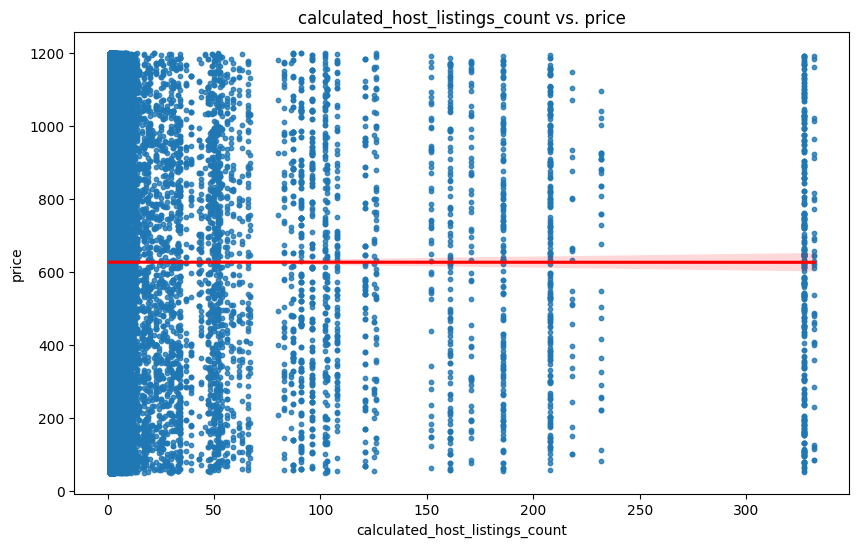

In [60]:
# Scatter plots
number_cols = ["construction_year", "service_fee", "minimum_nights", "availability_365","number_of_reviews", "reviews_per_month", "review_rate_number", "calculated_host_listings_count"]

for col in number_cols:
    plot_scatter(df_1,col,"price")

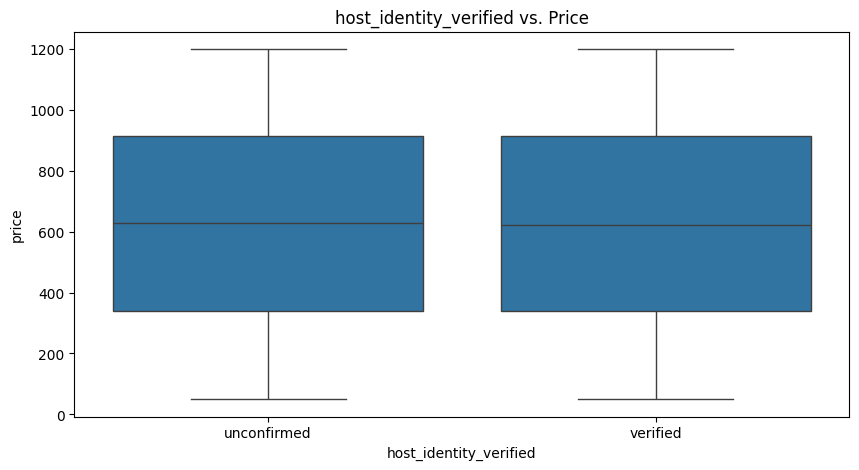

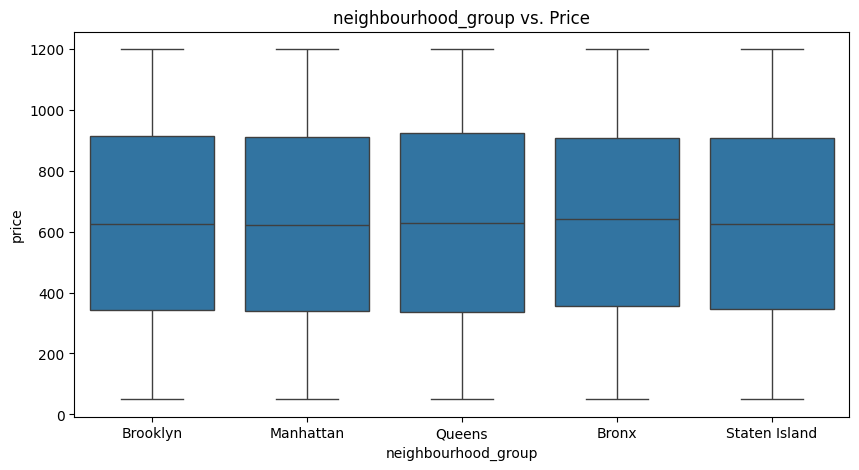

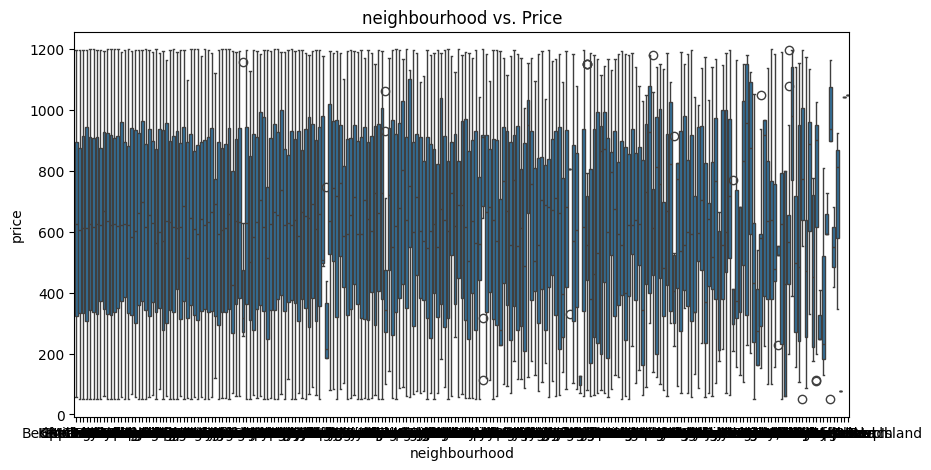

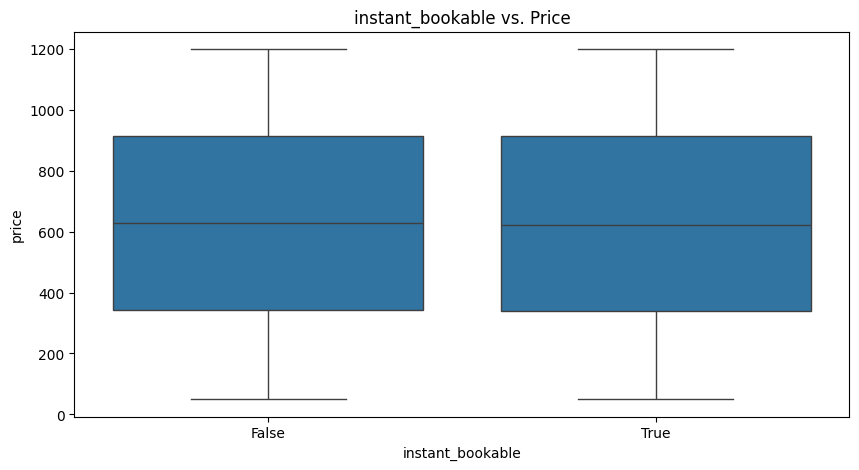

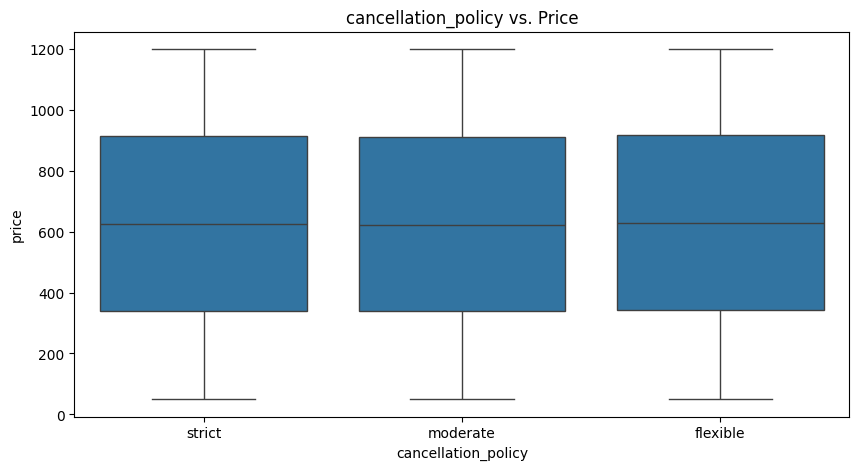

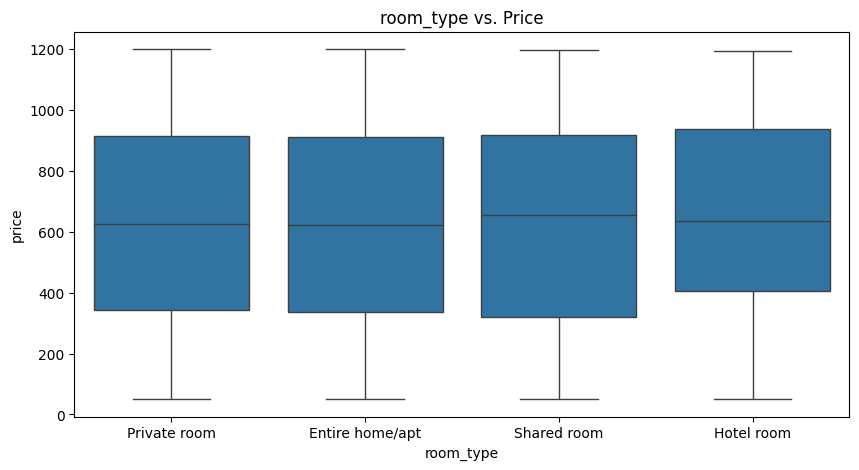

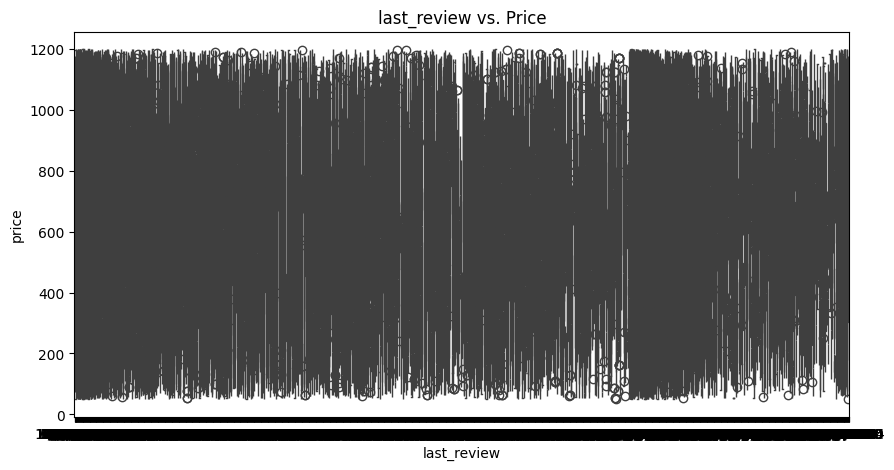

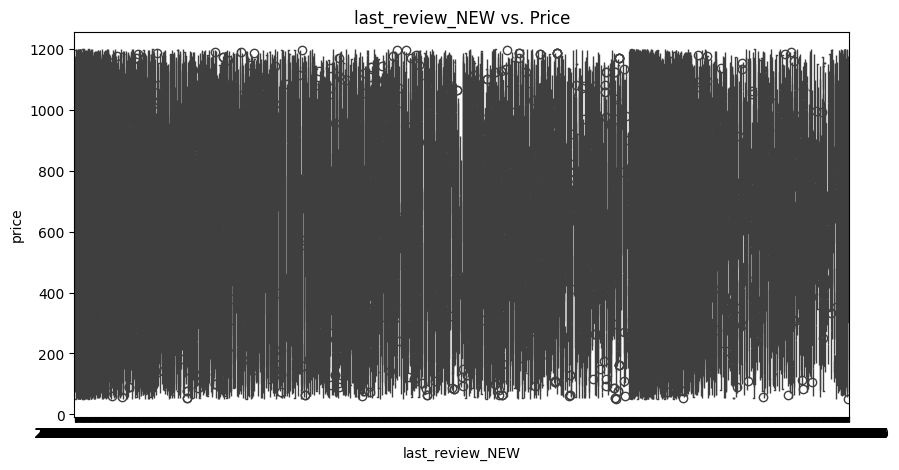

In [63]:
# Create boxplots (categorical vs. price) - the findings are the same as barplots regarding the means and there's not much variety.
# Categorical Analysis with Price...

for col in categorical_columns:
    plt.figure(figsize= (10,5))
    plt.title(f"{col} vs. Price")
    sns.boxplot(data = df_1, x = col, y = "price")


Text(0.5, 1.0, 'Construction Year vs. Price')

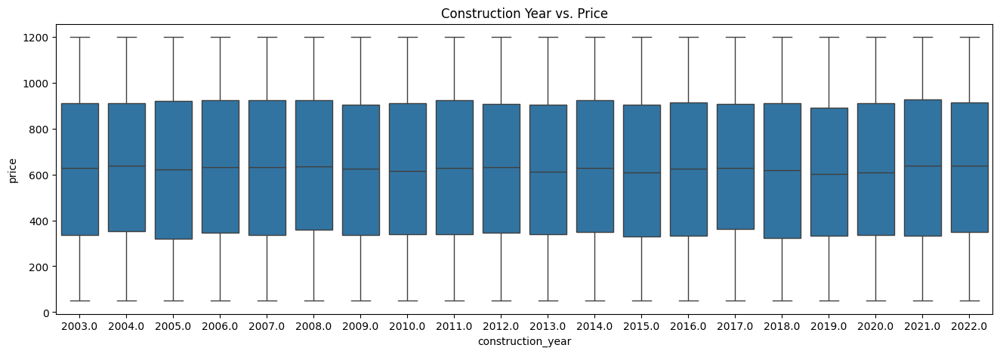

In [68]:
# Boxplots, of numerical vs. price.
# Only one meaningful is construction year:
plt.figure(figsize= (16,5))
sns.boxplot(data = df_1, x = "construction_year", y = "price")
plt.title("Construction Year vs. Price")

### Findings:

* The boxplots revealed similar insights mentioned in the report and findings found in the barplot, which is essentially that the medians do have visual varieties on the boxplot. Construction may be considered (but later on we find some colinearity going on).
* Of all the variables, the "room_type" shows that hotels do tend to have a higher price, but only a very small portion of properties are considered hotels.

# Part 4: Feature-Engineering + Google Maps API (Proximity Score)

In [69]:
# Since we don't know the house_rules, let's fill with "Unknown" - this will be necessary for amenities creatio later. Run this once.
df_1['house_rules'] = df_1['house_rules'].fillna('Unknown')

In [70]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83847 entries, 0 to 102040
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              83847 non-null  int64         
 1   NAME                            83847 non-null  object        
 2   host_id                         83847 non-null  int64         
 3   host_identity_verified          83847 non-null  object        
 4   host_name                       83847 non-null  object        
 5   neighbourhood_group             83847 non-null  object        
 6   neighbourhood                   83847 non-null  object        
 7   lat                             83847 non-null  float64       
 8   long                            83847 non-null  float64       
 9   instant_bookable                83847 non-null  object        
 10  cancellation_policy             83847 non-null  object        
 11  room_t

In [71]:
# Let's quicky encode some categorical variables via one-hot encoding, so we can do a Correlation Matrix.
# We will assume the data is frozen in 2021, since we see the last review date was 9/9/2021, so I will set that as present date.

# Define the specific date
specific_date = pd.to_datetime('2022-12-31')

# # Calculate the days since last review from the specific date
df_1['days_since_last_review_from_date'] = (specific_date - df_1['last_review_NEW']).dt.days


In [72]:
# Validated it makes sense - it does, since we fixed some data entry errors before.
df_1[["last_review_NEW", "days_since_last_review_from_date"]].reset_index().sort_values(by = "days_since_last_review_from_date", ascending = False)

,index,last_review_NEW,days_since_last_review_from_date
765,1294,2012-07-11,3825
56783,69470,2012-07-11,3825
56832,69519,2012-08-10,3795
806,1343,2012-08-10,3795
904,1464,2012-08-25,3780
...,...,...,...
56631,69309,2022-04-04,271
337,784,2022-05-04,241
589,1099,2022-05-05,240
56599,69275,2022-05-05,240


In [73]:
# Will encode these:
cat_cols_list = ['host_identity_verified',
 'neighbourhood_group',
 'instant_bookable',
 'cancellation_policy',
 'room_type']

In [74]:
# Create second df for analysis
encoded_df = df_1.copy()

In [75]:
# Apply the encoding
encoded_df = pd.get_dummies(encoded_df, columns=cat_cols_list, drop_first=True)

In [76]:
# It was successfully added:
encoded_df

,id,NAME,host_id,host_name,neighbourhood,lat,long,construction_year,price,service_fee,...,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,instant_bookable_True,cancellation_policy_moderate,cancellation_policy_strict,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,1001254,Clean & quiet apt home by the park,80014485718,Madaline,Kensington,40.64749,-73.97237,2020.0,966.0,193.0,...,True,False,False,False,False,False,True,False,True,False
1,1002102,Skylit Midtown Castle,52335172823,Jenna,Midtown,40.75362,-73.98377,2007.0,142.0,28.0,...,False,True,False,False,False,True,False,False,False,False
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,Lyndon,East Harlem,40.79851,-73.94399,2009.0,204.0,41.0,...,False,True,False,False,False,True,False,False,False,False
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,Michelle,Murray Hill,40.74767,-73.97500,2013.0,577.0,115.0,...,False,True,False,False,True,False,False,False,False,False
7,1005202,BlissArtsSpace!,90821839709,Emma,Bedford-Stuyvesant,40.68688,-73.95596,2009.0,1060.0,212.0,...,True,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102029,57351953,Cozy room in a 2B with backyard access,5155155913,Cristina,Astoria,40.76987,-73.92679,2018.0,822.0,164.0,...,False,False,True,False,False,False,False,False,True,False
102030,57352505,An East Williamsburg Delight,71564706996,Petra,Bedford-Stuyvesant,40.68335,-73.91222,2015.0,455.0,91.0,...,True,False,False,False,True,True,False,False,True,False
102031,57353057,Cozy bedroom in williamsburg,83101851929,Russell,Williamsburg,40.70870,-73.96710,2020.0,1078.0,216.0,...,True,False,False,False,True,False,False,False,True,False
102032,57353610,Spacious Room w/ 2 Bed,69037598918,Christine,Bayside,40.75047,-73.75349,2007.0,103.0,21.0,...,False,False,True,False,False,True,False,False,True,False


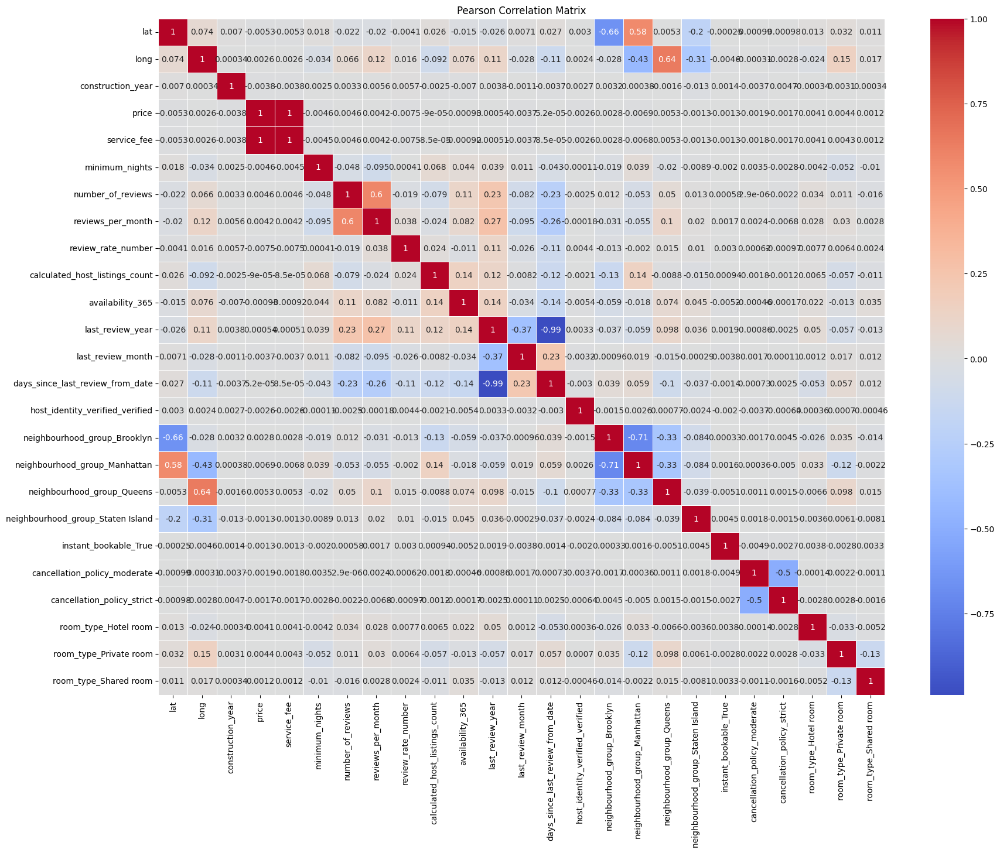

In [77]:
# Calculate the Pearson correlation matrix

# Columns to check - removed house rules, last_review original and last_review NEW
cols_check = ['lat', 'long',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 
       'last_review_year', 'last_review_month',
       'days_since_last_review_from_date', 'host_identity_verified_verified',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'instant_bookable_True', 'cancellation_policy_moderate',
       'cancellation_policy_strict', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room']

correlation_matrix = encoded_df[cols_check].corr()

# Plot the heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Pearson Correlation Matrix')
plt.show()

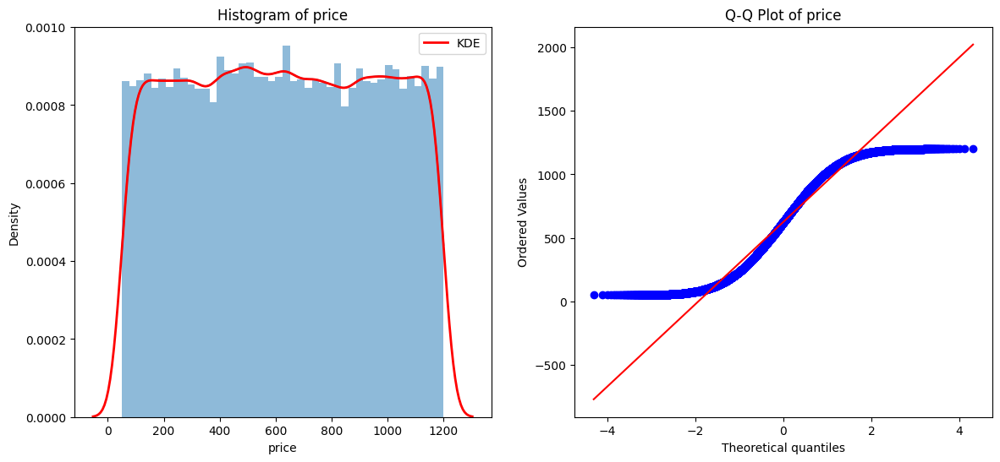

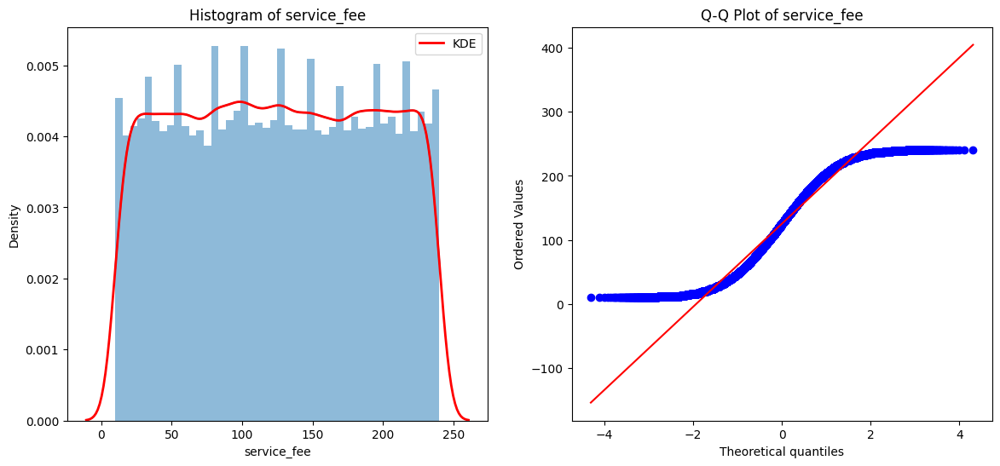

In [78]:
# We should also check normality distribution for price and service_fee, and maybe reviews_rate_number
# Normality Checks
# from scipy.stats import norm, probplot

def check_normality(df, col_name):
    plt.figure(figsize=(14, 6))
    
    # Histogram with KDE
    plt.subplot(1, 2, 1)
    sns.histplot(df[col_name].dropna(), kde=True, stat="density", linewidth=0)
    sns.kdeplot(df[col_name].dropna(), color="r", lw=2, label='KDE')
    plt.title(f'Histogram of {col_name}')
    plt.legend()
    
    # Q-Q Plot
    plt.subplot(1, 2, 2)
    probplot(df[col_name].dropna(), dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {col_name}')
    
    plt.show()

# Normality checks for price and service_fee
check_normality(df_1, 'price')
check_normality(df_1, 'service_fee')

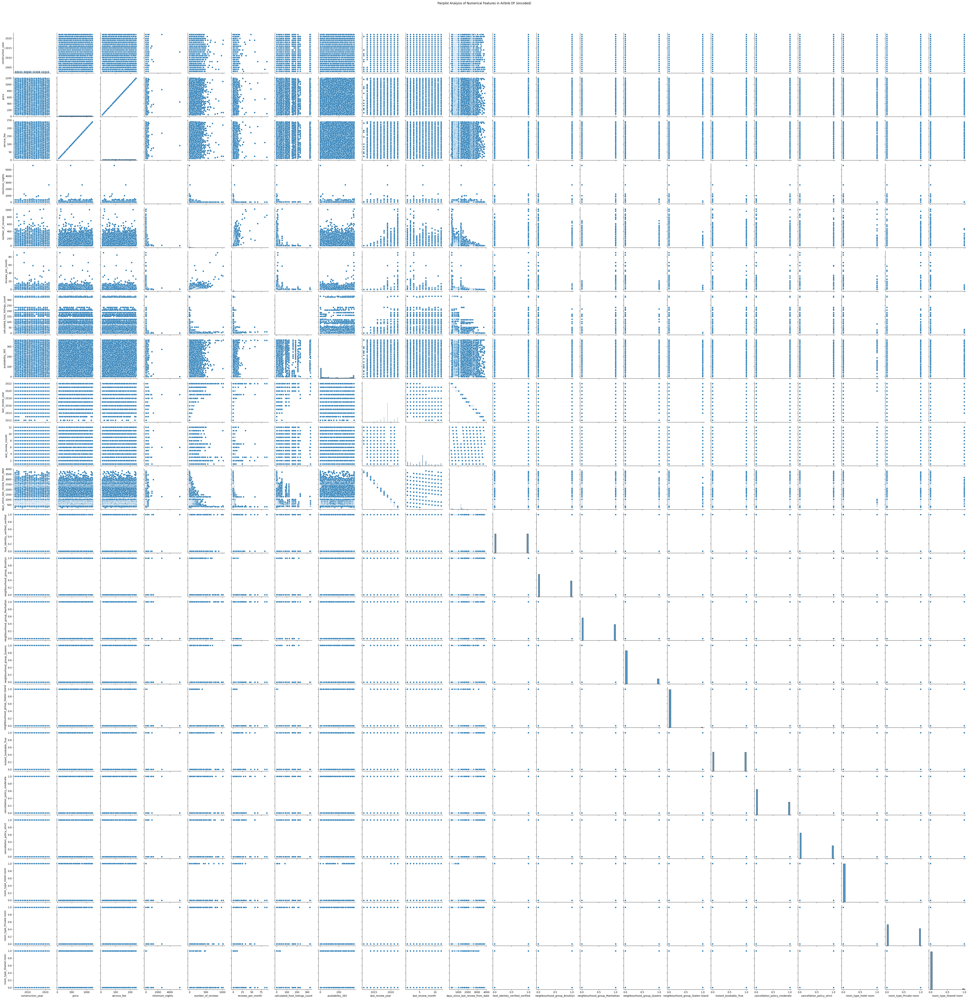

In [79]:
# Create a Pairplot to look at all relationships. 
# There is nothing significant that arises, as most of the relationships we see are from before.

# Create a pairplot - look at all relationships
pairplot_cols_list = ['construction_year', 'price', 'service_fee', 'minimum_nights',
        'number_of_reviews', 'reviews_per_month',
        'calculated_host_listings_count',
        'availability_365',
        'last_review_year', 'last_review_month',
        'days_since_last_review_from_date', 'host_identity_verified_verified',
        'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
        'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
        'instant_bookable_True', 'cancellation_policy_moderate',
        'cancellation_policy_strict', 'room_type_Hotel room',
        'room_type_Private room', 'room_type_Shared room']

sns.pairplot(encoded_df[pairplot_cols_list])
plt.suptitle('Pairplot Analysis of Numerical Features in Airbnb DF (encoded)', y=1.02)  # Adjust y for title positioning
plt.show()

In [80]:
encoded_df.columns

Index(['id', 'NAME', 'host_id', 'host_name', 'neighbourhood', 'lat', 'long',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'last_review_NEW',
       'last_review_year', 'last_review_month',
       'days_since_last_review_from_date', 'host_identity_verified_verified',
       'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan',
       'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island',
       'instant_bookable_True', 'cancellation_policy_moderate',
       'cancellation_policy_strict', 'room_type_Hotel room',
       'room_type_Private room', 'room_type_Shared room'],
      dtype='object')

### Normality Assumption

Histogram with KDE (Kernel Density Estimate):

* Histogram suggest distribution of the price-variable, which is still uniform.
We see that prices are quite evenly distributed, but does have some higher numbers around 1200 for price.

QQ Plot
* We see the deviation from the red-line, suggesting price is NOT normally distributed.
* There is an S-shape versus the expected straight line following the QQ plot.

* Incidentally, these are the same insights for service-fee as well, which makes sense as they're usually a % of the price.

When we do modelling, we should consider applying Box-Cox transformation for pricing when handling for modelling, due to price not being normal, and potentially look at outliers.


## Count Vectorization - Amenities

### Extracting features from words - House_Rules

In [81]:
# Count Vectorize - count the most common words from house_rules
vectorizer = CountVectorizer(max_features=30, stop_words='english')
house_rules_matrix = vectorizer.fit_transform(df_1['house_rules'])
house_rules_df = pd.DataFrame(house_rules_matrix.toarray(), columns=vectorizer.get_feature_names_out())

# Reset indexes:
df_1 = df_1.reset_index(drop=True)
house_rules_df = house_rules_df.reset_index(drop=True)

In [82]:
# Concatenate the DataFrames
df_1 = pd.concat([df_1, house_rules_df], axis=1)

In [83]:
# Check Dataframe
df_1

,id,NAME,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,respect,respectful,room,rules,shoes,smoking,stay,time,unknown,use
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,0,0,0,0,0,1,0,0,0,0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,0,0,0,0,0,1,0,0,0,0
2,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,False,...,0,0,0,0,1,1,0,0,0,0
3,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.74767,-73.97500,True,...,0,0,0,0,0,1,0,0,0,0
4,1005202,BlissArtsSpace!,90821839709,unconfirmed,Emma,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,False,...,1,0,1,0,2,0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83842,57351953,Cozy room in a 2B with backyard access,5155155913,unconfirmed,Cristina,Queens,Astoria,40.76987,-73.92679,False,...,0,1,0,0,0,0,0,0,0,0
83843,57352505,An East Williamsburg Delight,71564706996,verified,Petra,Brooklyn,Bedford-Stuyvesant,40.68335,-73.91222,True,...,0,0,0,0,0,0,0,0,1,0
83844,57353057,Cozy bedroom in williamsburg,83101851929,verified,Russell,Brooklyn,Williamsburg,40.70870,-73.96710,True,...,0,0,0,0,0,0,0,0,0,0
83845,57353610,Spacious Room w/ 2 Bed,69037598918,unconfirmed,Christine,Queens,Bayside,40.75047,-73.75349,False,...,0,0,0,0,0,0,0,0,1,0


In [84]:
house_rules_df.columns

Index(['allowed', 'apartment', 'ask', 'building', 'check', 'clean', 'don',
       'guests', 'home', 'house', 'kitchen', 'leave', 'let', 'neighbors',
       'noise', 'parties', 'pets', 'pm', 'property', 'quiet', 'respect',
       'respectful', 'room', 'rules', 'shoes', 'smoking', 'stay', 'time',
       'unknown', 'use'],
      dtype='object')

In [85]:
# Removal of these recent counts, such as "ask", "allowed", "don", "let", "parties", "pm", "use"
# I will keep "unknown" since that was our placeholder.
# I will also be removing party, since I want to count "PARTY" and "NO PARTY", which are two different concepts

# Drop once:
df_1.drop(columns = ["ask", "allowed", "don", "let", "parties", "pm", "use"], inplace = True)

In [86]:
# Let's manually count party and no party...
# import pandas as pd
# import re

# Define regex patterns for allowing parties and prohibiting parties
allow_parties_pattern = re.compile(r'\ballow\b.*\bparty\b|\ballow\b.*\bparties\b', re.IGNORECASE)
prohibit_parties_pattern = re.compile(r'\bno\b.*\bparty\b|\bno\b.*\bparties\b', re.IGNORECASE)

# Create binary features for allowing and prohibiting parties
df_1['allow_parties'] = df_1['house_rules'].apply(lambda x: 1 if allow_parties_pattern.search(x) else 0)
df_1['prohibit_parties'] = df_1['house_rules'].apply(lambda x: 1 if prohibit_parties_pattern.search(x) else 0)

# Count occurrences of allowing and prohibiting parties
allow_parties_count = df_1['allow_parties'].sum()
prohibit_parties_count = df_1['prohibit_parties'].sum()

# Print the counts
print(f'Number of listings allowing parties: {allow_parties_count}')
print(f'Number of listings prohibiting parties: {prohibit_parties_count}')

Number of listings allowing parties: 1079
Number of listings prohibiting parties: 8479


In [87]:
# Check amenities available

# List of amenities to check
amenities = [
    'subway', 'park', 'museum', 'restaurant', 'bar', 'cafe', 'grocery', 'market', 
    'theater', 'shopping', 'gym', 'school', 'library', 'pharmacy', 'bank', 
    'hospital', 'clinic', 'stadium', 'beach', 'zoo'
]

# Create binary features for each amenity
for amenity in amenities:
    df_1[f'near_{amenity}'] = df_1['house_rules'].str.contains(amenity, case=False, na=False).astype(int)

# Verify the new binary features
print(df_1[[f'near_{amenity}' for amenity in amenities]].head())

# Count occurrences of each amenity
amenity_counts = df_1[[f'near_{amenity}' for amenity in amenities]].sum()
print(amenity_counts)

   near_subway  near_park  near_museum  near_restaurant  near_bar  near_cafe  \
0            0          0            0                0         0          0   
1            0          0            0                0         0          0   
2            0          0            0                0         0          0   
3            0          0            0                0         0          0   
4            0          1            0                0         0          0   

   near_grocery  near_market  near_theater  near_shopping  near_gym  \
0             0            0             0              0         0   
1             0            0             0              0         0   
2             0            0             0              0         0   
3             0            0             0              0         0   
4             0            0             0              0         0   

   near_school  near_library  near_pharmacy  near_bank  near_hospital  \
0            0     

## Google Maps API Code - Running and retrieving all distances - do not run code.

* This code took approximately two hours, the results were already previously retrieved. Do not run again, please refer to the batch files.
* For simplicity sake, this section had created 84 batch files, and combined them all in the code seen below.
* The final result "Aribnb_with_proximity_scores_final.csv" will be used as the base.

In [88]:
# # Proximity Metric Code to calculate it

# import requests
# import os
# from dotenv import load_dotenv

# load_dotenv()

# # Google API Key (replace 'YOUR_API_KEY' with your actual API key)
# api_key = os.getenv('GOOGLE_API_KEY')

# # Example coordinates of popular locations in NYC
# locations = {
#     'Times_Square': '40.7580,-73.9855',
#     'Central_Park': '40.7851,-73.9683',
#     'Statue_of_Liberty': '40.6892,-74.0445',
#     'Empire_State_Building': '40.7484,-73.9857',
#     'Brooklyn_Bridge': '40.7061,-73.9969',
#     'Metropolitan_Museum_of_Art': '40.7794,-73.9632'
# }


In [89]:
# DO NOT RUN THIS CODE!

# # Function to validate coordinates
# def validate_coordinates(lat, long):
#     return -90 <= lat <= 90 and -180 <= long <= 180

# # Function to get distance from Google Distance Matrix API
# def get_distance_matrix(origins, destinations, api_key):
#     url = f'https://maps.googleapis.com/maps/api/distancematrix/json?origins={origins}&destinations={destinations}&key={api_key}'
#     response = requests.get(url)
#     if response.status_code == 200:
#         result = response.json()
#         if 'rows' in result and len(result['rows']) > 0:
#             elements = result['rows'][0]['elements']
#             distances = []
#             for element in elements:
#                 if element['status'] == 'OK' and 'distance' in element:
#                     distances.append(element['distance']['value'] / 1000)  # distance in kilometers
#                 else:
#                     distances.append(float('inf'))  # Assign a large value if distance is not found
#             return distances
#     return [float('inf')] * len(destinations)  # Return a large value if request fails

# # Calculate distances and build proximity score
# def calculate_proximity_score(row, locations, api_key):
#     if not validate_coordinates(row['lat'], row['long']):
#         return float('inf')  # Assign a large value if coordinates are invalid
#     origins = f"{row['lat']},{row['long']}"
#     destinations = "|".join(locations.values())
#     distances = get_distance_matrix(origins, destinations, api_key)
#     return sum(distances)  # Proximity score is the sum of distances

# # Function to process data in batches
# def process_in_batches(df_1, batch_size, locations, api_key, output_file_prefix):
#     num_batches = int(np.ceil(len(df_1) / batch_size))
#     for batch_num in range(num_batches):
#         start_index = batch_num * batch_size
#         end_index = min((batch_num + 1) * batch_size, len(df_1))
#         df_batch = df_1.iloc[start_index:end_index].copy()
#         df_batch['proximity_score'] = df_batch.apply(lambda row: calculate_proximity_score(row, locations, api_key), axis=1)
#         batch_output_file = f"{output_file_prefix}_batch_{batch_num + 1}.csv"
#         df_batch.to_csv(batch_output_file, index=False)
#         print(f"Processed batch {batch_num + 1}/{num_batches} and saved to {batch_output_file}")
#         df_1.loc[start_index:end_index-1, 'proximity_score'] = df_batch['proximity_score'].values

# # Create the output directory if it doesn't exist
# output_directory = 'C:/Users/chris/OneDrive/Documents/VSCode/MBAN_GroupProject/MBAN6110_GroupProject/Distance_Results'
# if not os.path.exists(output_directory):
#     os.makedirs(output_directory)

# # Define batch size and output file prefix
# batch_size = 1000  # Best batch size to manage speed and number of files created.
# output_file_prefix = os.path.join(output_directory, 'Airbnb_with_proximity_scores')

# # Process the entire data in batches
# process_in_batches(df_1, batch_size, locations, api_key, output_file_prefix)

In [90]:
# # Code to combine the batch results

# import pandas as pd
# import glob
# import os

# # Define output file prefix and final output file
# output_file_prefix = 'C:/Users/chris/OneDrive/Documents/VSCode/MBAN_GroupProject/MBAN6110_GroupProject/Distance_Results/Airbnb_with_proximity_scores'
# final_output_file = 'C:/Users/chris/OneDrive/Documents/VSCode/MBAN_GroupProject/MBAN6110_GroupProject/Distance_Results/Airbnb_with_proximity_scores_final.csv'

# # Get all batch files
# batch_files = glob.glob(f"{output_file_prefix}_batch_*.csv")

# # Combine all batch files into a single DataFrame
# df_combined = pd.concat((pd.read_csv(f) for f in batch_files), ignore_index=True)

# # Save the combined DataFrame to the final output files
# df_combined.to_csv(final_output_file, index=False)

# # Verify the combined features
# print(df_combined[['lat', 'long', 'proximity_score']].head())

# Part 5: New Data Setup (incl. Proximity Score) + Final Feature-Engineering

* After the Google API extraction for proximity score, the results were saved under a new file called "Airbnb_with_proximity_scores_final.csv"
* For simplicity purposes, as this extracted CSV contains all the steps taken up to this point (in Section 5), it will be utilized directly.
* We will begin by importing the dataset.

In [91]:
new_path_online = "https://drive.google.com/uc?id=1O8NNjuTo436vLi1FyEW1U6UabG5jP3-c&export=download"

In [92]:
# Read for new dataframe
cleaned_df = pd.read_csv(new_path_online)

In [93]:
# Let's make a backup in case, via updated_df
updated_df = cleaned_df.copy()

In [94]:
updated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83847 entries, 0 to 83846
Data columns (total 73 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                83847 non-null  int64  
 1   NAME                              83847 non-null  object 
 2   host_id                           83847 non-null  int64  
 3   host_identity_verified            83847 non-null  object 
 4   host_name                         83847 non-null  object 
 5   neighbourhood_group               83847 non-null  object 
 6   neighbourhood                     83847 non-null  object 
 7   lat                               83847 non-null  float64
 8   long                              83847 non-null  float64
 9   instant_bookable                  83847 non-null  bool   
 10  cancellation_policy               83847 non-null  object 
 11  room_type                         83847 non-null  object 
 12  cons

C:\Users\chris\AppData\Local\Temp\ipykernel_16220\3422400758.py:11: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data = df, x = col_name, kde = True, palette= "Accent") # Check KDE distribution shape


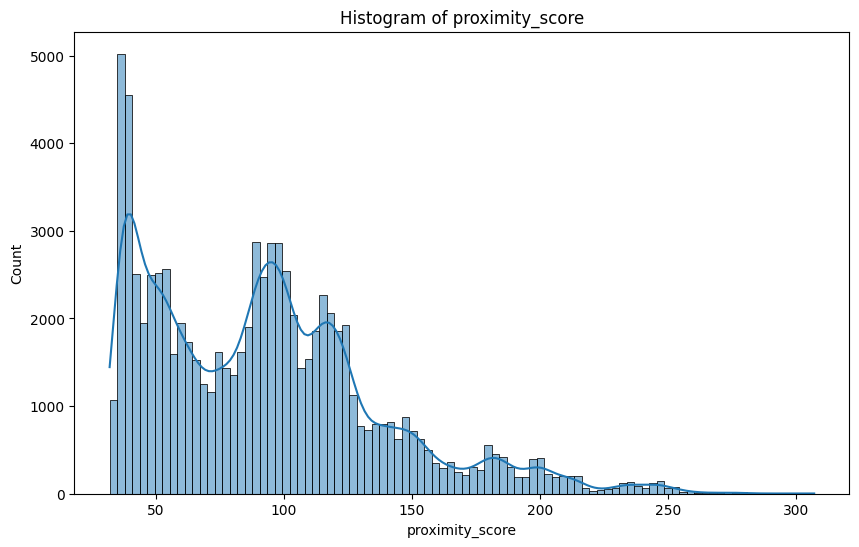

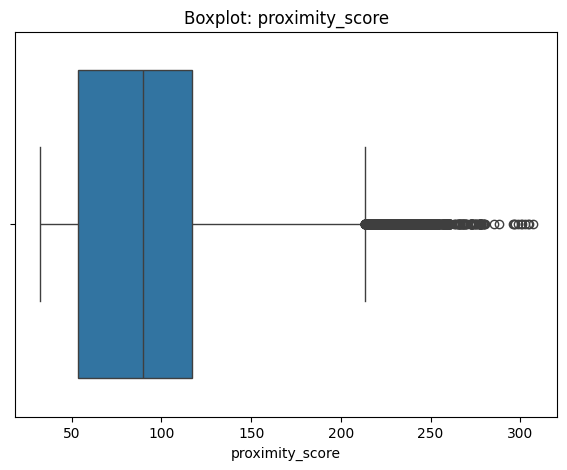

The median for proximity_score is 89.811


In [95]:
# Check characteristics of proximity_score, like distribution
numerical_var_graphs(updated_df, "proximity_score")

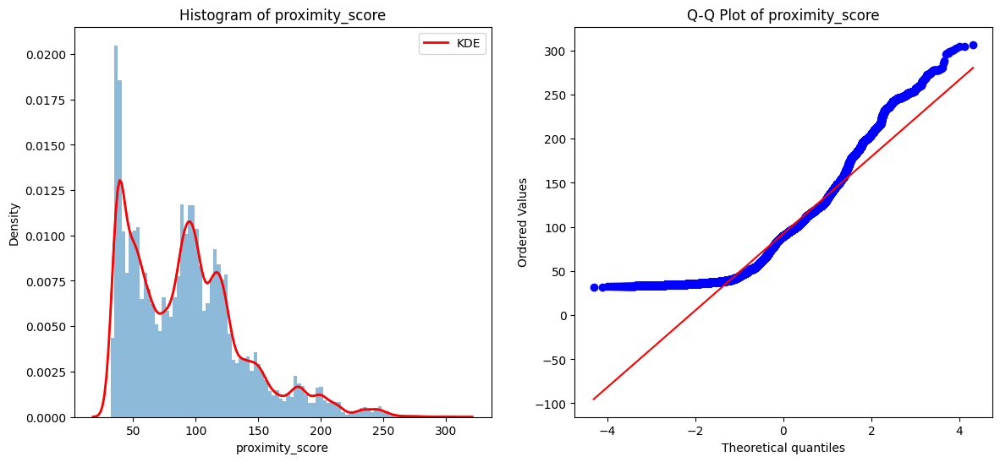

In [96]:
# Check normality assumption:
check_normality(updated_df, "proximity_score")

# Data is not normally distributed, similar to price and service_fee

## Bivariate Analysis - vs. Proximity Score

* Before we continue, let's look at Bivariate analysis with the new metric, proximity score.

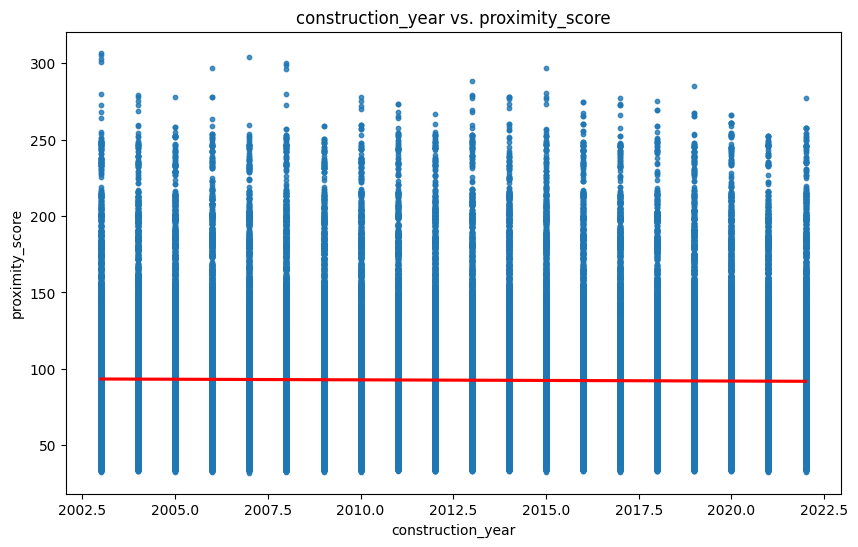

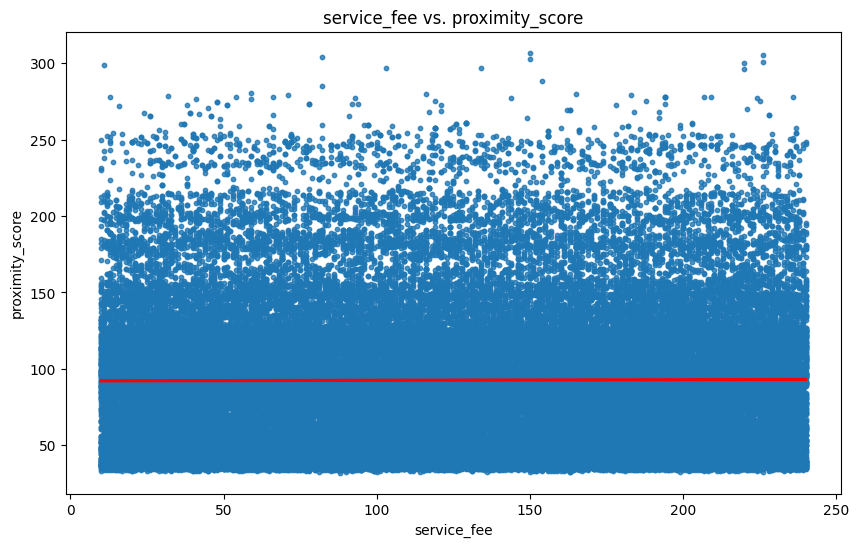

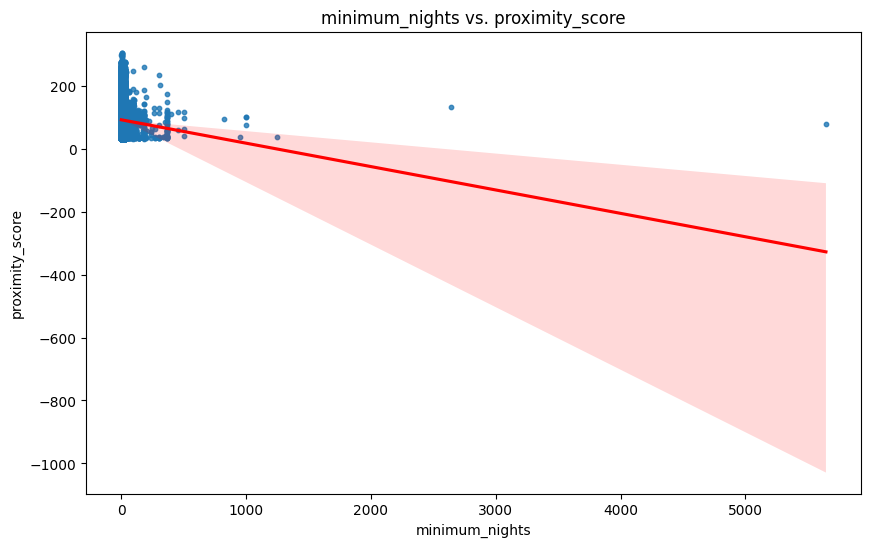

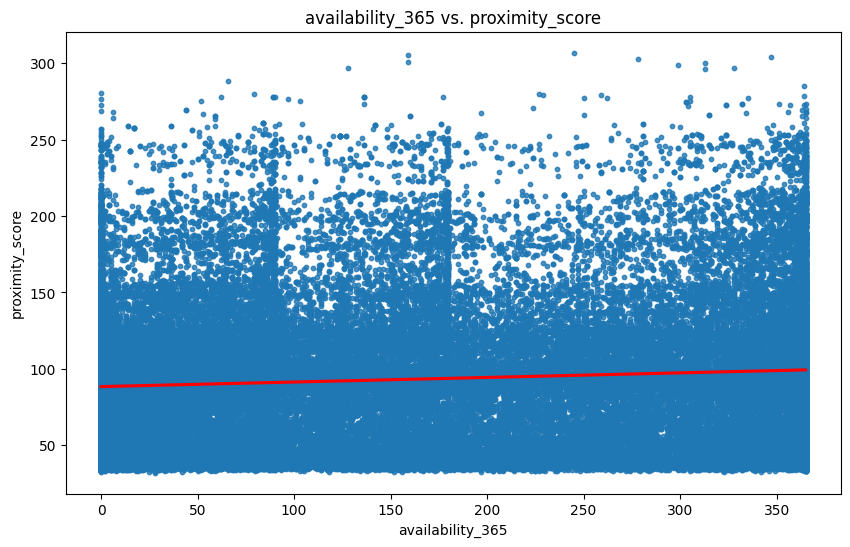

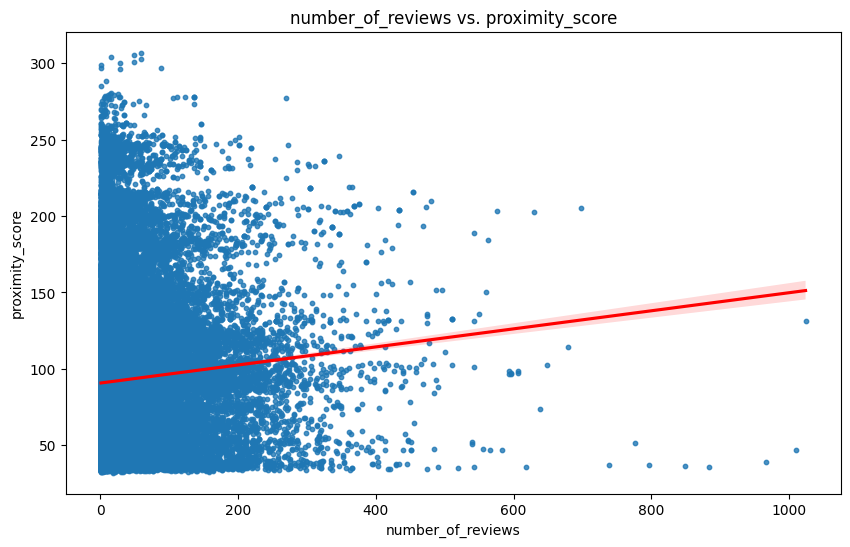

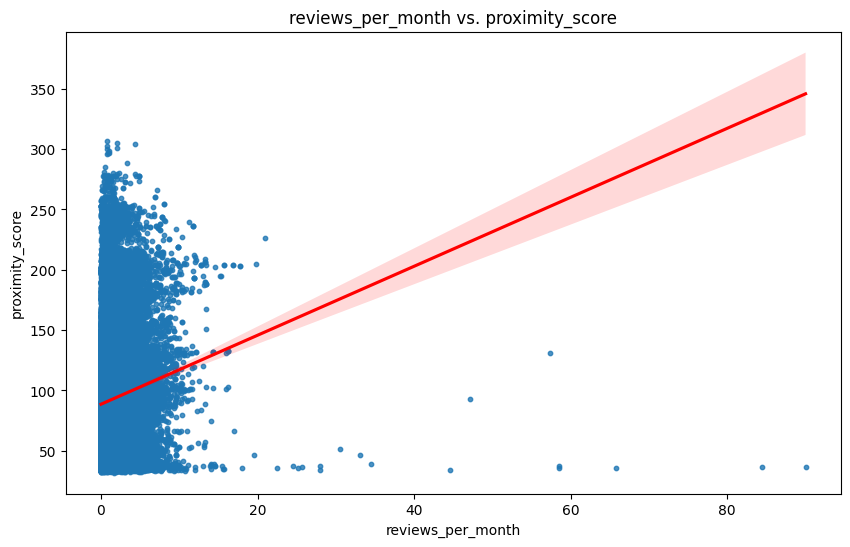

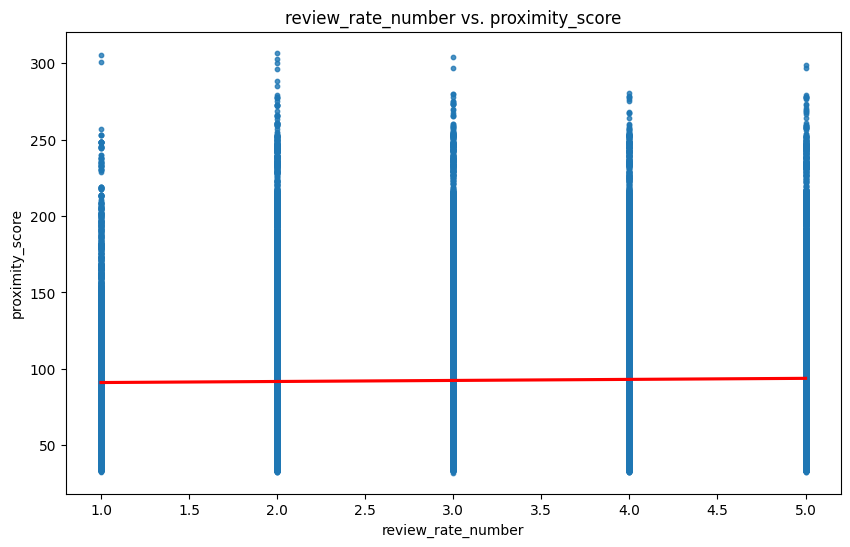

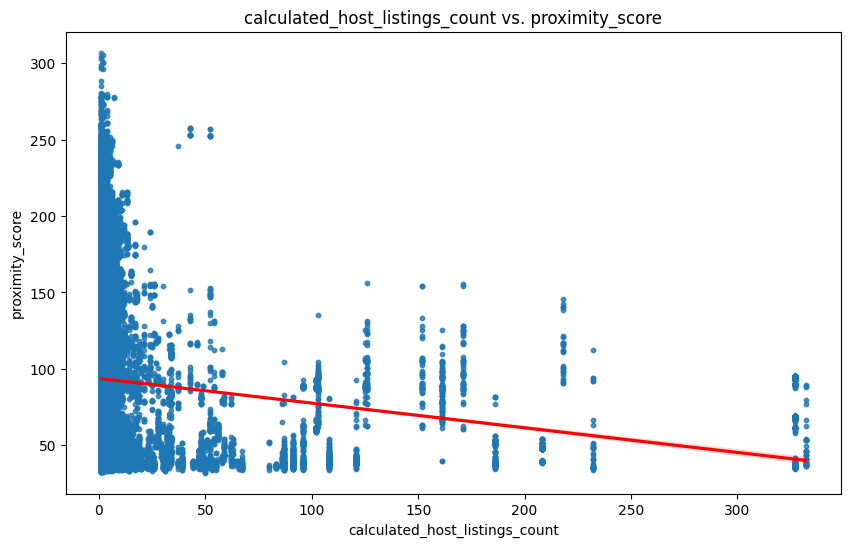

In [97]:
# Scatter plots
number_cols = ["construction_year", "service_fee", "minimum_nights", "availability_365","number_of_reviews", "reviews_per_month", "review_rate_number", "calculated_host_listings_count"]

for col in number_cols:
    plot_scatter(updated_df,col,"proximity_score")

## Final Feature-Engineering Considerations

* After a final look at the data, it was determined some additional columns may be created before fully beginning modelling.
* This includes: seasonality, house_rule sentiments, and having wifi and kitchen. This was added below.
* Finally, it was determined to complete one-hot encoding for categorical variables prior to machine learning modelling so it would be easier to identify feature importance later on (i.e. it may be difficult with the pipeline later on at the end.)

In [98]:
# Let's add a seasonality effect from last_review, it might give us a clue if someone left a review, when the last time's season was
# Seasonality Effects - label the months for season
# Define a function to label the seasons
def label_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'
    else:
        return 'Unknown'

In [99]:
# Apply the function to create a new 'season' column
updated_df['season'] = updated_df['last_review_month'].apply(label_season)

# Verify the new features
print(updated_df[['last_review_month', 'season']].head())

   last_review_month  season
0                 10    Fall
1                  5  Spring
2                 11    Fall
3                  6  Summer
4                 10    Fall


In [100]:
# Sentiment of the house_rules, let's see if it was written in a kind or angry way
def get_sentiment(text):
    return TextBlob(text).sentiment.polarity

In [101]:
# Retrieve sentiment using the function above
updated_df['house_rules_sentiment'] = updated_df['house_rules'].apply(get_sentiment)

<Axes: xlabel='house_rules_sentiment'>

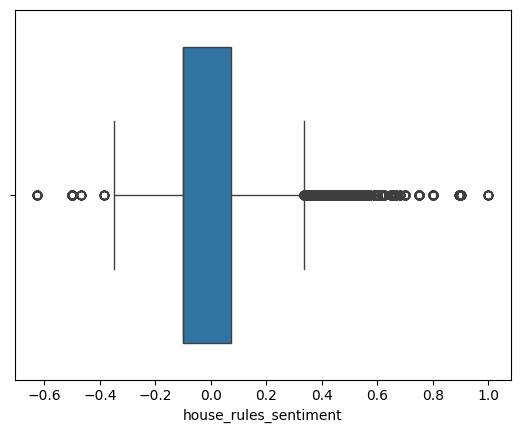

In [102]:
# Interestingly, we see some house rules where the sentiment polarity (negative) suggests more negative, and a good rnage of positive sounding house rules.
sns.boxplot(data = updated_df, x = 'house_rules_sentiment')

In [103]:
# Check wifi and kitchen amenities as well:
updated_df['has_wifi'] = updated_df['house_rules'].str.contains('wifi', case=False, na=False).astype(int)
updated_df['has_kitchen'] = updated_df['house_rules'].str.contains('kitchen', case=False, na=False).astype(int)

In [104]:
updated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83847 entries, 0 to 83846
Data columns (total 77 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                83847 non-null  int64  
 1   NAME                              83847 non-null  object 
 2   host_id                           83847 non-null  int64  
 3   host_identity_verified            83847 non-null  object 
 4   host_name                         83847 non-null  object 
 5   neighbourhood_group               83847 non-null  object 
 6   neighbourhood                     83847 non-null  object 
 7   lat                               83847 non-null  float64
 8   long                              83847 non-null  float64
 9   instant_bookable                  83847 non-null  bool   
 10  cancellation_policy               83847 non-null  object 
 11  room_type                         83847 non-null  object 
 12  cons

In [105]:
# Let's go back to feature-encoding via One-Hot Encoding, prior to doing te model.

encoding_list = ['season','host_identity_verified',
 'neighbourhood_group',
 'instant_bookable',
 'cancellation_policy',
 'room_type']

In [106]:
# Begin Encoding
updated_df = pd.get_dummies(updated_df, columns=encoding_list, drop_first=True)

In [107]:
# We see the type change, and new encoding variables created.
updated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83847 entries, 0 to 83846
Data columns (total 85 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   id                                 83847 non-null  int64  
 1   NAME                               83847 non-null  object 
 2   host_id                            83847 non-null  int64  
 3   host_name                          83847 non-null  object 
 4   neighbourhood                      83847 non-null  object 
 5   lat                                83847 non-null  float64
 6   long                               83847 non-null  float64
 7   construction_year                  83847 non-null  float64
 8   price                              83847 non-null  float64
 9   service_fee                        83847 non-null  float64
 10  minimum_nights                     83847 non-null  float64
 11  number_of_reviews                  83847 non-null  flo

In [108]:
# Check if Host_ID is unique. If it is not, we could consider adding up number of listings each host has:
updated_df["host_id"].is_unique

# It's Unique.

True

In [109]:
# Modelling does not handle bool well, so we need to convert them into integers
updated_df = updated_df.apply(lambda x: x.astype('float64') if x.dtype == 'bool' else x)

In [110]:
updated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83847 entries, 0 to 83846
Data columns (total 85 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   id                                 83847 non-null  int64  
 1   NAME                               83847 non-null  object 
 2   host_id                            83847 non-null  int64  
 3   host_name                          83847 non-null  object 
 4   neighbourhood                      83847 non-null  object 
 5   lat                                83847 non-null  float64
 6   long                               83847 non-null  float64
 7   construction_year                  83847 non-null  float64
 8   price                              83847 non-null  float64
 9   service_fee                        83847 non-null  float64
 10  minimum_nights                     83847 non-null  float64
 11  number_of_reviews                  83847 non-null  flo

In [111]:
updated_df.columns

Index(['id', 'NAME', 'host_id', 'host_name', 'neighbourhood', 'lat', 'long',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'last_review_NEW',
       'last_review_year', 'last_review_month',
       'days_since_last_review_from_date', 'apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'kitchen', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clin

## VIF and Colinearity of Variables

In [112]:
# All Columns in consideration for modelling - note, "kitchen" was removed as "has_kitchen was created before"
# Let's ignore ID identifiers.
columns_consideration = ['construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365',
       'last_review_year', 'last_review_month',
       'days_since_last_review_from_date', 'apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clinic', 'near_stadium', 'near_beach',
       'near_zoo', 'proximity_score', 'house_rules_sentiment', 'has_wifi',
       'has_kitchen', 'season_Spring', 'season_Summer', 'season_Winter',
       'host_identity_verified_verified', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'instant_bookable_True',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room']

In [113]:
updated_df[columns_consideration]

,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,last_review_year,...,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,instant_bookable_True,cancellation_policy_moderate,cancellation_policy_strict,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,2020.0,966.0,193.0,10.0,9.0,0.21,4.0,6.0,286.0,2021,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,2007.0,142.0,28.0,30.0,45.0,0.38,4.0,2.0,228.0,2022,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,2009.0,204.0,41.0,10.0,9.0,0.10,3.0,1.0,289.0,2018,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,2013.0,577.0,115.0,3.0,74.0,0.59,3.0,1.0,365.0,2019,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,2009.0,1060.0,212.0,45.0,49.0,0.40,5.0,1.0,219.0,2017,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83842,2014.0,552.0,110.0,2.0,89.0,1.94,1.0,1.0,187.0,2019,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
83843,2003.0,771.0,154.0,30.0,143.0,3.17,2.0,1.0,346.0,2019,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
83844,2010.0,643.0,129.0,14.0,3.0,0.07,4.0,1.0,206.0,2017,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
83845,2018.0,1169.0,234.0,5.0,78.0,2.32,2.0,1.0,162.0,2019,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [114]:
updated_df[columns_consideration].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83847 entries, 0 to 83846
Data columns (total 74 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   construction_year                  83847 non-null  float64
 1   price                              83847 non-null  float64
 2   service_fee                        83847 non-null  float64
 3   minimum_nights                     83847 non-null  float64
 4   number_of_reviews                  83847 non-null  float64
 5   reviews_per_month                  83847 non-null  float64
 6   review_rate_number                 83847 non-null  float64
 7   calculated_host_listings_count     83847 non-null  float64
 8   availability_365                   83847 non-null  float64
 9   last_review_year                   83847 non-null  int64  
 10  last_review_month                  83847 non-null  int64  
 11  days_since_last_review_from_date   83847 non-null  int

In [115]:
def check_colinearity(df, full_cols, drop_cols):
    # Calculate the correlation matrix
    corr_matrix = df[full_cols].corr()

    # Plot the heatmap
    plt.figure(figsize=(40, 40))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation Matrix')
    plt.show()

    # Drop the specified columns - we are only focusong on "full_cols" defined
    modified_df = df[full_cols].drop(columns=drop_cols)

    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = modified_df.columns
    vif_data["VIF"] = [variance_inflation_factor(modified_df.values, i) for i in range(len(modified_df.columns))]

    # Sort by VIF in descending order and get the top 10 features
    top_vif_features = vif_data.sort_values(by="VIF", ascending=False).head(5)

    # Display the VIF data
    print(top_vif_features)


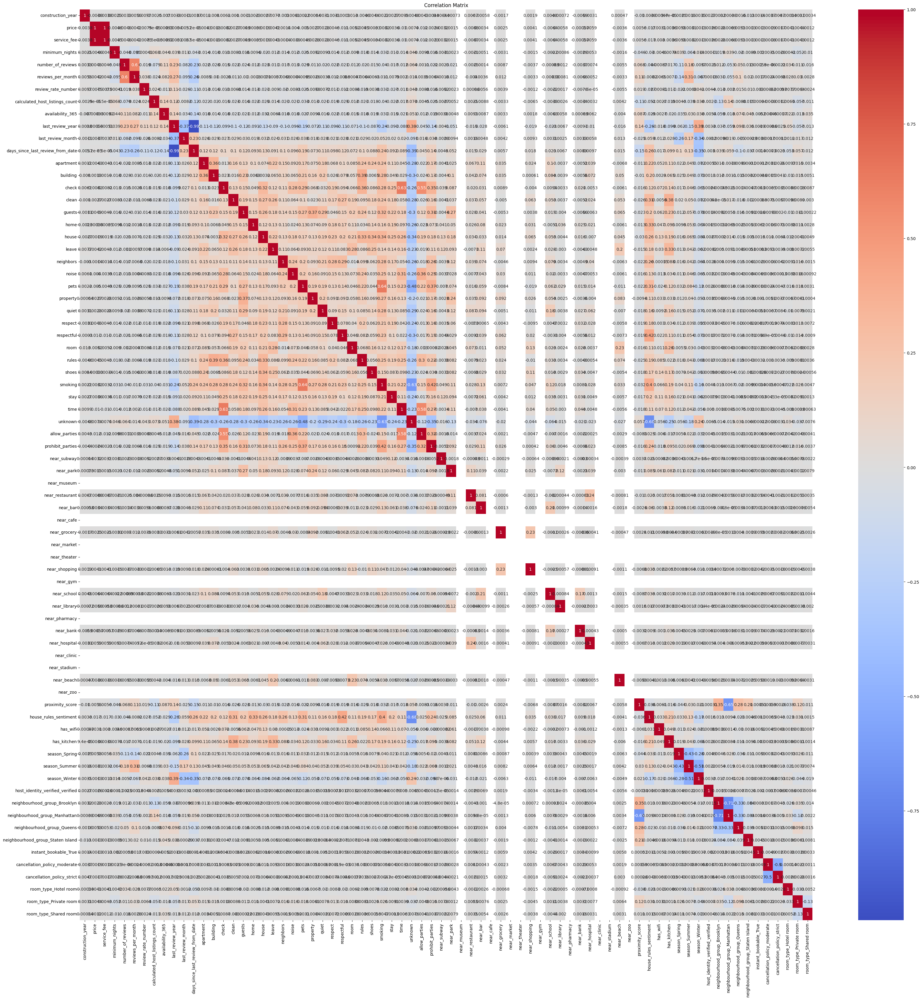

c:\Users\chris\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\regression\linear_model.py:1785: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                          Feature            VIF
0               construction_year  122184.621177
8                last_review_year  121839.168919
64  neighbourhood_group_Manhattan      19.407563
63   neighbourhood_group_Brooklyn      16.861006
55                proximity_score      10.059280


In [116]:
# updated_df = df  # Replace with your actual DataFrame - we are only not considering price for VIF, since it's the target variable.
check_colinearity(updated_df, columns_consideration, ["price"]) 

### Important Conclusions:
* From the above analysis, the most important features to remove are "construction year" and "last_review_year", they will not be considered when feature modelling as they are highly correlated.
* Let's also remove last_review_month, since we already extracted the season before.

# Part 6: ML Modelling Setups

In [117]:
# Model Initialization:
regression_models = {
    'KNN Regressor': KNeighborsRegressor(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'Support Vector Regressor': SVR(),
}

In [118]:
# Regression Columns - Recall, we don't need price, service_fee, construction year, and last review year + last review month

regression_model_cols = ['minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365',
       'days_since_last_review_from_date', 'apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clinic', 'near_stadium', 'near_beach',
       'near_zoo', 'proximity_score', 'house_rules_sentiment', 'has_wifi',
       'has_kitchen', 'season_Spring', 'season_Summer', 'season_Winter',
       'host_identity_verified_verified', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'instant_bookable_True',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room']


### ML Setup - Train/Test and Column Identifications

In [119]:
# Define the predictor and target variables
X = updated_df[regression_model_cols]
y = updated_df["price"]

In [120]:
# Create the train/test split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state= 42)

In [121]:
# Define the numerical columns and categorical columns, based on the regression_model_cols above.
# Service Fee is also removed - because 
numerical_columns = ['minimum_nights',
       'number_of_reviews','reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365',
       'days_since_last_review_from_date', 'proximity_score', 'house_rules_sentiment']

categorical_columns = ['apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clinic', 'near_stadium', 'near_beach',
       'near_zoo', 'has_wifi', 'has_kitchen',
       'season_Spring', 'season_Summer', 'season_Winter',
       'host_identity_verified_verified', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'instant_bookable_True',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room', 'last_review_year', 'last_review_month']

In [122]:
def get_feature_names(column_transformer, X_train):
    # Fit the column transformer to the training data
    column_transformer.fit(X_train)
    output_features = []

    # Loop through the transformers
    for name, pipe, features in column_transformer.transformers_:
        if name == 'num':
            output_features.extend(features)
        elif name == 'cat':
            ohe = pipe
            if isinstance(pipe, Pipeline):
                ohe = pipe.named_steps['onehotencoder']
            feat_names = ohe.get_feature_names_out(features).tolist()
            output_features.extend(feat_names)
    
    return output_features

In [123]:
# Complete Residual Analysis later - will apply in the model evaluations scores
def plot_residuals(y_test, y_pred, model_name):
    residuals = y_test - y_pred
    
    plt.figure(figsize=(12, 8))
    
    # Residuals vs Fitted
    plt.subplot(2, 2, 1)
    plt.scatter(y_pred, residuals)
    plt.axhline(y=0, color='r')
    plt.xlabel('Fitted values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Fitted values ({model_name})')
    
    # Q-Q plot
    plt.subplot(2, 2, 2)
    sm.qqplot(residuals, line='s', ax=plt.gca())
    plt.title('Q-Q plot')
    
    # Histogram of residuals
    plt.subplot(2, 2, 3)
    sns.histplot(residuals, kde=True)
    plt.xlabel('Residuals')
    plt.title(f'Histogram of Residuals - {model_name}')

    # Show all the graphs:
    plt.tight_layout()
    plt.show()

In [124]:
# Set up Prepocessor
preprocessor = ColumnTransformer(
    transformers=[('num',MinMaxScaler(),numerical_columns)]) 

# We are skipping one-hot encoding since it was already completed in previous steps, in order to check our EDA.
# Additionally, doing it in the pre-processor steps does it make harder to gain insights

In [125]:
#Store the results of the complex regression models:
complex_model_results = []

In [126]:
# Code for Model Evaluation - Regression Models we will run.
def model_evaluation(model_name, model, param_grids = None):
    global complex_model_results

    # Set up pipeline
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), (model_name.lower().replace(' ', ''), model)])
    
    # Complete the grid search
    if param_grids: # If there is one
        grid_search = GridSearchCV(pipeline, param_grids, cv = 5, scoring = "neg_mean_squared_error")
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        print(f"Best parameters for {model_name} is {grid_search.best_params_}")

    else:
        best_model = pipeline
        best_model.fit(X_train, y_train)

    # Create the predictions
    y_pred = best_model.predict(X_test)

    # Metrics for evaluation:
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    # Calculated Adjusted R2 to factor in increasing variables will improve R2.
    n = X_test.shape[0]  # number of observations
    p = X_test.shape[1]  # number of predictors
    adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

    # Conduct Cross Validation Scoring:
    cv_scores = cross_val_score(best_model, X, y, cv = 5, scoring = "neg_mean_squared_error")

    # Extract feature names using the best_model created for each model
    feature_names = get_feature_names(best_model.named_steps['preprocessor'], X_train)

    # Look at Residual Analysis too. Function defined outside.
    plot_residuals(y_test, y_pred, model_name)

    # Print results
    print(f"{model_name}: RMSE {rmse}, R2: {r2}, Adjusted_R2: {adjusted_r2}, MAE: {mae}, Cross-Val Score: {np.mean(cv_scores)}")

    # Store results
    complex_model_results.append({
        "Model_Name": model_name,
        "Model_Object_Saved": best_model,
        "Best_Parameters": grid_search.best_params_ if param_grids else None,
        "RMSE": rmse,
        "Adjusted_R2": adjusted_r2,
        "CrossVal_Score": np.mean(cv_scores),
        "Feature_Names": feature_names
    })

# Part 6a: ML Regression Models (LONG RUNTIME)

* Code will take over 60+ minutes to run
* Using the params grid above and GridSearchCV, the five regression models (KNN, Decision Tree, Random Forest, Gradient Boosting and Support Vector Machine) were modelled.

In [121]:
# Complex Results df to store results
complex_model_results = []

In [122]:
# Parameter Grid for some regression models to try later:
param_grids = {
    'KNN Regressor': {
        'knnregressor__n_neighbors': [1000, 5000, 8000] # Determining from up to 10% of the size of the 83K rows dataset
    },
    'Decision Tree Regressor': {
        'decisiontreeregressor__max_depth': [None, 10, 20, 30]
    },
    'Random Forest Regressor': {
        'randomforestregressor__n_estimators': [50, 100, 200],
        'randomforestregressor__max_depth': [None, 10, 20, 30]  # Adding max_depth to prevent overfitting
    },
    'Gradient Boosting Regressor': {
        'gradientboostingregressor__n_estimators': [100, 200],
        'gradientboostingregressor__learning_rate': [0.01, 0.1],
        'gradientboostingregressor__max_depth': [3, 5, 7]  # Adding max_depth for better control over fitting
    },
    'Support Vector Regressor': {
        'supportvectorregressor__C': [0.1, 1, 10],
        'supportvectorregressor__gamma': [0.001, 0.01, 0.1],
        'supportvectorregressor__epsilon': [0.1, 0.2, 0.5]  # Adding epsilon to control the tube size in which no penalty is associated
    },
}

{'knnregressor__n_neighbors': [1000, 5000, 8000]}
Best parameters for KNN Regressor is {'knnregressor__n_neighbors': 8000}


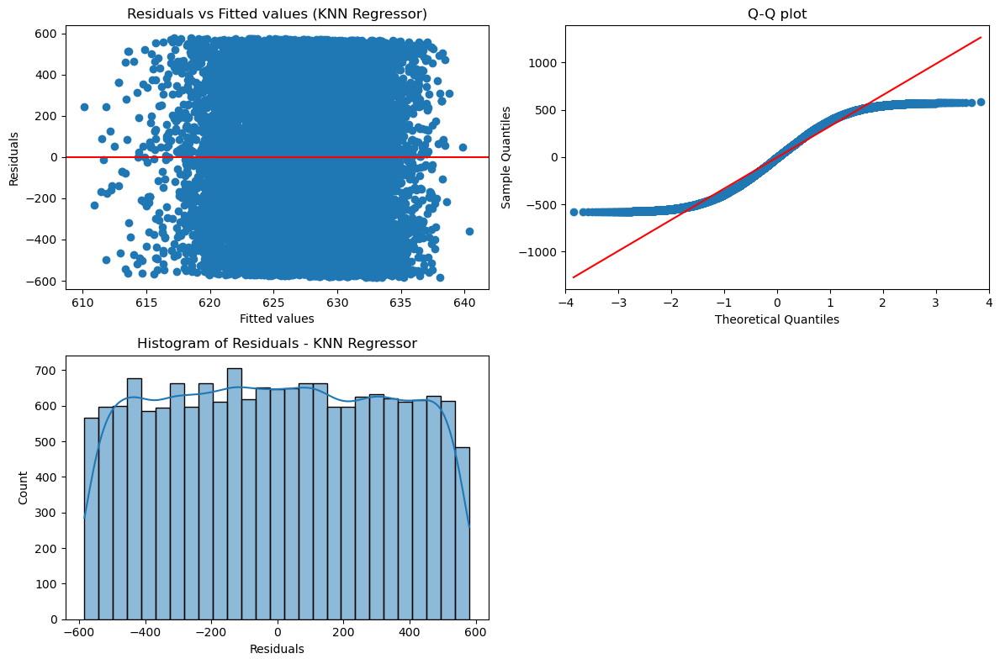

KNN Regressor: RMSE 329.71624560654914, R2: -0.00014878038845322905, Adjusted_R2: -0.004281131636764801, MAE: 284.5867935599284, Cross-Val Score: -110008.78563065451
{'decisiontreeregressor__max_depth': [None, 10, 20, 30]}
Best parameters for Decision Tree Regressor is {'decisiontreeregressor__max_depth': 10}


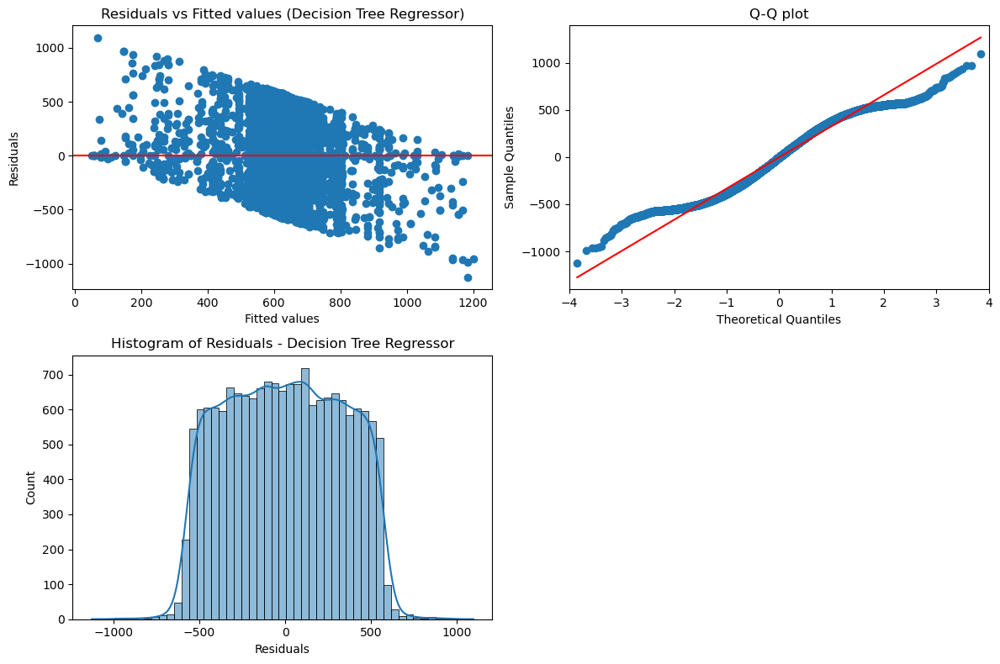

Decision Tree Regressor: RMSE 330.9576885644647, R2: -0.007694451287808324, Adjusted_R2: -0.011857979260195162, MAE: 283.5841316979212, Cross-Val Score: -110717.25057877298
{'randomforestregressor__n_estimators': [50, 100, 200], 'randomforestregressor__max_depth': [None, 10, 20, 30]}
Best parameters for Random Forest Regressor is {'randomforestregressor__max_depth': None, 'randomforestregressor__n_estimators': 200}


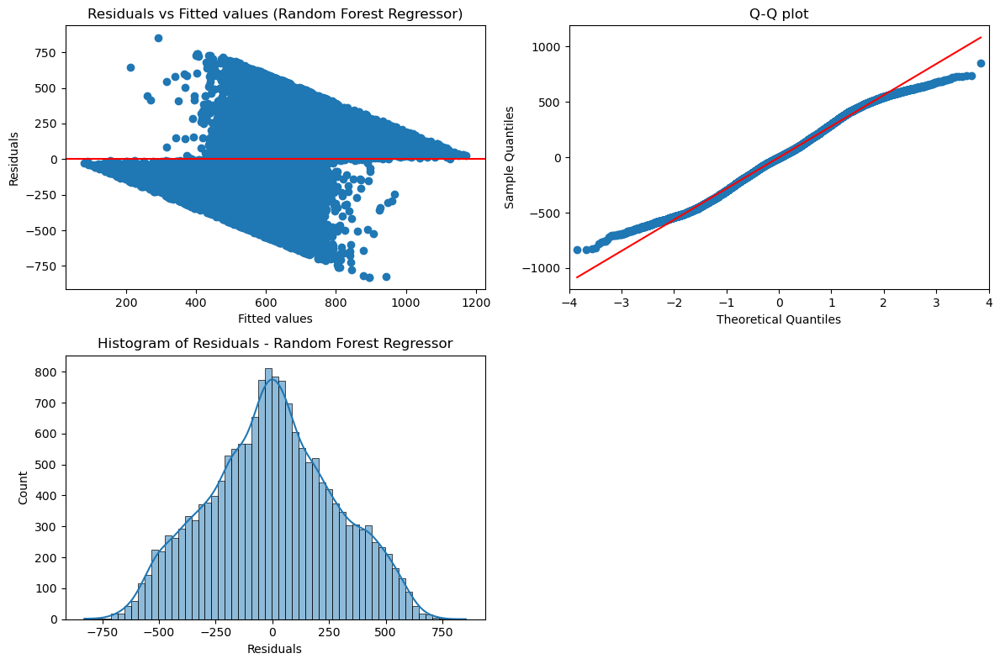

Random Forest Regressor: RMSE 281.1087718668133, R2: 0.27300284177270995, Adjusted_R2: 0.2699990810590762, MAE: 225.91390918744233, Cross-Val Score: -73830.17749197366
{'gradientboostingregressor__n_estimators': [100, 200], 'gradientboostingregressor__learning_rate': [0.01, 0.1], 'gradientboostingregressor__max_depth': [3, 5, 7]}
Best parameters for Gradient Boosting Regressor is {'gradientboostingregressor__learning_rate': 0.1, 'gradientboostingregressor__max_depth': 7, 'gradientboostingregressor__n_estimators': 200}


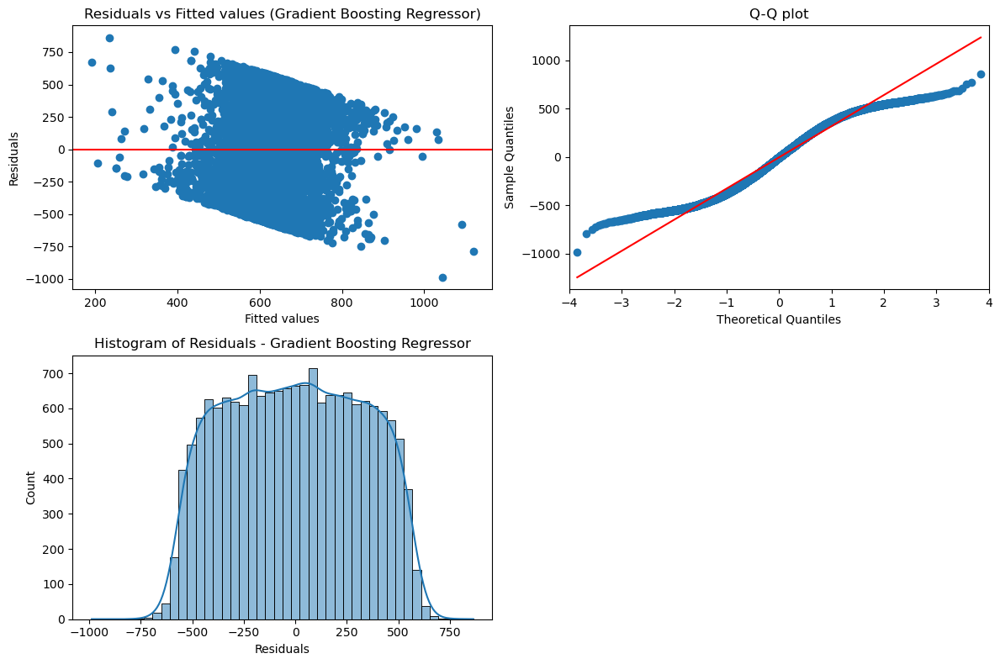

Gradient Boosting Regressor: RMSE 322.4200298622568, R2: 0.04362559357601947, Adjusted_R2: 0.03967410650756109, MAE: 276.4287951536403, Cross-Val Score: -103228.94607674089
{'supportvectorregressor__C': [0.1, 1, 10], 'supportvectorregressor__gamma': [0.001, 0.01, 0.1], 'supportvectorregressor__epsilon': [0.1, 0.2, 0.5]}
Best parameters for Support Vector Regressor is {'supportvectorregressor__C': 10, 'supportvectorregressor__epsilon': 0.1, 'supportvectorregressor__gamma': 0.001}


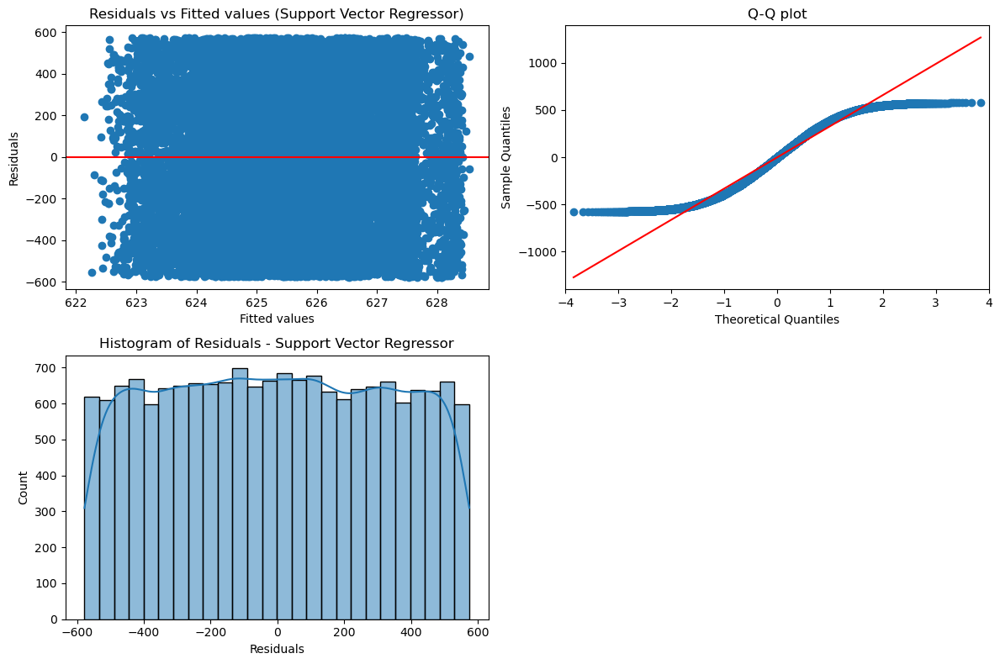

Support Vector Regressor: RMSE 329.6962366918433, R2: -2.7395502551152973e-05, Adjusted_R2: -0.004159245220495711, MAE: 284.5572322726185, Cross-Val Score: -110015.99652821741


In [123]:
#Run this for-loop. Everything needed for modelling was already defined (i.e. train-test, etc. ) in "Part 6- ML Modelling Setups" section
# Be very careful, as this code will take a long time to run, hence why it's been commented out.

for name, model in regression_models.items():
    param_grid = param_grids.get(name) # Retrieve the correct param_grid based on the bigger dictionary defined above.
    print(param_grid)
    model_evaluation(name, model, param_grid)

In [124]:
# Check total performance results in a table (minus Cross-Val Scores)
complex_models_performance_df = pd.DataFrame(complex_model_results)
complex_models_performance_df

,Model_Name,Model_Object_Saved,Best_Parameters,RMSE,Adjusted_R2,CrossVal_Score,Feature_Names
0,KNN Regressor,"(ColumnTransformer(transformers=[('num', MinMa...",{'knnregressor__n_neighbors': 8000},329.716246,-0.004281,-110008.785631,"[minimum_nights, number_of_reviews, reviews_pe..."
1,Decision Tree Regressor,"(ColumnTransformer(transformers=[('num', MinMa...",{'decisiontreeregressor__max_depth': 10},330.957689,-0.011858,-110717.250579,"[minimum_nights, number_of_reviews, reviews_pe..."
2,Random Forest Regressor,"(ColumnTransformer(transformers=[('num', MinMa...","{'randomforestregressor__max_depth': None, 'ra...",281.108772,0.269999,-73830.177492,"[minimum_nights, number_of_reviews, reviews_pe..."
3,Gradient Boosting Regressor,"(ColumnTransformer(transformers=[('num', MinMa...",{'gradientboostingregressor__learning_rate': 0...,322.420030,0.039674,-103228.946077,"[minimum_nights, number_of_reviews, reviews_pe..."
4,Support Vector Regressor,"(ColumnTransformer(transformers=[('num', MinMa...","{'supportvectorregressor__C': 10, 'supportvect...",329.696237,-0.004159,-110015.996528,"[minimum_nights, number_of_reviews, reviews_pe..."


* Each of the models above had poor performance results, as seen from the final results, therefore, we should consider alternatives, seen in Part 6b.
* With an adjusted R2 close to zero, and no significant improvements or differnces in RMSE or Cross-Val Scores, it's evident that we should consider other models as well. 
* We also see from the distribution of residuals, they are not normal, suggesting the model might not be the best fit due to potential variance (heteroscedasticity),  potential missing information like more features, or outliers. For outliers, you see from winsorization below that it doesn't make a significant improvement for Linear, Lasso and Ridge.

# Part 6b: Regression - Linear, Lasso + Ridge Regression

* This code is safer to run, as it's quite fast.

In [125]:
# Store results for these 3 models:
linear_reg_results = []

In [126]:
# Use the code below for Lasso and Ridge Regression
def second_evaluate_model(model_name, model, param_grid, X_train, y_train, X_test, y_test, preprocessor, results):
    # Create the pipeline
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    # Implement GridSearchCV
    grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Best model
    best_model = grid_search.best_estimator_
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    # Predictions
    y_pred = best_model.predict(X_test)

    # Claculate MSE, RMSE, R2, MAE for later
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    # Calculate Adjusted R-squared
    n = X_test.shape[0]
    p = X_test.shape[1]
    adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

    # Cross Validation Score check later:
    cv_scores = cross_val_score(best_model, X, y, cv=5, scoring="neg_mean_squared_error")

    # Look at Residual Analysis too:
    plot_residuals(y_test, y_pred, model_name)
    
    # Extract feature names using the best_model created for each model.
    feature_names = get_feature_names(best_model.named_steps['preprocessor'], X_train)

    # Record results:
    print(f"{model_name} - RMSE: {rmse:.4f}, R^2: {r2:.4f}, Adjusted R^2: {adjusted_r2:.4f}, MAE: {mae:.4f}, Cross-Val Score: {np.mean(cv_scores)}")

    # Store results:
    results.append({
        "Model_Name": model_name,
        "Model_Object_Saved": best_model,
        "Best_Parameters": grid_search.best_params_,
        "RMSE": rmse,
        "Adjusted_R2": adjusted_r2,
        "CrossVal_Score": np.mean(cv_scores),
        "Feature_Names": feature_names,
    })

In [127]:
# Define Lasso and Ridge Regression parameters:
lasso_param_grid = {'regressor__alpha': [0.01, 0.1, 1, 10]}
ridge_param_grid = {'regressor__alpha': [0.01, 0.1, 1, 10]}
lin_param_grid = {'regressor__fit_intercept': [True, False]}

Best parameters for Lasso Regression: {'regressor__alpha': 0.1}


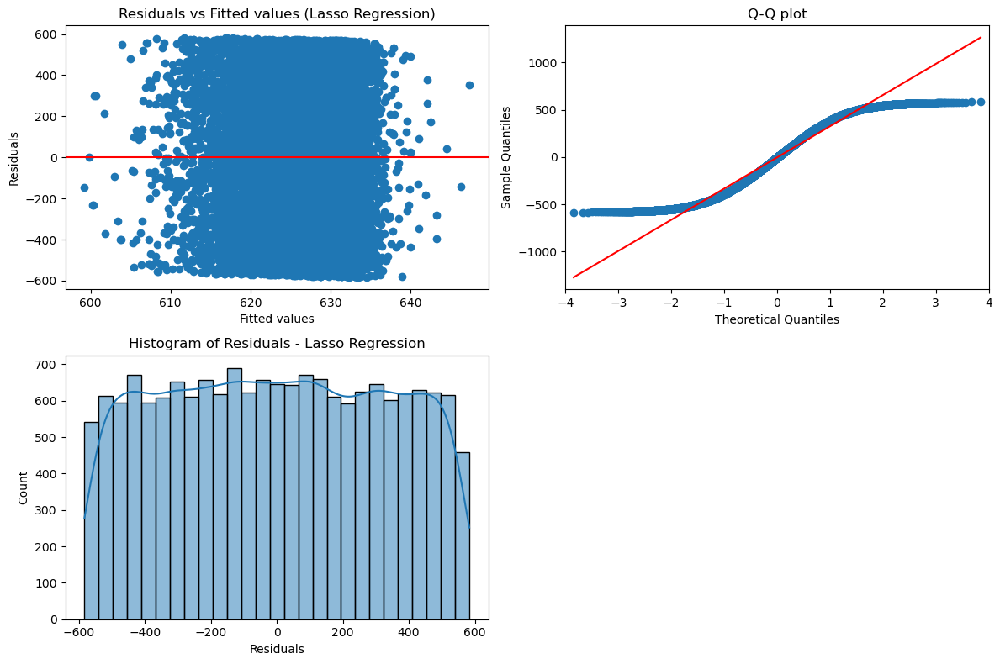

Lasso Regression - RMSE: 329.6523, R^2: 0.0002, Adjusted R^2: -0.0039, MAE: 284.5173, Cross-Val Score: -109988.45256400364
Best parameters for Ridge Regression: {'regressor__alpha': 10}


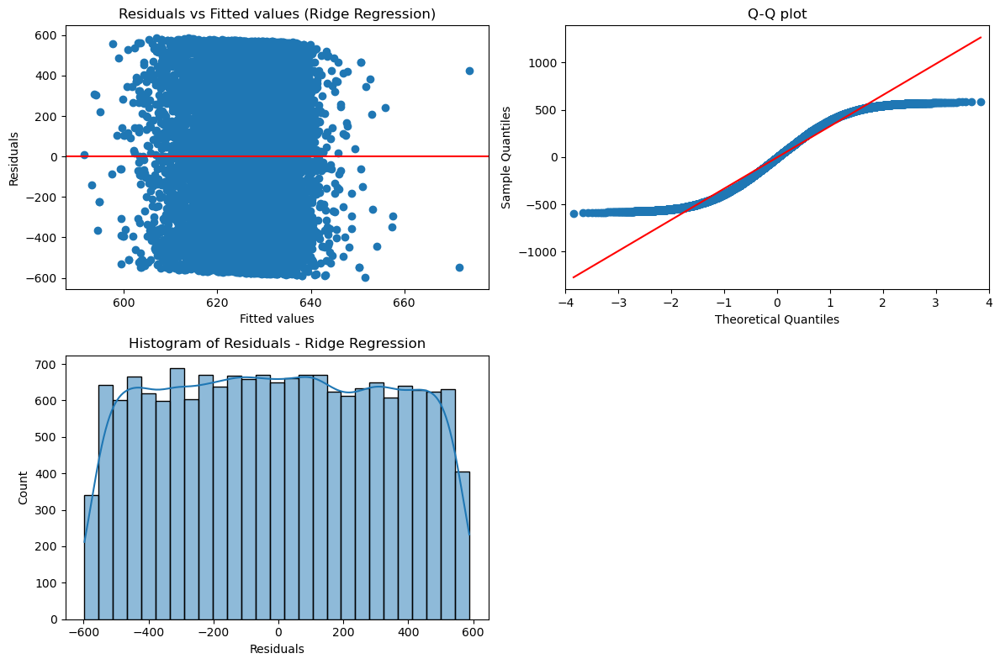

Ridge Regression - RMSE: 329.6624, R^2: 0.0002, Adjusted R^2: -0.0040, MAE: 284.5293, Cross-Val Score: -109995.85038459356
Best parameters for Linear Regression: {'regressor__fit_intercept': True}


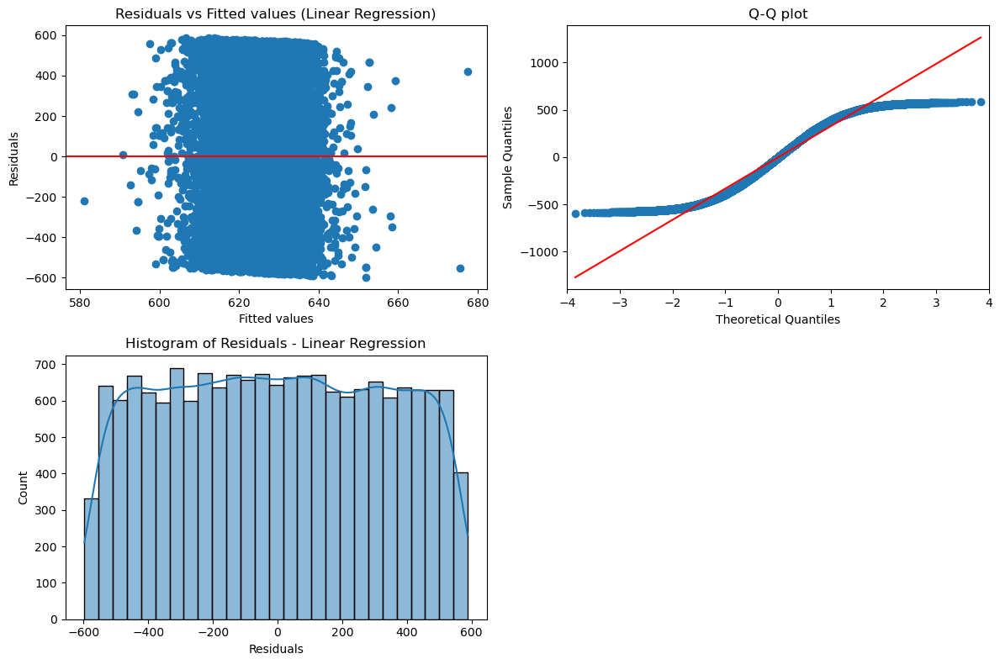

Linear Regression - RMSE: 329.6607, R^2: 0.0002, Adjusted R^2: -0.0039, MAE: 284.5268, Cross-Val Score: -109997.41170582452


In [128]:
# Evaluate both lasso and ridge:
second_evaluate_model("Lasso Regression", Lasso(), lasso_param_grid, X_train, y_train, X_test, y_test, preprocessor, linear_reg_results)
second_evaluate_model("Ridge Regression", Ridge(), lasso_param_grid, X_train, y_train, X_test, y_test, preprocessor, linear_reg_results)
second_evaluate_model("Linear Regression", LinearRegression(), lin_param_grid, X_train, y_train, X_test, y_test, preprocessor, linear_reg_results)

In [129]:
# Evaluation results so far:
regression_results_df = pd.DataFrame(linear_reg_results)

In [130]:
# View Results - we see Gradient Boosting Regressor does the best.
regression_results_df.sort_values(by = "Adjusted_R2", ascending= False)

,Model_Name,Model_Object_Saved,Best_Parameters,RMSE,Adjusted_R2,CrossVal_Score,Feature_Names
0,Lasso Regression,"(ColumnTransformer(transformers=[('num', MinMa...",{'regressor__alpha': 0.1},329.652263,-0.003891,-109988.452564,"[minimum_nights, number_of_reviews, reviews_pe..."
2,Linear Regression,"(ColumnTransformer(transformers=[('num', MinMa...",{'regressor__fit_intercept': True},329.660730,-0.003943,-109997.411706,"[minimum_nights, number_of_reviews, reviews_pe..."
1,Ridge Regression,"(ColumnTransformer(transformers=[('num', MinMa...",{'regressor__alpha': 10},329.662399,-0.003953,-109995.850385,"[minimum_nights, number_of_reviews, reviews_pe..."


In [131]:
# Looking at distribution of Numerical Distribution, we may have some outliers. We could consider some winsorization and re-run the models to see if there's any improvement.

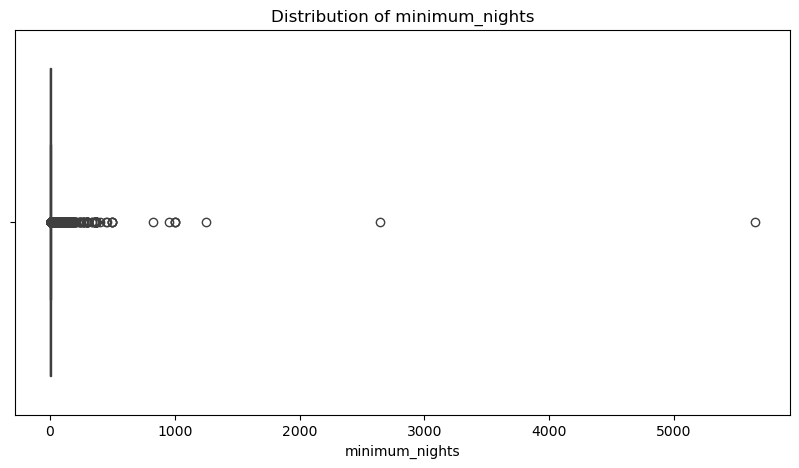

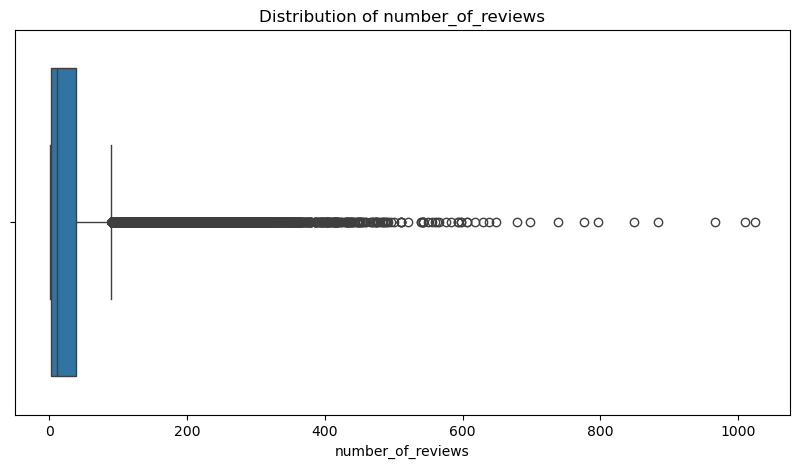

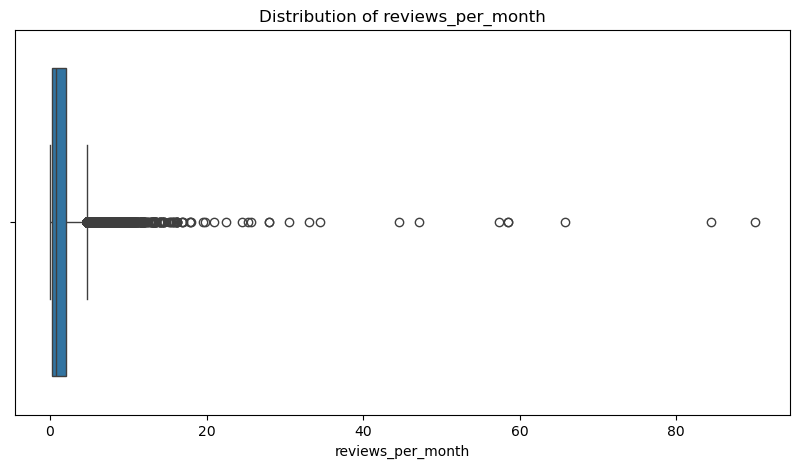

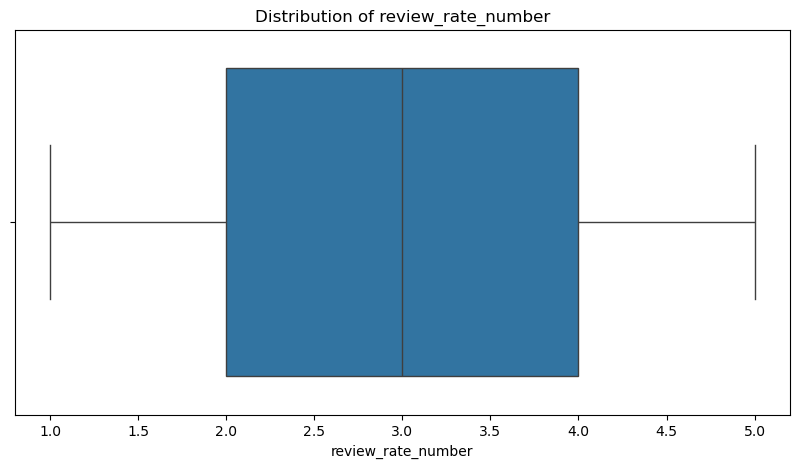

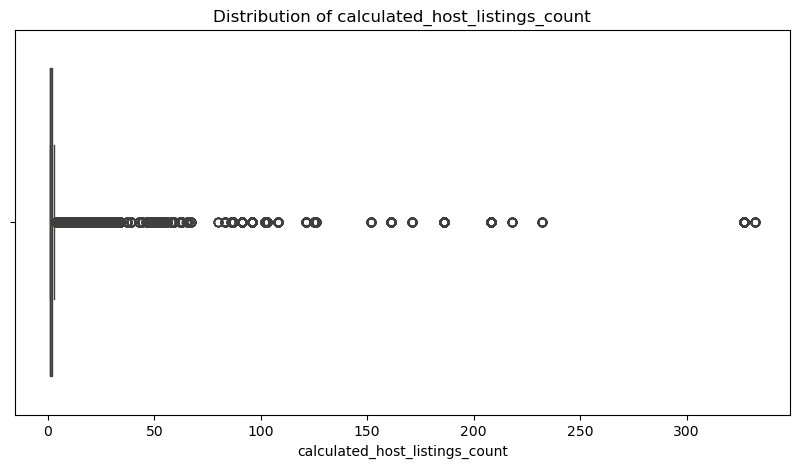

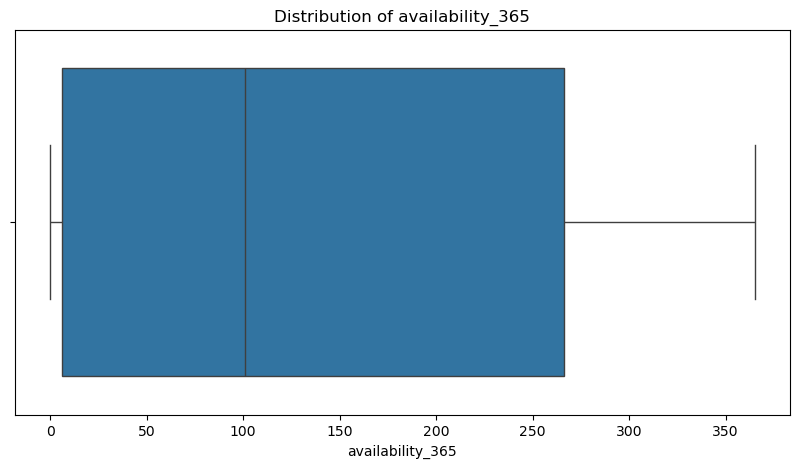

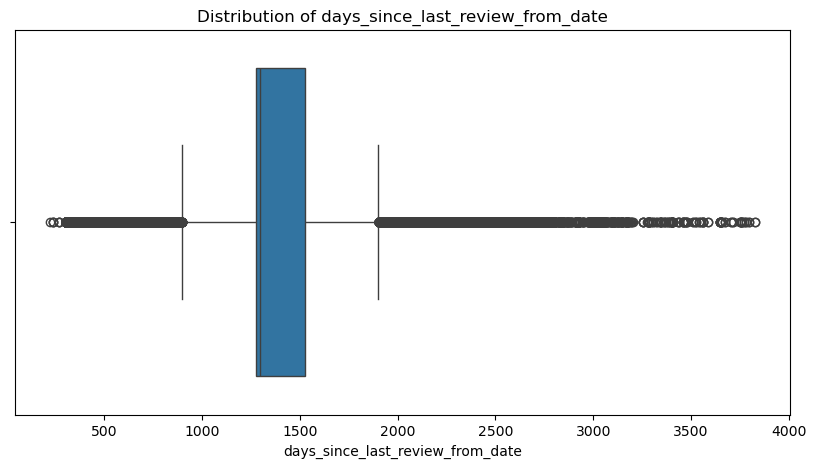

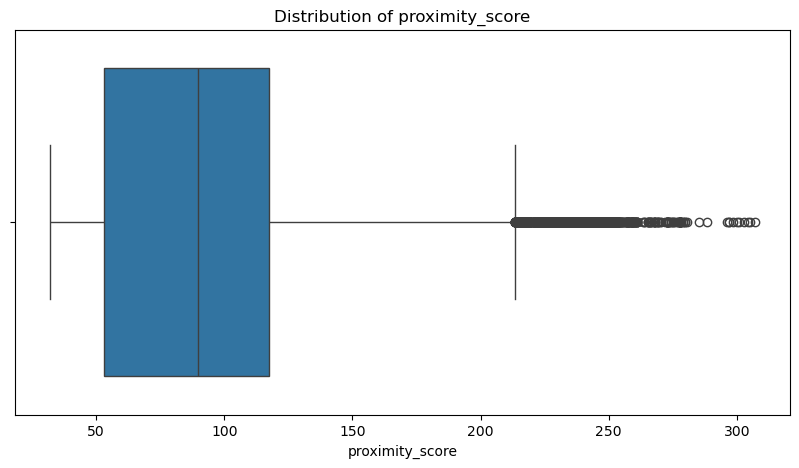

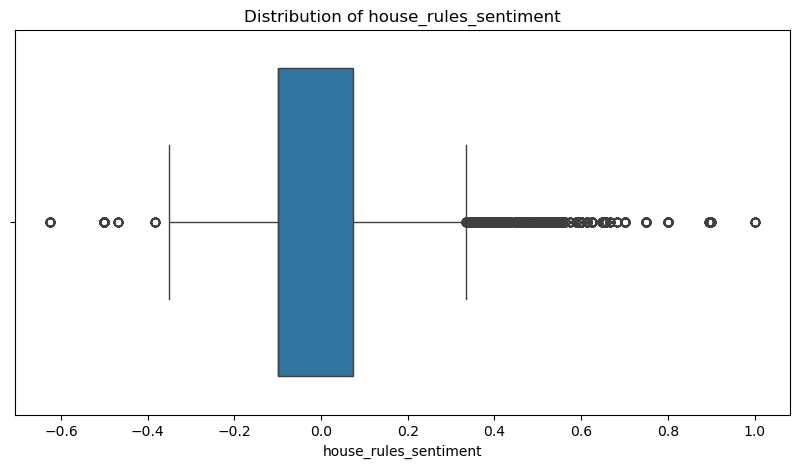

In [132]:
# Check Distribution of Numerical Columns:
for col in numerical_columns:
    plt.figure(figsize = (10,5))
    plt.title(f"Distribution of {col}")
    sns.boxplot(updated_df, x=col)

In [133]:
# New Dataframe for Winsorization:
new_df = updated_df.copy()

In [134]:
# Here are the important numerical columns considered in our model, that may require winsorization.
# Price, construction year and service fee are removed from consideration

numerical_columns = [
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'review_rate_number',
 'calculated_host_listings_count',
 'availability_365']

In [135]:
# Let's try with some winsorization:
# from scipy.stats.mstats import winsorize

# Winsorize the numerical columns at 95%
for col in numerical_columns:
    new_df[f"{col}_WINSORIZED"] = winsorize(new_df[col], limits=[0.05, 0.05])

In [136]:
# Store these winsorized results:
winsorized_results = []

Best parameters for Lasso Regression: {'regressor__alpha': 0.1}


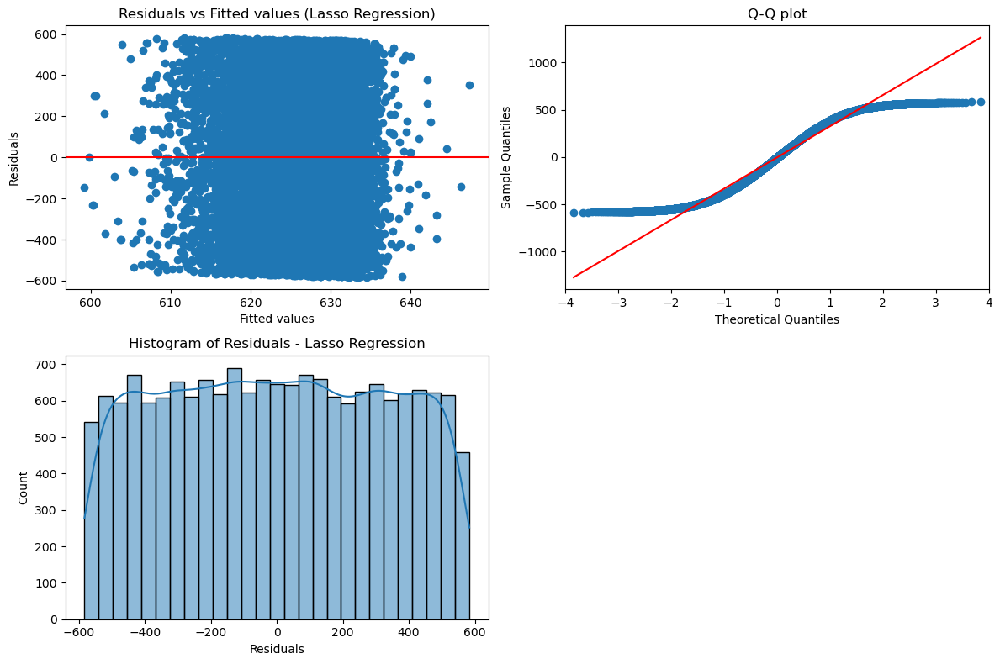

Lasso Regression - RMSE: 329.6523, R^2: 0.0002, Adjusted R^2: -0.0039, MAE: 284.5173, Cross-Val Score: -109988.45256400364
Best parameters for Ridge Regression: {'regressor__alpha': 10}


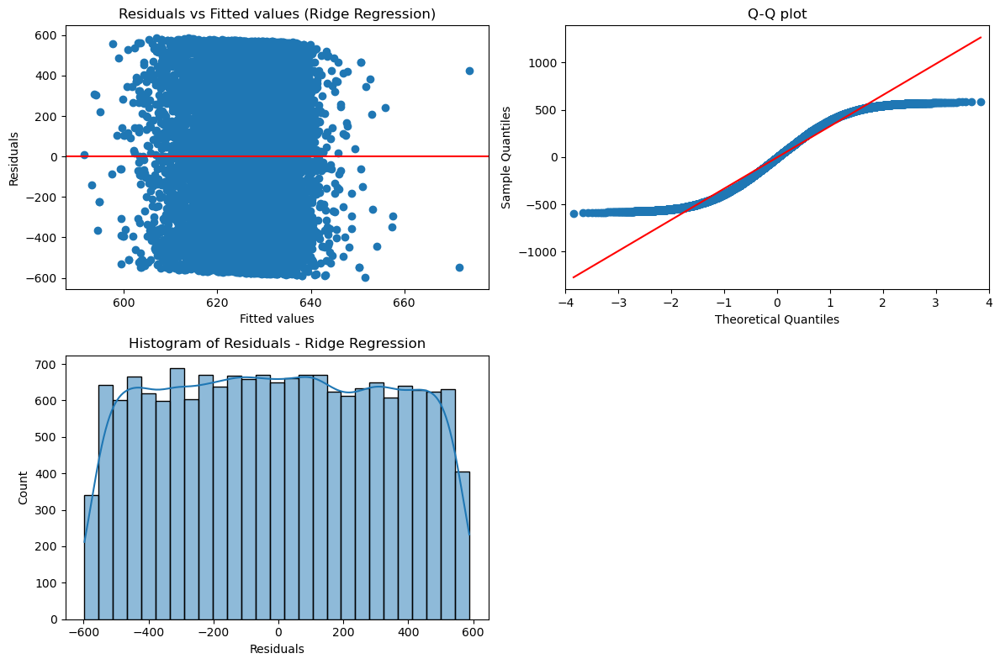

Ridge Regression - RMSE: 329.6624, R^2: 0.0002, Adjusted R^2: -0.0040, MAE: 284.5293, Cross-Val Score: -109995.85038459356
Best parameters for Linear Regression: {'regressor__fit_intercept': True}


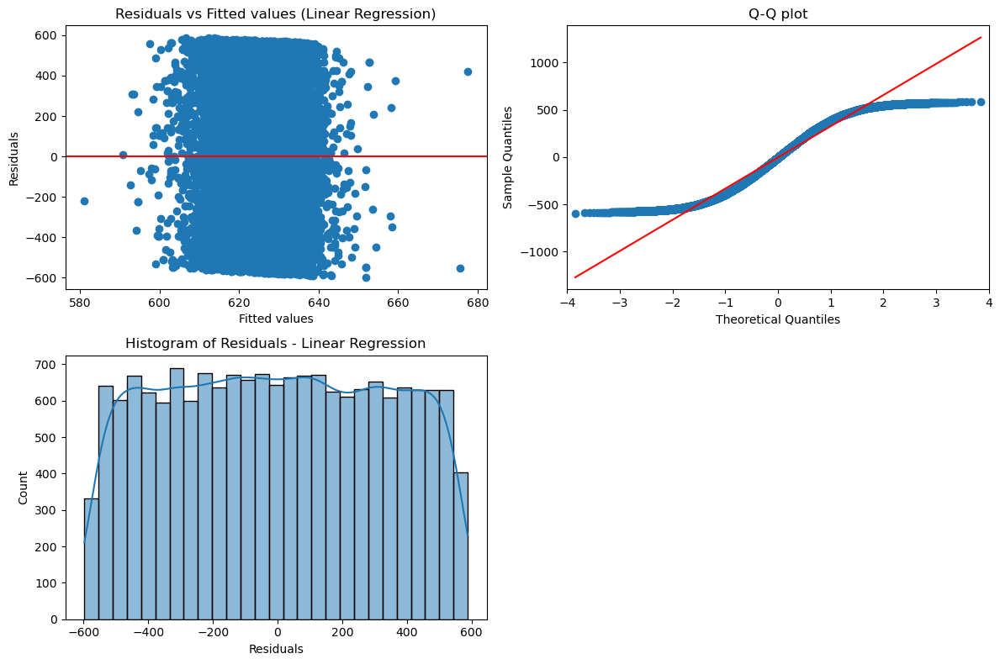

Linear Regression - RMSE: 329.6607, R^2: 0.0002, Adjusted R^2: -0.0039, MAE: 284.5268, Cross-Val Score: -109997.41170582452


In [137]:
# Run the models again:
second_evaluate_model("Lasso Regression", Lasso(), lasso_param_grid, X_train, y_train, X_test, y_test, preprocessor, winsorized_results)
second_evaluate_model("Ridge Regression", Ridge(), lasso_param_grid, X_train, y_train, X_test, y_test, preprocessor, winsorized_results)
second_evaluate_model("Linear Regression", LinearRegression(), lin_param_grid, X_train, y_train, X_test, y_test, preprocessor, winsorized_results)

* Despite Winsorization to reduce the effect of extreme values we saw in some numerical variables, the performance still hovered very low, close to 0 for adjusted R2 and no major improvements for RMSE.

In [138]:
# Check results from winsorization in summary:
winsorized_results_df = pd.DataFrame(winsorized_results)
display(winsorized_results_df)

,Model_Name,Model_Object_Saved,Best_Parameters,RMSE,Adjusted_R2,CrossVal_Score,Feature_Names
0,Lasso Regression,"(ColumnTransformer(transformers=[('num', MinMa...",{'regressor__alpha': 0.1},329.652263,-0.003891,-109988.452564,"[minimum_nights, number_of_reviews, reviews_pe..."
1,Ridge Regression,"(ColumnTransformer(transformers=[('num', MinMa...",{'regressor__alpha': 10},329.662399,-0.003953,-109995.850385,"[minimum_nights, number_of_reviews, reviews_pe..."
2,Linear Regression,"(ColumnTransformer(transformers=[('num', MinMa...",{'regressor__fit_intercept': True},329.660730,-0.003943,-109997.411706,"[minimum_nights, number_of_reviews, reviews_pe..."


# Part 6c: Boxcox Transformation - Price Variable (Linear, Lasso, Ridge Regression)

In [139]:
regression_model_cols = ['minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365',
       'days_since_last_review_from_date', 'apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clinic', 'near_stadium', 'near_beach',
       'near_zoo', 'proximity_score', 'house_rules_sentiment', 'has_wifi',
       'has_kitchen', 'season_Spring', 'season_Summer', 'season_Winter',
       'host_identity_verified_verified', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'instant_bookable_True',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room']

In [140]:
# New DF for analysis
boxcox_df = updated_df.copy()

In [141]:
# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', MinMaxScaler())
])

# Apply preprocessing
X_train_scaled = preprocessor.fit_transform(X_train)
X_test_scaled = preprocessor.transform(X_test)

In [142]:
# Perform Boxcox Transform and try again:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Attempt some models again:

# Apply Box-Cox transformation to 'price'
boxcox_df['price_boxcox'], price_lambda = boxcox(boxcox_df['price'] + 1)  # Avoid zero by adding one

# Define polynomial features - let's try 2nd power
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

# Define your features and target
# We cannot include certain columns due to colinearity and data leakage, so use the regression_model_cols list
X = boxcox_df[regression_model_cols]
y = boxcox_df['price_boxcox']

# Apply the train-test split again
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Apply preprocessing
X_train_scaled = preprocessor.fit_transform(X_train)
X_test_scaled = preprocessor.transform(X_test)

# Define polynomial features - let's try 2
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

# Apply polynomial features to training and test sets
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

# Function for quick model evaluation
def evaluate_model(model, X_train, X_test, y_train, y_test, price_lambda):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    #  Apply Boxcox transformation
    y_pred_transformed = inv_boxcox(y_pred, price_lambda)
    y_test_transformed = inv_boxcox(y_test, price_lambda)
    
    # Check for any NaNs
    if np.any(np.isnan(y_pred_transformed)) or np.any(np.isnan(y_test_transformed)):
        print(f"NaNs found in the inverse Box-Cox transformation for {model.__class__.__name__}")
        y_pred_transformed = np.nan_to_num(y_pred_transformed)
        y_test_transformed = np.nan_to_num(y_test_transformed)
    
    mse = mean_squared_error(y_test_transformed, y_pred_transformed)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_transformed, y_pred_transformed)
    mae = mean_absolute_error(y_test_transformed, y_pred_transformed)
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring="neg_mean_squared_error")
    
    print(f"{model.__class__.__name__} - RMSE: {rmse}, R2: {r2}, MAE: {mae}, Cross-Val Score: {np.mean(scores)}")

# -- Check top three models - Linear, Lasso and Ridge Regression

# Linear Regression
linear_regression_model = LinearRegression()
evaluate_model(linear_regression_model, X_train_poly, X_test_poly, y_train, y_test, price_lambda)

# Ridge Regression
ridge_regression_model = Ridge(alpha=1.0)
evaluate_model(ridge_regression_model, X_train_poly, X_test_poly, y_train, y_test, price_lambda)

# Lasso Regression
lasso_regression_model = Lasso(alpha=0.1)
evaluate_model(lasso_regression_model, X_train_poly, X_test_poly, y_train, y_test, price_lambda)

NaNs found in the inverse Box-Cox transformation for LinearRegression
LinearRegression - RMSE: 2080806.4788121416, R2: -39833391.94680901, MAE: 26482.453217864644, Cross-Val Score: -2.0988087764416028e+16
NaNs found in the inverse Box-Cox transformation for Ridge
Ridge - RMSE: 334.06191828673667, R2: -0.02668651770585373, MAE: 285.17791451836274, Cross-Val Score: -4047.880053066155
Lasso - RMSE: 330.377307817549, R2: -0.004163282964324777, MAE: 284.17714544348934, Cross-Val Score: -3893.612904143345


* After winsorization and applying Boxcox, we still see quite negative results for R2 and poor performance from RMSE and MAE across all models. Cross-Validation is also very poor.
* There is no with no major improvement(for all models attempted - KNN, Decision Tree, Random Forest, Gradient Boosting, Support Vector Machine, and now Linear/Ridge/Lasso). This makes sense, as we do have some inherent problems with the data.
* Let's move onto Classification problem.

# Part 7: Binary Classification - (LONG RUNTIME)

* Similar to previous sections, the code below may potentially take over 60 minutes to run depending on your laptop. The results were saved below.

In [143]:
# Package to help with running faster models
from sklearnex import patch_sklearn
patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [144]:
# Regression Columns - Recall, we don't need price, service_fee, construction year, and last review year + last review month

classif_cols = ['minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365',
       'days_since_last_review_from_date', 'apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clinic', 'near_stadium', 'near_beach',
       'near_zoo', 'proximity_score', 'house_rules_sentiment', 'has_wifi',
       'has_kitchen', 'season_Spring', 'season_Summer', 'season_Winter',
       'host_identity_verified_verified', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'instant_bookable_True',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room']

In [145]:
# We will store the results under this empty list, and put in table format later:
binary_results_initial= []

price_category
low     41962
high    41885
Name: count, dtype: int64


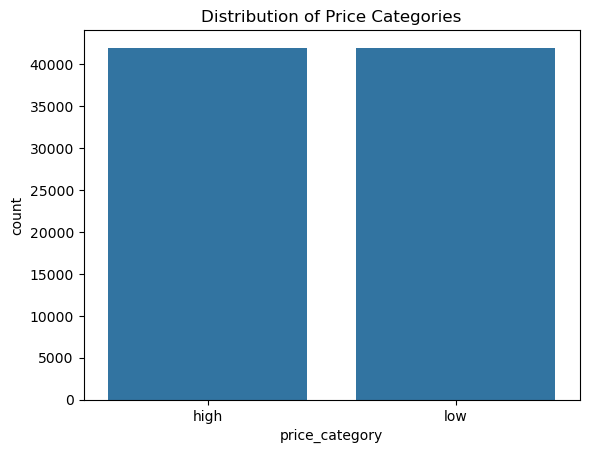

e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Model: LogisticRegression
Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.52      0.51      8348
           1       0.51      0.49      0.50      8422

    accuracy                           0.50     16770
   macro avg       0.50      0.50      0.50     16770
weighted avg       0.50      0.50      0.50     16770

Confusion Matrix:
[[4314 4034]
 [4293 4129]]
Precision: 0.5012199372603695
Recall: 0.5167704839482511


e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it w

Cross-Validation Precision Scores: [0.50238719 0.50081711 0.50806702 0.50364338 0.49786898]
Mean Cross-Validation Precision Score: 0.5025567357640968
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.54      0.54      8348
           1       0.55      0.55      0.55      8422

    accuracy                           0.55     16770
   macro avg       0.55      0.55      0.55     16770
weighted avg       0.55      0.55      0.55     16770

Confusion Matrix:
[[4524 3824]
 [3778 4644]]
Precision: 0.5449289327872802
Recall: 0.5419262098706277
Cross-Validation Precision Scores: [0.54590341 0.53737907 0.54895158 0.54324486 0.54819994]
Mean Cross-Validation Precision Score: 0.5447357699887373
Model: RandomForestClassifier
Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.59      0.57      8348
           1       0.57      0.54      0.56      8422

   

In [146]:
# Conduct Binary Classification First - see what happens.
# We split the price category (Low/high) from the median, as the price distribution is unique uniform to begin with.

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score
import xgboost as xgb
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = updated_df.copy()

# Create binary categories for price
median_price = df['price'].median()
df['price_category'] = np.where(df['price'] > median_price, 'high', 'low')

# Encode the price_category to numerical labels
label_encoder = LabelEncoder()
df['price_category_encoded'] = label_encoder.fit_transform(df['price_category'])

# Check for data imbalance
print(df['price_category'].value_counts())
sns.countplot(x='price_category', data=df)
plt.title('Distribution of Price Categories')
plt.show()

# Define your features and target
X = df[classif_cols]
y = df['price_category_encoded']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Apply preprocessing
X_train_scaled = preprocessor.fit_transform(X_train)
X_test_scaled = preprocessor.transform(X_test)


# Function to evaluate model with emphasis on precision and cross-validation
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    print(f"Model: {model.__class__.__name__}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    
    precision = precision_score(y_test, y_pred, pos_label=label_encoder.transform(['high'])[0])
    recall = recall_score(y_test, y_pred, pos_label=label_encoder.transform(['high'])[0])
    
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    
    # Cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='precision')
    print(f"Cross-Validation Precision Scores: {cv_scores}")
    print(f"Mean Cross-Validation Precision Score: {np.mean(cv_scores)}")
    
    # Store results in the list
    binary_results_initial.append({
        'Model': model.__class__.__name__,
        'Precision': precision,
        'Recall': recall,
        'CV Precision Scores': cv_scores,
        'Mean CV Precision Score': np.mean(cv_scores)
    })

# Logistic Regression
logistic_regression_model = LogisticRegression()
evaluate_model(logistic_regression_model, X_train_scaled, X_test_scaled, y_train, y_test)

# K-Nearest Neighbors Classifier
knn_model = KNeighborsClassifier(n_neighbors=5)
evaluate_model(knn_model, X_train_scaled, X_test_scaled, y_train, y_test)

# Random Forest Classifier
random_forest_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
evaluate_model(random_forest_model, X_train_scaled, X_test_scaled, y_train, y_test)

# Gradient Boosting Classifier
gradient_boosting_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
evaluate_model(gradient_boosting_model, X_train_scaled, X_test_scaled, y_train, y_test)

# XGBoost Classifier
xgboost_model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
evaluate_model(xgboost_model, X_train_scaled, X_test_scaled, y_train, y_test)

# LightGBM Classifier
lightgbm_model = lgb.LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
evaluate_model(lightgbm_model, X_train_scaled, X_test_scaled, y_train, y_test)

In [147]:
# Check results: 
binary_results_df = pd.DataFrame(binary_results_initial)
binary_results_df

# We see promise in Binary Classification, let's try again.
# Complete Binary Classification again, but with hyperparameter tuning & validation split, to confirm the classification report results are reflected in both forms of splits.
# So far, random_forest shows the best potential.

,Model,Precision,Recall,CV Precision Scores,Mean CV Precision Score
0,LogisticRegression,0.501220,0.516770,"[0.5023871862005237, 0.5008171148417768, 0.508...",0.502557
1,KNeighborsClassifier,0.544929,0.541926,"[0.5459034099675976, 0.5373790677220757, 0.548...",0.544736
2,RandomForestClassifier,0.559872,0.588644,"[0.5550414805360562, 0.5561456752655539, 0.564...",0.557698
3,GradientBoostingClassifier,0.513946,0.538572,"[0.5197705070553574, 0.513753456556542, 0.5182...",0.517544
4,XGBClassifier,0.510073,0.533781,"[0.5104785736628089, 0.5117157974300831, 0.513...",0.513782
5,LGBMClassifier,0.511203,0.532942,"[0.5144983718405954, 0.5146147032772365, 0.511...",0.512424


In [148]:
# Store results for later viewing:
binary_results_hyperparameter = []

price_category_binary
low     41962
high    41885
Name: count, dtype: int64


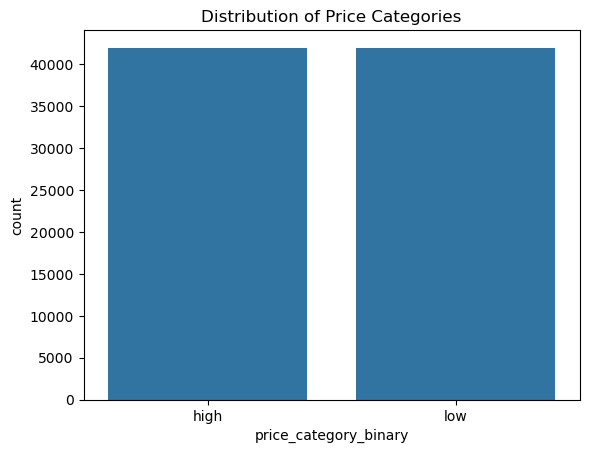

e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Best parameters for LogisticRegression: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.004832930238571752}
Model: LogisticRegression
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.67      0.58      6283
           1       0.51      0.35      0.41      6294

    accuracy                           0.51     12577
   macro avg       0.51      0.51      0.50     12577
weighted avg       0.51      0.51      0.49     12577

Test Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.66      0.57      6283
           1       0.50      0.34      0.41      6295

    accuracy                           0.50     12578
   macro avg       0.50      0.50      0.49     12578
weighted avg       0.50      0.50      0.49     12578

Precision: 0.5013214800576646
Recall: 0.6641731656851823


e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it w

Cross-Validation Precision Scores: [0.50479298 0.50636427 0.50684237 0.5058548  0.50244167]
Mean Cross-Validation Precision Score: 0.5052592191130859
Best parameters for RandomForestClassifier: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False}
Model: RandomForestClassifier
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.68      0.69      6283
           1       0.69      0.70      0.70      6294

    accuracy                           0.69     12577
   macro avg       0.69      0.69      0.69     12577
weighted avg       0.69      0.69      0.69     12577

Test Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.69      0.69      6283
           1       0.69      0.70      0.70      6295

    accuracy                           0.69     12578
   macro avg       0.69      0.69      0.69     12578
weight

e:\Anaconda\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 18 is smaller than n_iter=20. Running 18 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for KNeighborsClassifier: {'weights': 'distance', 'n_neighbors': 1000, 'metric': 'manhattan'}
Model: KNeighborsClassifier
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.51      0.93      0.65      6283
           1       0.57      0.09      0.16      6294

    accuracy                           0.51     12577
   macro avg       0.54      0.51      0.41     12577
weighted avg       0.54      0.51      0.41     12577

Test Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.94      0.65      6283
           1       0.54      0.07      0.13      6295

    accuracy                           0.51     12578
   macro avg       0.52      0.51      0.39     12578
weighted avg       0.52      0.51      0.39     12578

Precision: 0.5026387470207695
Recall: 0.9398376571701417
Cross-Validation Precision Scores: [0.54420432 0.53122757 0.52681388 0.54869817 0.5181891

[{'Model': 'LogisticRegression',
  'Precision': 0.5013214800576646,
  'Recall': 0.6641731656851823,
  'CV Precision Scores': array([0.50479298, 0.50636427, 0.50684237, 0.5058548 , 0.50244167]),
  'Mean CV Precision Score': 0.5052592191130859},
 {'Model': 'RandomForestClassifier',
  'Precision': 0.6972789115646258,
  'Recall': 0.6851822377844978,
  'CV Precision Scores': array([0.66388935, 0.65936455, 0.6608374 , 0.66200546, 0.65708076]),
  'Mean CV Precision Score': 0.660635502005794},
 {'Model': 'KNeighborsClassifier',
  'Precision': 0.5026387470207695,
  'Recall': 0.9398376571701417,
  'CV Precision Scores': array([0.54420432, 0.53122757, 0.52681388, 0.54869817, 0.51818917]),
  'Mean CV Precision Score': 0.5338266207724136}]

In [149]:
# Binary Classifcation (High/Low) with hyper-parameter tuning completed.
# We will focus on the main three - KNN, Logistic and Random Forest, as they show the most promise and take the least amount of computational power required for hyperparameter tuning.

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score
import xgboost as xgb
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = updated_df.copy()

# Create binary categories for price
median_price = df['price'].median()
df['price_category_binary'] = np.where(df['price'] > median_price, 'high', 'low')

# Encode the price_category to numerical labels
label_encoder = LabelEncoder()
df['price_category_binary_encoded'] = label_encoder.fit_transform(df['price_category_binary'])

# Check for data imbalance
print(df['price_category_binary'].value_counts())
sns.countplot(x='price_category_binary', data=df)
plt.title('Distribution of Price Categories')
plt.show()

# Define your features and target
X = df[classif_cols]
y = df['price_category_binary_encoded']

# Train-test-validation split - 70% is set aside as your training, then the remaining 30% is "temporary" set
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Of the 30% in the 2nd line, 50% (or 15%) will go to validation, and the remaining 15% goes to testing.
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Apply preprocessing steps
X_train_scaled = preprocessor.fit_transform(X_train)
X_val_scaled = preprocessor.transform(X_val)
X_test_scaled = preprocessor.transform(X_test)

# Function to evaluate model with emphasis on precision
def evaluate_model(model, X_train, X_val, X_test, y_train, y_val, y_test):
    model.fit(X_train, y_train)
    y_pred_val = model.predict(X_val)
    y_pred_test = model.predict(X_test)
    
    print(f"Model: {model.__class__.__name__}")
    print("Validation Classification Report:")
    print(classification_report(y_val, y_pred_val))
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))
    
    # Calculate precision and recall and later print it
    precision = precision_score(y_test, y_pred_test, pos_label=label_encoder.transform(['high'])[0])
    recall = recall_score(y_test, y_pred_test, pos_label=label_encoder.transform(['high'])[0])
    
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    
    # Cross-validation - Stratified KFolds for CV
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X_train, y_train, cv=skf, scoring='precision')
    print(f"Cross-Validation Precision Scores: {cv_scores}")
    print(f"Mean Cross-Validation Precision Score: {np.mean(cv_scores)}")
    
    # Save to list
    binary_results_hyperparameter.append({
        'Model': model.__class__.__name__,
        'Precision': precision,
        'Recall': recall,
        'CV Precision Scores': cv_scores,
        'Mean CV Precision Score': np.mean(cv_scores)
    })

# Hyperparameter tuning with RandomizedSearchCV
def hyperparameter_tuning(model, param_distributions, X_train, y_train):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    random_search = RandomizedSearchCV(model, param_distributions, n_iter=20, cv=skf, scoring='precision', n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)
    print(f"Best parameters for {model.__class__.__name__}: {random_search.best_params_}")
    return random_search.best_estimator_

# --- Models to Try Below ----

# Logistic Regression
logistic_regression_model = LogisticRegression()
logistic_regression_params = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
best_logistic_regression_model = hyperparameter_tuning(logistic_regression_model, logistic_regression_params, X_train_scaled, y_train)
evaluate_model(best_logistic_regression_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

# Random Forest Classifier
random_forest_model = RandomForestClassifier(random_state=42)
random_forest_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}
best_random_forest_model = hyperparameter_tuning(random_forest_model, random_forest_params, X_train_scaled, y_train)
evaluate_model(best_random_forest_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

# KNN Classifier
knn_model = KNeighborsClassifier()
knn_params = {
    'n_neighbors': [1000,5000,8000], # Try neighbors up to 10% of the dataset...
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}
best_knn_model = hyperparameter_tuning(knn_model, knn_params, X_train_scaled, y_train)
evaluate_model(best_knn_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

# Display the results
binary_results_hyperparameter

In [150]:
# View results - much better - especially Random Forest Classifier Model for Binary Classification!
binary_results_hyperparameter_df = pd.DataFrame(binary_results_hyperparameter)
binary_results_hyperparameter_df

,Model,Precision,Recall,CV Precision Scores,Mean CV Precision Score
0,LogisticRegression,0.501321,0.664173,"[0.5047929838874159, 0.5063642675306642, 0.506...",0.505259
1,RandomForestClassifier,0.697279,0.685182,"[0.6638893517747042, 0.6593645484949833, 0.660...",0.660636
2,KNeighborsClassifier,0.502639,0.939838,"[0.5442043222003929, 0.5312275664034458, 0.526...",0.533827


price_category_binary
low     41962
high    41885
Name: count, dtype: int64


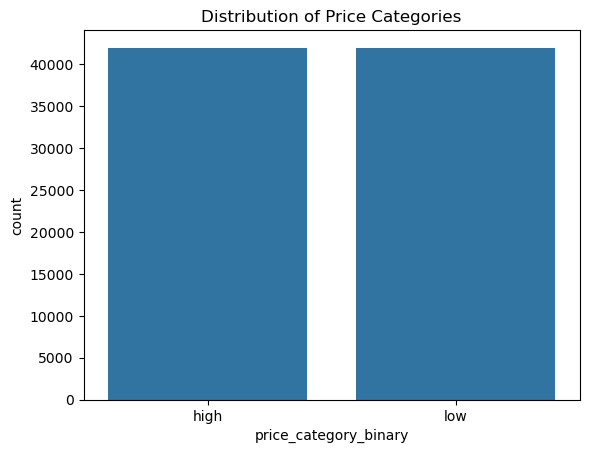

e:\Anaconda\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for GradientBoostingClassifier: {'subsample': 0.8, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.1}
Model: GradientBoostingClassifier
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.52      0.52      6283
           1       0.53      0.54      0.53      6294

    accuracy                           0.53     12577
   macro avg       0.53      0.53      0.53     12577
weighted avg       0.53      0.53      0.53     12577

Test Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.52      0.53      6283
           1       0.54      0.56      0.55      6295

    accuracy                           0.54     12578
   macro avg       0.54      0.54      0.54     12578
weighted avg       0.54      0.54      0.54     12578

Precision: 0.5393778954334878
Recall: 0.5188604169982493
Best parameters for XGBClassifier: {'subsample': 0.8, 'n_estimators

In [151]:
# Binary Classification - Additional Models, note they take a lot of computing power and a long time.
# These models take a long time, and the results are not significantly better than other models.

# Binary classification setup:# Load the dataset
df = updated_df.copy()

# Create binary categories for price
median_price = df['price'].median()
df['price_category_binary'] = np.where(df['price'] > median_price, 'high', 'low')

# Encode the price_category to numerical labels
label_encoder = LabelEncoder()
df['price_category_binary_encoded'] = label_encoder.fit_transform(df['price_category_binary'])

# Check for data imbalance
print(df['price_category_binary'].value_counts())
sns.countplot(x='price_category_binary', data=df)
plt.title('Distribution of Price Categories')
plt.show()

# Define your features and target
X = df[classif_cols]
y = df['price_category_binary_encoded']

# Train-test-validation split.
# Same as before - 70% for training, remaining 15% for validation and 15%esting.
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Apply preprocessing
X_train_scaled = preprocessor.fit_transform(X_train)
X_val_scaled = preprocessor.transform(X_val)
X_test_scaled = preprocessor.transform(X_test)

# Function to evaluate model with emphasis on precision, and also consider validation split
def evaluate_model(model, X_train, X_val, X_test, y_train, y_val, y_test):
    model.fit(X_train, y_train)
    y_pred_val = model.predict(X_val)
    y_pred_test = model.predict(X_test)
    
    print(f"Model: {model.__class__.__name__}")
    print("Validation Classification Report:")
    print(classification_report(y_val, y_pred_val))
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))
    
    precision = precision_score(y_test, y_pred_test, pos_label=label_encoder.transform(['high'])[0])
    recall = recall_score(y_test, y_pred_test, pos_label=label_encoder.transform(['high'])[0])
    
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")

# All the models at the bottom - more computationally heavy, so be careful when running this

# Gradient Boosting Classifier
gradient_boosting_model = GradientBoostingClassifier(random_state=42)
gradient_boosting_params = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
    'subsample': [0.8, 1.0]
}

best_gradient_boosting_model = hyperparameter_tuning(gradient_boosting_model, gradient_boosting_params, X_train_scaled, y_train)
evaluate_model(best_gradient_boosting_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

# XGBoost Classifier
xgboost_model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)
xgboost_params = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}
best_xgboost_model = hyperparameter_tuning(xgboost_model, xgboost_params, X_train_scaled, y_train)
evaluate_model(best_xgboost_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

lightgbm_model = lgb.LGBMClassifier(objective='binary', random_state=42)
lightgbm_params = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
    'num_leaves': [20, 30],
    'subsample': [0.8, 1.0]
}
best_lightgbm_model = hyperparameter_tuning(lightgbm_model, lightgbm_params, X_train_scaled, y_train)
evaluate_model(best_lightgbm_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

### Insights from this Binary Classification Analysis:
* Random Forest Classifier shows the most potential, with the best results from the initial modelling and the hyper-parameter tuning. 
* Let's also assess what would happen with Multi-class as well below.

# Part 8: Multiclass Classification - (LONG RUNTIME)

* The code below will take over 60 minutes to run, the outputs were saved and observed below.

In [152]:
# Store results  in multi-class list:
multi_class_results = []

In [153]:
# Multi-class modelling with hyperparameter tuning:

# Import Statements:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, make_scorer, precision_score, recall_score, f1_score, accuracy_score
import xgboost as xgb
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = updated_df.copy()

# Create categories for price
df['price_class'] = pd.qcut(df['price'], q=3, labels=['low', 'medium', 'high'])

# Drop the original price column, construction_year, and service_fee since they're all high on collinearity
df.drop(['price', 'service_fee', 'construction_year'], axis=1, inplace=True)

# Encode the price_class to numerical labels - be careful not to mix names with the other binary one
label_encoder = LabelEncoder()
df['price_class_encoded'] = label_encoder.fit_transform(df['price_class'])

# Define your features and target
X = df[classif_cols]
y = df['price_class_encoded']

# Train-test-validation split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Fit X-Train and X-Val, applying the Scaler above as well.
X_train_scaled = preprocessor.fit_transform(X_train)
X_val_scaled = preprocessor.transform(X_val)
X_test_scaled = preprocessor.transform(X_test)


# Model Evaluation
def evaluate_model(model, X_train, X_test, y_train, y_test, results_list):
    # Cross-validation with precision as the focus
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='precision_weighted')
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    results_list.append({
        'Model': model.__class__.__name__,
        'Mean Precision': scores.mean(),
        'Std Precision': scores.std()
    })
    
    print(f"Model: {model.__class__.__name__}")
    print("Cross-Validation Precision Scores:")
    print(f"  Mean precision: {scores.mean():.4f}, Std: {scores.std():.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

# Hyperparameter tuning with precision as the primary metric
def hyperparameter_tuning(model, param_distributions, X_train, y_train):
    random_search = RandomizedSearchCV(model, param_distributions, n_iter=10, cv=3, scoring='precision_weighted', n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)
    print(f"Best parameters for {model.__class__.__name__}: {random_search.best_params_}")
    return random_search.best_estimator_

# --- Models below parameters for hyperparameter tuning, along with evaluation in one step - will take a while ---

# Logistic Regression
logistic_regression_model = LogisticRegression()
param_grid_lr = {
    'penalty': ['l1', 'l2'],
    'C': np.logspace(-4, 4, 3),  # Reduced range
    'solver': ['liblinear']
}
best_lr = hyperparameter_tuning(logistic_regression_model, param_grid_lr, X_train_scaled, y_train)

# Random Forest Classifier
random_forest_model = RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}
best_rf = hyperparameter_tuning(random_forest_model, param_grid_rf, X_train_scaled, y_train)

# Gradient Boosting Classifier
gradient_boosting_model = GradientBoostingClassifier(random_state=42)
param_grid_gb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
    'subsample': [0.8, 1.0]
}
best_gb = hyperparameter_tuning(gradient_boosting_model, param_grid_gb, X_train_scaled, y_train)

# XGBoost Classifier
xgboost_model = xgb.XGBClassifier(random_state=42)
param_grid_xgb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}
best_xgb = hyperparameter_tuning(xgboost_model, param_grid_xgb, X_train_scaled, y_train)

# LightGBM Classifier
lightgbm_model = lgb.LGBMClassifier(random_state=42)
param_grid_lgb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 4],
    'num_leaves': [20, 30],
    'subsample': [0.8, 1.0]
}
best_lgb = hyperparameter_tuning(lightgbm_model, param_grid_lgb, X_train_scaled, y_train)

# KNN Classifier
knn_model = KNeighborsClassifier()
param_grid_knn = {
    'n_neighbors': [10, 20, 30],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}
best_knn = hyperparameter_tuning(knn_model, param_grid_knn, X_train_scaled, y_train)

e:\Anaconda\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Best parameters for LogisticRegression: {'solver': 'liblinear', 'penalty': 'l1', 'C': 1.0}
Best parameters for RandomForestClassifier: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20, 'bootstrap': False}
Best parameters for GradientBoostingClassifier: {'subsample': 0.8, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.1}
Best parameters for XGBClassifier: {'subsample': 0.8, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.1, 'colsample_bytree': 1.0}
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1897
[LightGBM] [Info] Number of data points in the train set: 58692, number of used features: 58
[LightGBM] [Info] Start training from score -1.099328
[LightGBM] [Info] Start training from score -1.095958
[LightGBM] [Info] Start training f

In [154]:
# Evaluate the best models on the test set
print("\nEvaluating the best models on the test set:")
evaluate_model(best_lr, X_train_scaled, X_test_scaled, y_train, y_test, multi_class_results)
evaluate_model(best_rf, X_train_scaled, X_test_scaled, y_train, y_test, multi_class_results)
evaluate_model(best_knn, X_train_scaled, X_test_scaled, y_train, y_test, multi_class_results)

# These models were evaluated, but require a lot of power: 
evaluate_model(best_gb, X_train_scaled, X_test_scaled, y_train, y_test, multi_class_results)
evaluate_model(best_xgb, X_train_scaled, X_test_scaled, y_train, y_test, multi_class_results)
evaluate_model(best_lgb, X_train_scaled, X_test_scaled, y_train, y_test, multi_class_results)


Evaluating the best models on the test set:


e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
e:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it w

Model: LogisticRegression
Cross-Validation Precision Scores:
  Mean precision: 0.3423, Std: 0.0021
Test Classification Report:
              precision    recall  f1-score   support

        high       0.34      0.36      0.35      4190
         low       0.35      0.29      0.32      4204
      medium       0.34      0.38      0.36      4184

    accuracy                           0.34     12578
   macro avg       0.34      0.34      0.34     12578
weighted avg       0.34      0.34      0.34     12578

Test Confusion Matrix:
[[1505 1086 1599]
 [1456 1213 1535]
 [1432 1157 1595]]
Model: RandomForestClassifier
Cross-Validation Precision Scores:
  Mean precision: 0.5270, Std: 0.0052
Test Classification Report:
              precision    recall  f1-score   support

        high       0.56      0.55      0.56      4190
         low       0.58      0.53      0.55      4204
      medium       0.54      0.59      0.56      4184

    accuracy                           0.56     12578
   macro av

# Part 9: Optimal Model - Random Forest Classifier (Binary Classification)

In [127]:
# Recreate the model here with the best parameters identified above:
# Best parameters for RandomForestClassifier: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False}

# Random Forest Classifier
random_forest_model = RandomForestClassifier(random_state=42)
random_forest_params = {
    'n_estimators': [300],
    'max_depth': [None],
    'min_samples_split': [10],
    'min_samples_leaf': [1],
    'bootstrap': [False]
}

In [128]:
# These were the columns identified for classification modelling
classif_cols = ['minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365',
       'days_since_last_review_from_date', 'apartment', 'building', 'check',
       'clean', 'guests', 'home', 'house', 'leave', 'neighbors',
       'noise', 'pets', 'property', 'quiet', 'respect', 'respectful', 'room',
       'rules', 'shoes', 'smoking', 'stay', 'time', 'unknown', 'allow_parties',
       'prohibit_parties', 'near_subway', 'near_park', 'near_museum',
       'near_restaurant', 'near_bar', 'near_cafe', 'near_grocery',
       'near_market', 'near_theater', 'near_shopping', 'near_gym',
       'near_school', 'near_library', 'near_pharmacy', 'near_bank',
       'near_hospital', 'near_clinic', 'near_stadium', 'near_beach',
       'near_zoo', 'proximity_score', 'house_rules_sentiment', 'has_wifi',
       'has_kitchen', 'season_Spring', 'season_Summer', 'season_Winter',
       'host_identity_verified_verified', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'instant_bookable_True',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'room_type_Hotel room', 'room_type_Private room',
       'room_type_Shared room']

In [129]:
# Let's step up the model again:
# Load the dataset
df = updated_df.copy()

# Create binary categories for price
median_price = df['price'].median()
df['price_category_binary'] = np.where(df['price'] > median_price, 'high', 'low')

# Encode the price_category to numerical labels
label_encoder = LabelEncoder()
df['price_category_binary_encoded'] = label_encoder.fit_transform(df['price_category_binary'])

# Define your features and target
X = df[classif_cols] # We already defined above which columns we care about.
y = df['price_category_binary_encoded']

# Train-test-validation split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Define preprocessing pipeline
preprocessor = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Apply preprocessing for X test and X train for scaling:
X_train_scaled = preprocessor.fit_transform(X_train)
X_val_scaled = preprocessor.transform(X_val)
X_test_scaled = preprocessor.transform(X_test)

In [130]:
# Check what all columns look like and exist here:
pd.set_option('display.max_columns', None)
df

,id,NAME,host_id,host_name,neighbourhood,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,last_review_NEW,last_review_year,last_review_month,days_since_last_review_from_date,apartment,building,check,clean,guests,home,house,kitchen,leave,neighbors,noise,pets,property,quiet,respect,respectful,room,rules,shoes,smoking,stay,time,unknown,allow_parties,prohibit_parties,near_subway,near_park,near_museum,near_restaurant,near_bar,near_cafe,near_grocery,near_market,near_theater,near_shopping,near_gym,near_school,near_library,near_pharmacy,near_bank,near_hospital,near_clinic,near_stadium,near_beach,near_zoo,proximity_score,house_rules_sentiment,has_wifi,has_kitchen,season_Spring,season_Summer,season_Winter,host_identity_verified_verified,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,instant_bookable_True,cancellation_policy_moderate,cancellation_policy_strict,room_type_Hotel room,room_type_Private room,room_type_Shared room,price_category_binary,price_category_binary_encoded
0,1001254,Clean & quiet apt home by the park,80014485718,Madaline,Kensington,40.64749,-73.97237,2020.0,966.0,193.0,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,2021-10-19,2021,10,438,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,117.744,0.366667,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,high,0
1,1002102,Skylit Midtown Castle,52335172823,Jenna,Midtown,40.75362,-73.98377,2007.0,142.0,28.0,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,2022-05-21,2022,5,224,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,34.406,0.206818,0,0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,low,1
2,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,Lyndon,East Harlem,40.79851,-73.94399,2009.0,204.0,41.0,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",2018-11-19,2018,11,1503,0,0,0,0,0,0,2,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,62.288,0.100000,0,0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,low,1
3,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,Michelle,Murray Hill,40.74767,-73.97500,2013.0,577.0,115.0,3.0,74.0,6/22/2019,0.59,3.0,1.0,365.0,"No smoking, please, and no drugs.",2019-06-22,2019,6,1288,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,37.304,0.000000,0,0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,low,1
4,1005202,BlissArtsSpace!,90821839709,Emma,Bedford-Stuyvesant,40.68688,-73.95596,2009.0,1060.0,212.0,45.0,49.0,10/5/2017,0.40,5.0,1.0,219.0,House Guidelines for our BnB We are delighted ...,2017-10-05,2017,10,1913,0,0,1,0,0,2,2,0,0,0,0,0,0,0,1,0,1,0,2,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,86.624,0.475000,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,high,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83842,7142360,Great Nolita Apartment!,8205519129,Victoria,SoHo,40.72214,-73.99793,2014.0,552.0,110.0,2.0,89.0,6/2/2019,1.94,1.0,1.0,187.0,In fairness to the other owners who live on th...,2019-06-02,2019,6,1308,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,38.498,0.129079,0,0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,low,1
83843,7142912,Spacious Brooklyn Home Close to NYC,46903240469,Ajna,Bedford-Stuyvesant,40.68552,-73.953

In [131]:
# Hyperparameter tuning using RandomSearchCV to avoid taking a lot time:
def hyperparameter_tuning(model, param_distributions, X_train, y_train):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    random_search = RandomizedSearchCV(model, param_distributions, n_iter=20, cv=skf, scoring='precision', n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)
    print(f"Best parameters for {model.__class__.__name__}: {random_search.best_params_}")
    return random_search.best_estimator_

In [132]:
# Model Evaluation code (from previous section) - this considered validation split of X
def evaluate_model(model, X_train, X_val, X_test, y_train, y_val, y_test):
    model.fit(X_train, y_train)
    y_pred_val = model.predict(X_val)
    y_pred_test = model.predict(X_test)
    
    print(f"Model: {model.__class__.__name__}")
    print("Validation Classification Report:")
    print(classification_report(y_val, y_pred_val))
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))
    
    precision = precision_score(y_test, y_pred_test, pos_label=label_encoder.transform(['high'])[0])
    recall = recall_score(y_test, y_pred_test, pos_label=label_encoder.transform(['high'])[0])
    
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")

In [133]:
# Run the model with tuning like before, and evaluate accordingly
final_model= hyperparameter_tuning(random_forest_model, random_forest_params, X_train_scaled, y_train)
evaluate_model(final_model, X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test)

c:\Users\chris\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 1 is smaller than n_iter=20. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for RandomForestClassifier: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False}
Model: RandomForestClassifier
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.68      0.69      6283
           1       0.69      0.70      0.70      6294

    accuracy                           0.69     12577
   macro avg       0.69      0.69      0.69     12577
weighted avg       0.69      0.69      0.69     12577

Test Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.69      0.69      6283
           1       0.69      0.70      0.70      6295

    accuracy                           0.69     12578
   macro avg       0.69      0.69      0.69     12578
weighted avg       0.69      0.69      0.69     12578

Precision: 0.6977648202137998
Recall: 0.6856597166958459


In [134]:
# Let's import packages to look at Evaluation Metrics again for the Binary Classification Model
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
# from scikitplot.metrics import plot_roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

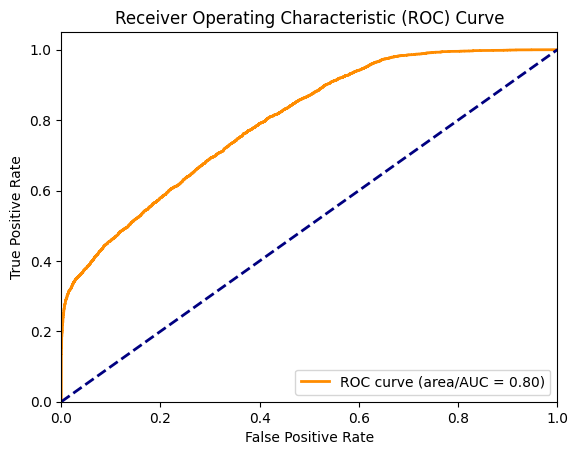

In [135]:
# Create and look at the ROC/AUC curve:
# Predict probabilities
y_pred_proba = final_model.predict_proba(X_test_scaled)[:, 1]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area/AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set xlim and ylim:
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

# Labels:
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')

# Show:
plt.legend(loc='lower right')
plt.show()

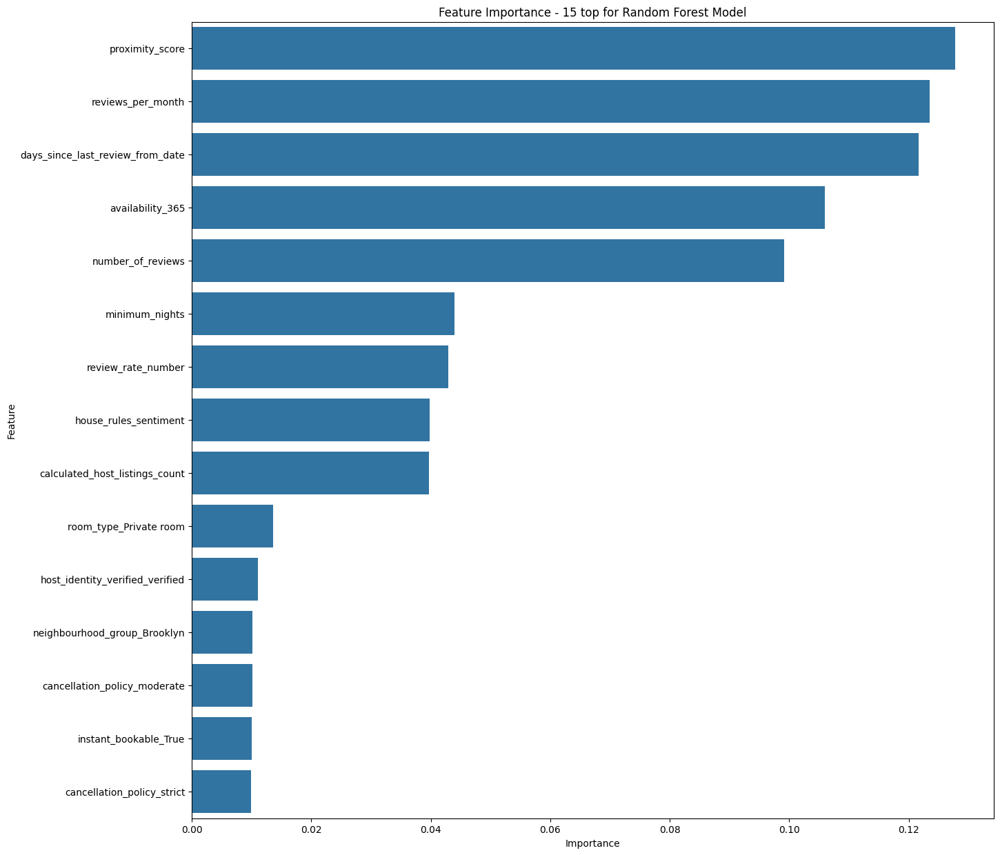

In [136]:
# Feature Importance from the Model:

# Extract feature importance
feature_importances = final_model.feature_importances_
features = X.columns

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).head(15)

# Plot feature importance
plt.figure(figsize=(15,15))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance - 15 top for Random Forest Model')
plt.show()

In [137]:
# Numerically, the important metric shown above:
feature_importance_df

,Feature,Importance
51,proximity_score,0.127797
2,reviews_per_month,0.123495
6,days_since_last_review_from_date,0.121660
5,availability_365,0.105930
1,number_of_reviews,0.099117
0,minimum_nights,0.043943
3,review_rate_number,0.042880
52,house_rules_sentiment,0.039785
4,calculated_host_listings_count,0.039675
67,room_type_Private room,0.013579


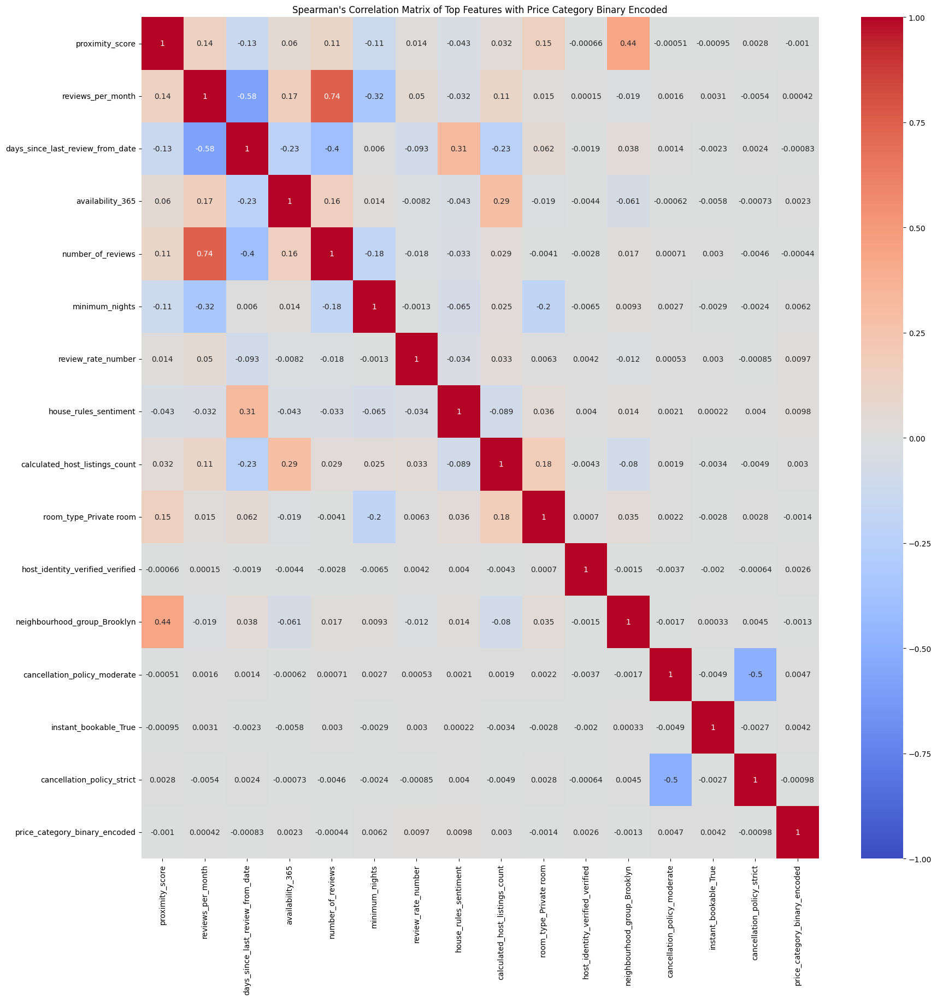

In [138]:
# Graph this with Spearman's Correlation  Matrix:
top_features = feature_importance_df['Feature'].tolist()
top_features.append('price_category_binary_encoded')

# Filter the DataFrame to include only these columns
df_filtered2 = df[top_features].copy()

# Use Spearman since we cannot assume linearity
spearman_corr_matrix = df_filtered2.corr(method='spearman')

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(spearman_corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title("Spearman's Correlation Matrix of Top Features with Price Category Binary Encoded")
plt.show()

### Clarification - Classication Modelling - Class Ranges

In [139]:
# Create new df
other_df = updated_df.copy()

In [140]:
# Define the cut:
other_df["price_bin_class"], bin_edges= pd.qcut(other_df["price"],2,["low", "high"], retbins = True)

# Check what was used to define it - it is the median value of $625 USD as the split.
bin_edges

array([  50.,  625., 1200.])

In [141]:
# Count the frequency of the classes:
other_df["price_bin_class"].value_counts()

price_bin_class
low     41962
high    41885
Name: count, dtype: int64

In [142]:
# Complete the same thing but Multi-class, low,medium,high:
other_df = updated_df.copy()

In [143]:
# Check the bin sizing is different here:
other_df["price_class"], bin_edges= pd.qcut(other_df["price"],3,["low", "medium", "high"], retbins= True)
bin_edges

array([  50.,  437.,  816., 1200.])

In [144]:
# Count the frequency of the classes:
other_df["price_class"].value_counts()

price_class
low       28023
high      27929
medium    27895
Name: count, dtype: int64

### Secondary Importance Analysis - Permutation Importance

In [145]:
# Calculate permutation importance
perm_importance = permutation_importance(final_model, X_test_scaled, y_test, n_repeats=10, random_state=42)

# Get the feature importance scores
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': perm_importance.importances_mean
}).sort_values(by='Importance', ascending=False)

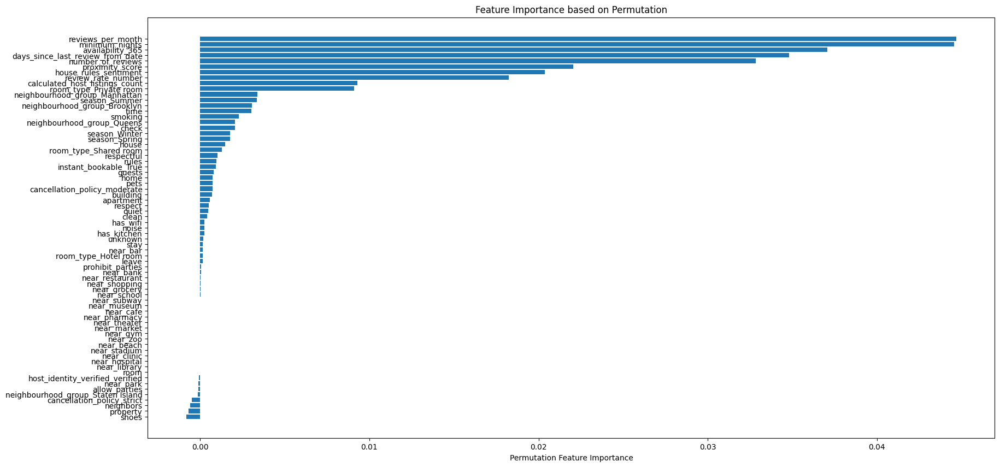

In [146]:
# Plot feature importance from Permutation Importance
plt.figure(figsize=(20, 10))
plt.barh(feature_importance['Feature'], feature_importance['Importance'])
plt.xlabel('Permutation Feature Importance')
plt.title('Feature Importance based on Permutation')
plt.gca().invert_yaxis()
plt.show()

In [147]:
# Assess Feature Importance from Permutation results.
feature_importance.sort_values(by = "Importance", ascending= True)

,Feature,Importance
24,shoes,-0.000819
18,property,-0.000676
15,neighbors,-0.000596
65,cancellation_policy_strict,-0.000493
62,neighbourhood_group_Staten Island,-0.000143
...,...,...
1,number_of_reviews,0.032851
6,days_since_last_review_from_date,0.034791
5,availability_365,0.037081
0,minimum_nights,0.044570


#### Findings:
* The permutation importance and regular feature importance have overlapping and similar identifications of feature importance, suggesting a robustness in the conclusions of important features.
* The permutation importance suggests feeatures to consider removing to improve the model in the future, such as some encoded variables like "property, shoes", and investigating cancellation_policy_strict, neighbourhood_group_Staten Island.

# Conclusions:

### Context: 
* The data analyticals and machine learning process was taken from Part 1 to 9.
* The dataset is Airbnb data from New York City.
* Our group's goal was to determine factors that may influence price and help Airbnb hosts increase the profit and therefore generate more revenue (as increasing properties or days stay has limited revenue generation opportunities).
* Since the business objective requires assisting Airbnb hosts in identifying and understanding what makes a property "high-price", the objective for Classification problems was to focus on "precision" - since the hosts must carefully determine which properties to invest time and resources. This will reduce false positives (mis-classification), but does risk missing actual Class 1 (high-price per day) properties. This trade-off and approach was determined most approach in making improved business decisions.


### Brief Summary of Findings: 
* Regression Modelling - despite attempts at meaningful feature engineering, data cleaning, winsorization and transformation, did not yield meaningful results, looking at metrics such as RMSE, Cross-Validation scoring, adjusted R-squared were quite low across all the models.
* Binary Classification yielded better results, and Multiclass Classification also performed better via the metrics of precision (our main focus), F1-score, accuracy (which was appropriate since the classes were balanced), cross-validation score, and the final model - Random Forest Classifier for binary classification problem, had an AUC of 0.8, which is quite good (closer to 1 means good performance distinguishing between the two classes).

### Actionable Insights from Features and Class 1 (High-Price properties):
* Feature Importance identified was: (1) Proximity score - suggesting properties that have lower proximity score, hence closer to major attractions, will drive classification to "high-price", (2) Reviews_per_month, days_since_last_review_from_dates and availability_365 suggest the importance of having the property active (not too long since last review) with good reviews to entice guests and justify higher price, (3) House_Rules_Sentiment also suggests the importance of maintaining a positive atmosphere as a host to justify higher price properties.
* Regarding potentially negative relationship with high-price properties: properties in farther locations like Brooklyn area, stricter cancellation policies, having private rooms, suggest it having a harder justification for higher prices, and less classification as Class 1.